# February 2023 Adaptation of Basic Analysis for Sources Without Known Pulsations
- although first few have spin periods in table so need to ask about that discrepancy

In [1]:
from uncertainties import ufloat
from uncertainties.umath import *
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.stats import LombScargle
from scipy import signal
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import scipy.optimize
import glob
from astropy.table import Table,join,vstack,unique
from importlib import reload
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sb
import scipy.stats as st
import wotan

import ogle as o #module

blue = 'cornflowerblue'
navy = 'navy'
purple = 'rebeccapurple'
pink = '#CF6275'
maroon = 'maroon'
teal = '#439590'

import matplotlib as mpl

#set plotting defaults
mpl.rcParams['xtick.major.size'] = 9
mpl.rcParams['xtick.major.width'] = 1.2
mpl.rcParams['xtick.minor.size'] = 4
mpl.rcParams['xtick.minor.width'] = 1.2

mpl.rcParams['ytick.major.size'] = 9
mpl.rcParams['ytick.major.width'] = 1.2
mpl.rcParams['ytick.minor.size'] = 4
mpl.rcParams['ytick.minor.width'] = 1.2

mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

mpl.rcParams['ytick.right'] = True

mpl.rcParams['ytick.minor.visible'] = True
mpl.rcParams['xtick.minor.visible'] = True

mpl.rcParams['xtick.top'] = True

In [2]:
#file names of part 2 objects
cross2 = Table.read('part2files.csv')
#table with all objects w/ additional info (est. period)
full = Table.read('smc_x_m03_zar_match_OGLE_v2.ascii',format='ascii')

In [3]:
#intersection of cross and full
cross = join(cross2,full,keys='src_n')

In [4]:
cross[:3]

src_n,name,RA,dec,OII I,OII V,OIII I,OIII V,OIV I,OIV V,OGLE,RA_OGLE,DEC_OGLE,ra_deg,dec_deg,perr,period,Porb,_RAJ2000_1,_DEJ2000_1,__M2002_,Vmag_1,Separation_1,_RAJ2000_2,_DEJ2000_2,Vmag_2,recno,Separation
int64,str14,str10,str11,str37,str37,str38,str38,str49,str49,str38,str11,str11,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64
1,smc116.2.6392,1:17:05.14,-73:26:36.0,--,--,smc_list/OGLE-III/I/smc116.2.6392.dat,smc_list/OGLE-III/V/smc116.2.5004.dat,--,--,OGLE,RA,DEC,19.271511,-73.443405,0.5,0.717,3.892,19.27120833333333,-73.44333333333334,77458,13.15,0.4041071611446303,19.271369999999997,-73.44318999999999,13.152,5068334,0.7879504646408463
8,smc108.8.124,0:54:10.27,-72:25:44.1,--,--,smc_list/OGLE-III/I/smc108.8.124.dat,smc_list/OGLE-III/V/smc108.8.287.dat,smc_list/OGLE-IV/I/CALIBRATED/smc719.19.388.dat,smc_list/OGLE-IV/V/CALIBRATED/smc719.19.2181.dat,OGLE,00:54:46.37,-72:25:22.8,13.541667,-72.42889,204.0,6.878,--,--,--,--,--,--,13.543004999999997,-72.42889,17.818,2613214,1.4542142814515069
19,smc_sc5.65500,0:49:11.45,-72:49:37.1,smc_list/OGLE-II/I/smc_sc5.65500.dat,smc_list/OGLE-II/V/smc_sc5.65500.dat,smc_list/OGLE-III/I/smc101.8.21127.dat,smc_list/OGLE-III/V/smc101.8.29697.dat,--,--,OGLE,RA,DEC,12.29786,-72.82671,0.5,18.37,17.79,12.297499999999998,-72.827,12841,15.61,1.0999411508632648,12.298035,-72.827,15.956,1933826,1.0477925156878831


In [5]:
#summary table
summ = pd.read_csv('Feb23_summtab.csv')
#table for phase-folded properties
phase = pd.read_csv('Feb23_phasetab.csv')

In [6]:
summ[:3] #has all source numbers, including part 2 but will have to add distinguishing column between part 1 and 2 sources

,src_n,ra_deg,dec_deg,spin period,perr,est. period,Coe est. period,Coe eccentricity,Coe eccentricity err,sep,...,mean abs bright residual,residual slope diff,bright res monotonic frac,bright - faint slope,best 2-200d period,2-200d period above FAL?,Haberl nearby period above FAL?,Coe nearby period above FAL?,# 2-200d peaks above FAL,best near Coe
0,1,19.271511,-73.443405,0.717,0.5,3.892,NaN,NaN,NaN,0.404107,...,NaN,NaN,NaN,NaN,0.000000,no,no,no,0,0.000000
1,2,20.418930,-72.959070,2.165,2.0,84.000,NaN,NaN,NaN,2.147143,...,0.001696,0.942942,0.400000,1.944302,83.943027,yes,yes,no,4,83.943027
2,3,13.639167,-73.683640,2.370,0.8,18.380,18.6,0.07,0.02,0.259701,...,0.052772,0.584826,0.623656,0.892035,9.298980,yes,no,no,2,17.404354


In [7]:
nums = cross['src_n']
peak_dict = dict.fromkeys(nums, [])

# remember to also write out peak dictionary as table
- can then analyze in another notebook

In [8]:
def addtotable(iband,vband,tab,num,interp,bpdet,nearby_peak_above_fal_Haberl,bpdet_Coe,nearby_peak_above_fal_Coe,overall_best_period,overall_peak_above_fal,num_peaks_above_fal):
    '''Automatically update some columns of summ table
    Called at the end of basic()
    function also in ogle.py but leaving here for now'''
    #row to update
    row = tab[tab['src_n']==num]
    #put in mean, stdev, max, min I and V band values
    row['mean I'] = np.mean(iband['I mag'])
    row['stdev I'] = np.std(iband['I mag'])
    row['min I'] = np.min(iband['I mag'])
    row['max I'] = np.max(iband['I mag'])
    row['I range'] = row['max I'] - row['min I']
    #repeat for V band
    row['mean V'] = np.mean(vband['V mag'])
    row['stdev V'] = np.std(vband['V mag'])
    row['min V'] = np.min(vband['V mag'])
    row['max V'] = np.max(vband['V mag'])
    row['V range'] = row['max V'] - row['min V']
    #add skew and kurtosis of I and V band mags
    row['I skew'] = st.skew(iband['I mag'])
    row['V skew'] = st.skew(vband['V mag'])
    row['I kurtosis'] = st.kurtosis(iband['I mag'])
    row['V kurtosis'] = st.kurtosis(vband['V mag'])
    row['I IQR'] = st.iqr(iband['I mag'])
    #best detrended period (close to established or 2 to 200 if no established)
    row['best auto det pd'] = bpdet
    
    #overall best period in 2-200 day range
    row['best 2-200d period'] = overall_best_period
    #is the overall best period above the preset FAL (currently 0.001)
    row['2-200d period above FAL?'] = overall_peak_above_fal
    #how many total peaks (at least with find peaks algorithm) are above the false alarm level?
    row['# 2-200d peaks above FAL'] = num_peaks_above_fal
    row['best near Coe'] = bpdet_Coe
    row['Haberl nearby period above FAL?'] = nearby_peak_above_fal_Haberl
    row['Coe nearby period above FAL?'] = nearby_peak_above_fal_Coe
    
    #correlation coefficients for Iint vs. V-I and V vs. V-I 
    icorr = np.corrcoef(vband['V mag']-interp,interp)[1][0]
    row['I V-I corr'] = icorr
    vcorr = np.corrcoef(vband['V mag']-interp,vband['V mag'])[1][0]
    row['V V-I corr'] = vcorr
    
    #redder when brighter(update criteria as needed)
    if icorr < -0.5 and vcorr < -0.5: row['redder when brighter'] = 'yes'
    elif icorr > 0.5 and vcorr > -0.5: row['redder when brighter'] = 'no'
    else: row['redder when brighter'] = 'check'
        
    #best fit lines to Iint vs. V-I and V vs. V-I 
    vi = vband['V mag']-interp
    imod = np.polyfit(vi,interp,1)
    #use coefficients to make string of equation
    #can decide if other format better and easier to use when pulling from table (e.g. breaking up into slope and int)
    row['I V-I slope'] = imod[0]
    row['I V-I int'] = imod[1] 
    #can add full = True to np.polyfit to also get sum of squares of residuals
    
    vmod = np.polyfit(vi,vband['V mag'],1)
    row['V V-I slope'] = vmod[0]
    row['V V-I int'] = vmod[1] 

    #update table
    tab[tab['src_n']==num] = row
    
    #calculate I vs. V-I correlation to determine if redder when brighter
    #for now, redder when brighter just based on I vs. V-I, not both
    return 

In [9]:
def addtophase(srcn,tab,pdict):
    '''Add to phase dictionary
    srcn: source number
    tab: phase table (pandas df)
    pdict: dictionary with quantities to add to tab'''
    row = tab[tab['src_n']==srcn]
    #loop through keys in pdict and add quantities to df
    for d in list(pdict.keys()):
        row[d] = pdict[d]
    tab[tab['src_n']==srcn] = row
    return

In [10]:
#define (new) source number and name dictionaries
csumm = pd.read_csv('current_summ.csv')
#make dictionary between orignal and new source numbers
src_dict = dict(zip(np.array(csumm['src_n']), np.array(csumm['new src_n'])))

#name from Feb23 file written out from part 1 but those soure numbers are old
name_dict = dict(zip(np.array(summ['src_n']), np.array(summ['name'])))

In [11]:
def basic(index,inset=True,title_all=True,pbins=10,det=False,color=pink,sigmas=[100,30,20,30],dists=[100,100,30,100],medlim=True,
          rettabs=False,saveall=False,cmap='magma',window=701,spline=True,btol=50,calib=False):
    '''Carry out basic anaylis of a single source
    To do: put peak frames into dictionary based on source number (as part of function rather than return statement)
    medlim: limits on detrended phase-fold 0.06 from median rather than showing all data points
    rettabs: return three peak tables, rather than adding them to dictionary peak_dict
    window: window to use in plotted detrended LC
    spline: use rspline from wotan to detrend LC
    btol: break tolerance for spline
    '''
    #get old and new source numbers using index, grab row from table, known orbital period, and print some basics
    srcn, nsrcn, row, orb = o.grab_initial_basic(index,full,nums,src_dict)
    name = name_dict[srcn] #np.isnan(name) is True if there's no name but error for strings, so instead check with len(str(name)) (3 for nan)

    Coe_orb = summ[summ['src_n']==srcn].iloc[0]['Coe est. period'] #grab the other established period (from Coe et al. 2015)
    if np.isnan(Coe_orb): Coe_orb = 0 #Coe established period of 0 if there isn't one
    
    #get I and V band LCs; keep in list form for separate OGLE epoch periodogram searches
    if title_all: ilist,vlist,plot_title = o.getIV(srcn,cross,newsrcn=nsrcn,name=name,plot=True,zooms=False,figsize=(8,4),mult=(3,8),
                                                   calib=calib,offset=10,stack=False,save=False,return_title=title_all,mlist=['OII I','OIII I','OIV I']) 
    else: 
        ilist,vlist = o.getIV(srcn,cross,newsrcn=nsrcn,name=name,plot=True,zooms=False,figsize=(8,4),mult=(3,8),offset=10,stack=False,save=False,return_title=title_all) 
        plot_title = '' #each function will then give no title if the variable is set this way
    iband,vband = vstack(ilist),vstack(vlist)
    
    #rspline detrending
    if spline:
        flatten,trend,itemp = o.splinedetrend(iband,window=window,btol=btol,rettemp=True,retspline=True)
        plt.plot(iband['MJD-50000'],trend,color='black',alpha=0.5)

    else: #use Savitzy-Golay detrending
        o.detrend(iband,window=window)
        itemp = iband
        print(f'window for detrended LC: {window}')
    
    if saveall: plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_lc.pdf',bbox_inches='tight')
    plt.show()
        
    #plot detrended LC
    plt.figure(figsize=(8,4))
    plt.scatter(itemp['MJD-50000'],itemp['I detrend'],color=color,s=4)
    plt.ylabel('detrended I mag',fontsize=14)
    plt.xlabel('MJD-50000',fontsize=14)
    maxdet,mindet = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
    plt.ylim(maxdet+0.02,mindet-0.02)
    plt.show()
    
    #color-mag plots
    interp = o.colormag(iband,vband,ctime=True,retint=True,figsize=(9,4),save=saveall,file=f'AutoFigsFeb23/src{nsrcn}_{srcn}_colormag',cmap=cmap,both=False,title=plot_title) 
    plt.show()
    
    #plot two window functions (but don't save these plots)
    wfreq,wpow = o.plot_window_functions(iband,return_window=True) #return window function for 0.1-200 days
    #identify peaks in window function
    wpf = o.findpeaks(wfreq,wpow,sigma=sigmas[3],distance=dists[3],pkorder=True)
    
    plt.show()
    
    #get start and end dates
    stdate = iband['MJD-50000'][:1]
    endate = iband['MJD-50000'][-1:]
    trange = endate-stdate
    #three ranges for periodograms: less than 2, 2-200, light curve length/3
    #for each, save main peaks
    freq1,power1,bp1,fap1 = o.periodogram(iband,minp=0.1,maxp=2,more=True,plot=False,fap=True)
    pf1 = o.findpeaks(freq1,power1,sigma=sigmas[0],distance=dists[0],pkorder=True)
    freq2,power2,bp2,fap2 = o.periodogram(iband,minp=2,maxp=200,more=True,plot=False,fap=True)
    pf2 = o.findpeaks(freq2,power2,sigma=sigmas[1],distance=dists[1],pkorder=True)
    freq3,power3,bp3,fap3 = o.periodogram(iband,minp=200,maxp=trange/3,more=True,plot=False,fap=True)
    pf3 = o.findpeaks(freq3,power3,sigma=sigmas[2],distance=dists[2],pkorder=True)

    #get periodogram local max (for original data) within 10 days of (Haberl) established period
    if orb>0:near = o.local_pdgram_max(freq2,power2,pf2,freq3,power3,pf3,orb,sigmas,dists)
    #repeat for Coe est. period
    if Coe_orb>0:near_Coe = o.local_pdgram_max(freq2,power2,pf2,freq3,power3,pf3,Coe_orb,sigmas,dists)
            
    #plot side-by-side
    fig,ax = plt.subplots(1,3,figsize=(14,4))
    if title_all: fig.suptitle(plot_title)
    #plot each periodogram with best period in text
    ax[0].plot(1/freq1,power1,color='black')
    #ax[0].text(0.1+(2-0.1)/2,0.8*np.max(power1),f'best: {bp1:.2f} FAP: {fap1:.4f}')
    ax[0].text(0.1+(2-0.1)/2,0.8*np.max(power1),f'best: {bp1:.2f}')
    
    ax[1].plot(1/freq2,power2,color='black')
    ax[1].text(2.01+(200-2.01)/200,0.8*np.max(power2),f'{bp2:.2f}')
    
    ax[2].plot(1/freq3,power3,color='black')
    #print(fap3)
    try: ax[2].text(200+(trange/3-200)/2,0.8*np.max(power3),f'{bp3:.2f}')
    except: ax[2].text(200+(trange/3-200)/2,0.8*np.max(power3),f'{bp3:.2f}')
        
    ax[0].set_ylabel('LS Power',fontsize=14)
    ax[0].set_xlabel('Period (days)',fontsize=14)
    
    #inset periodogram search closer to established period; one periodogram per OGLE epoch
    if orb>0 and inset: low,up = o.inset_ogle(ilist,iband,ax,orb)
    elif Coe_orb>0 and inset: low,up = o.inset_ogle(ilist,iband,ax,Coe_orb,period_from_Coe=True)

    if saveall: 
        plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_3gram.pdf',bbox_inches='tight')
    plt.show()
    
    #compare phase-fold of best peak near orbital period and established orbital period
    if orb>0:
        plt.rcParams['lines.linewidth'] = 2
        orb = np.float(orb)
        
        print(f'Phase-folding with established orbital period and highest peak within {0.1*orb:.2f} days of that value...')
        o.compare_phasefold(iband,near,bp2,orb,pbins,det,title=plot_title)          
        if saveall: plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_fold.pdf',bbox_inches='tight')
        plt.show()
        
        if Coe_orb>0: #repeat with Coe et al. established period instead
            print(f'Phase-folding with Coe et al. established orbital period and highest peak within {0.1*Coe_orb:.2f} days of that value...')
            o.compare_phasefold(iband,near_Coe,bp2,Coe_orb,pbins,det,title=plot_title,period_from_Coe=True)
            if saveall: plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_fold_Coe.pdf',bbox_inches='tight')
            plt.show()

        #repeat but after detrending; choose function based on whether or not two rows needed thanks to very different Haberl and Coe periods
        if Coe_orb==0: num_panels = 5 #just Haberl established
        elif Coe_orb>0:
            if np.abs(Coe_orb-orb)<orb/10: #if established Coe period within a tenth of orb, don't need new Zoom or new nearby peak; just need one panel for Coe folding
                if Coe_orb!=orb: num_panels = 6
                else: num_panels = 5
            else:
                num_panels = 8
            
        if num_panels<8: 
            bpdet,overall_best_period,dpf,nearby_peak_above_fal_Haberl,overall_peak_above_fal,num_peaks_above_fal = o.compare_detrended_phasefold(orb,Coe_orb,num_panels,iband,btol,spline,low,up,sigmas,dists,pbins,medlim,color,ret_fal=True,save=saveall,title=plot_title,file=f'AutoFigsFeb23/src{nsrcn}_{srcn}_folddet.pdf')
            if Coe_orb>0:bpdet_Coe,nearby_peak_above_fal_Coe = bpdet,nearby_peak_above_fal_Haberl
            else:bpdet_Coe,nearby_peak_above_fal_Coe = dpf.iloc[0]['period'],'no'
        else: 
            #run twice, save separately
            bpdet,overall_best_period,dpf,nearby_peak_above_fal_Haberl,overall_peak_above_fal,num_peaks_above_fal = o.compare_detrended_phasefold(orb,0,5,iband,btol,spline,low,up,sigmas,dists,pbins,medlim,color,save=saveall,ret_fal=True,title=plot_title,file=f'AutoFigsFeb23/src{nsrcn}_{srcn}_folddet.pdf')
            #find low and up for Coe_orb
            Coe_low = Coe_orb - Coe_orb/10
            Coe_up = Coe_orb + Coe_orb/10
            #want separate bpdet for Coe in this case (i.e., for very different established periods)
            bpdet_Coe,overall_best_period,dpf,nearby_peak_above_fal_Coe,overall_peak_above_fal,num_peaks_above_fal = o.compare_detrended_phasefold(0,Coe_orb,5,iband,btol,spline,Coe_low,Coe_up,sigmas,dists,pbins,medlim,color,ret_fal=True,save=saveall,title=plot_title,file=f'AutoFigsFeb23/src{nsrcn}_{srcn}_folddet_Coe.pdf')
                
        if saveall: plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_spline_window.pdf',bbox_inches='tight')
        plt.show()
     
    
    #if there's a Coe est. period but no Haberl est. period
    elif Coe_orb>0:
        print(f'Phase-folding with Coe et al. established orbital period and highest peak within {0.1*Coe_orb:.2f} days of that value...')
        o.compare_phasefold(iband,near_Coe,bp2,Coe_orb,pbins,det,title=plot_title,period_from_Coe=True)
        if saveall: plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_fold_Coe.pdf',bbox_inches='tight')
        plt.show()
        
        #repeat but after detrending
        bpdet_Coe,overall_best_period,dpf,nearby_peak_above_fal_Coe,overall_peak_above_fal,num_peaks_above_fal = o.compare_detrended_phasefold(0,Coe_orb,5,iband,btol,spline,low,up,sigmas,dists,pbins,medlim,color,save=saveall,ret_fal=True,title=plot_title,file=f'AutoFigsFeb23/src{nsrcn}_{srcn}_folddet_Coe.pdf')
        
        #then best auto det pd can just be the overall best period (there's a redundancy now anyway so doesn't matter)
        bpdet = dpf.iloc[0]['period']
        overall_best_period = bpdet
        nearby_peak_above_fal_Haberl = 'no'
        
        if saveall: plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_spline_window.pdf',bbox_inches='tight')
        plt.show()
    
    #if no established period, fold with best from original data and best from detrended      
    else:
        bpdet,dpf,overall_peak_above_fal,num_peaks_above_fal = o.compare_phasefold_without_est(itemp,iband,bp2,pbins,window,color,medlim,sigmas,dists,title=plot_title,ret_fal=True)
        overall_best_period = bpdet
        bpdet_Coe,nearby_peak_above_fal_Coe,nearby_peak_above_fal_Haberl = bpdet,'no','no'
        if saveall: plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_folds.pdf',bbox_inches='tight')
        plt.show()
        
    
    #either way, compare 0.1-2 day window function peaks to those from 0.1-2 day detrended periodogram
    o.compare_window_to_periodogram(itemp,orb,bpdet,sigmas,dists,wpf)

    #I band histgoram
    plt.figure(figsize=(4,3))
    h = plt.hist(iband['I mag'],color=color,alpha=0.4,bins=30)
    plt.ylabel('# points',fontsize=13)
    plt.xlabel('I mag',fontsize=13)
    if len(plot_title)>1: plt.title(plot_title)
    if saveall: 
        plt.savefig(f'AutoFigsFeb23/src{nsrcn}_{srcn}_Ihist',dpi=200,bbox_inches='tight')
    plt.show()
    
    #print useful quantites (summary statistics)
    o.print_basic_quantities(iband,vband)
    
    if orb>200: 
        #bpdet = insetbp
        det = False
    else: det = True #use detrended for phase table
    #add values to table
    addtotable(iband,vband,summ,srcn,interp,bpdet,nearby_peak_above_fal_Haberl,bpdet_Coe,nearby_peak_above_fal_Coe,overall_best_period,overall_peak_above_fal,num_peaks_above_fal)
    #use bpdet to add folded features to phase table
    pdict = o.combine(srcn,cross,full,iband=iband,pd=bpdet,pbins=pbins,det=det,close=True,testbins=False)
    addtophase(srcn,phase,pdict)

    if rettabs: return pf1,pf2,pf3
    else:
        peak_dict[srcn] = [pf1,pf2,pf3,dpf]

In [12]:
save = True

is source #1 just empty?

Original source number: 8
Current source number: 7
RA,Dec (deg): 13.541667, -72.42889
Established period: nan
NS spin period: 6.878
Separation: nan


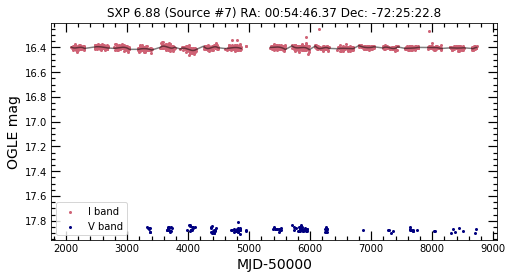

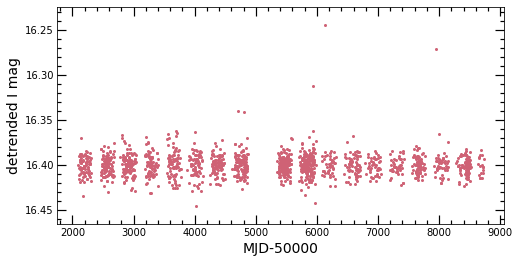

I and V-I correlation: -0.70496952129988
V and V-I correlation: 0.8147707073326637


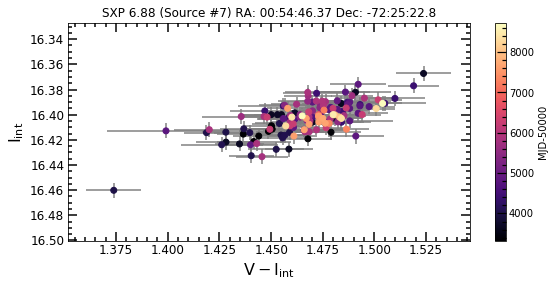

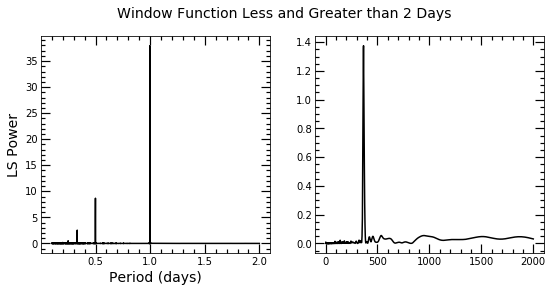

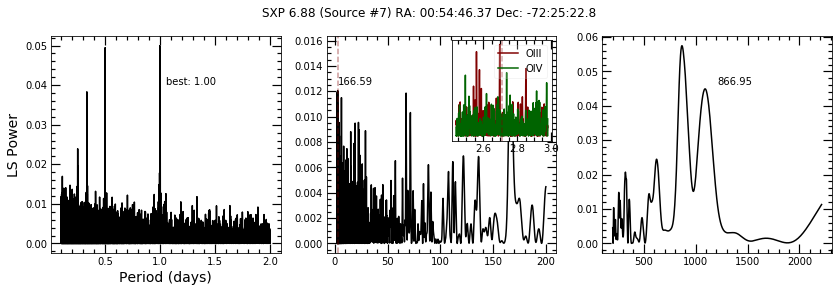

Phase-folding with Coe et al. established orbital period and highest peak within 0.27 days of that value...


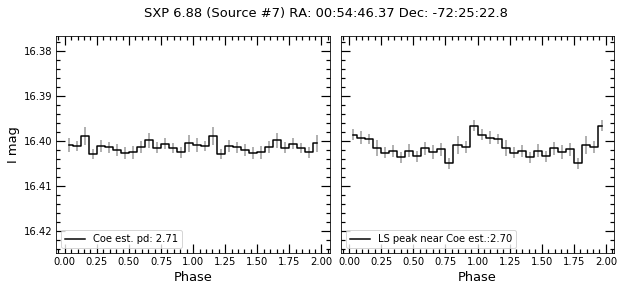

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


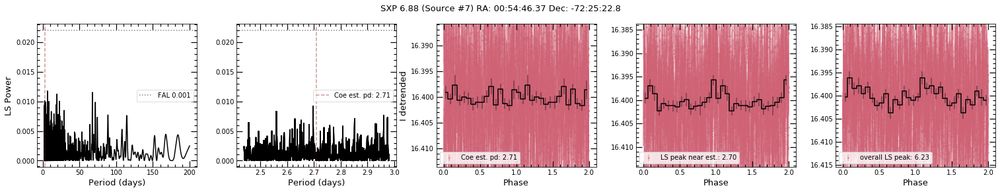

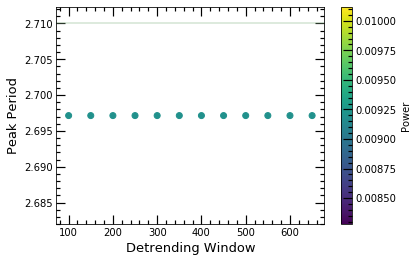

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 6.228457015806128 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 6.228457015806128 days (the detrended peak).


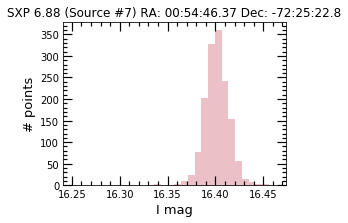



max I band:  16.463
min I band:  16.251
I range:  0.21199999999999974
I stdev:  0.013639488270696698
max V band:  17.908
min V band:  17.812
V range:  0.09600000000000009
V stdev:  0.015539261303823663


In [13]:
reload(o)
basic(1,pbins=16,saveall=save,calib=True)
#color mag just looks like a calibration problem

Original source number: 19
Current source number: 17
RA,Dec (deg): 12.29786, -72.82671
Established period: 17.79
NS spin period: 18.37
Separation: 1.0999411508632648


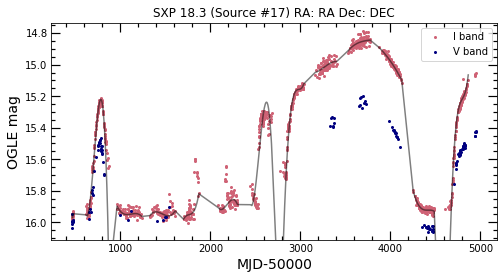

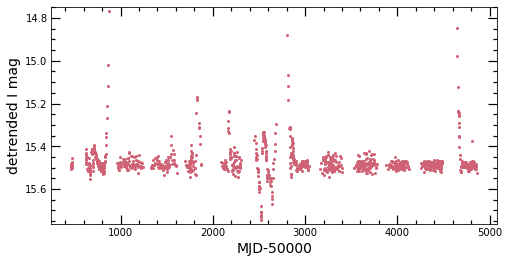

I and V-I correlation: -0.9634952657054523
V and V-I correlation: -0.9179149262819041


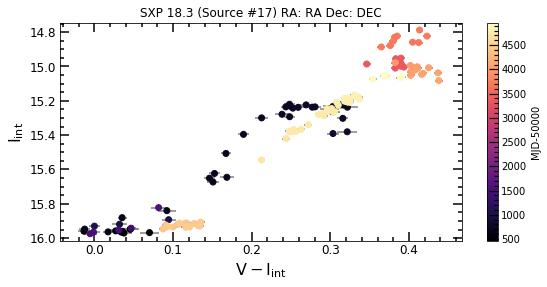

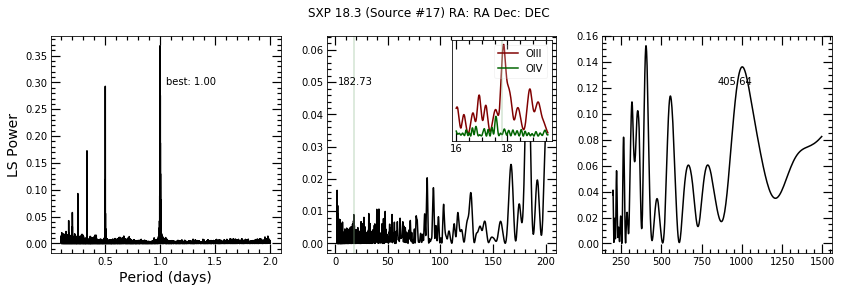

Phase-folding with established orbital period and highest peak within 1.78 days of that value...


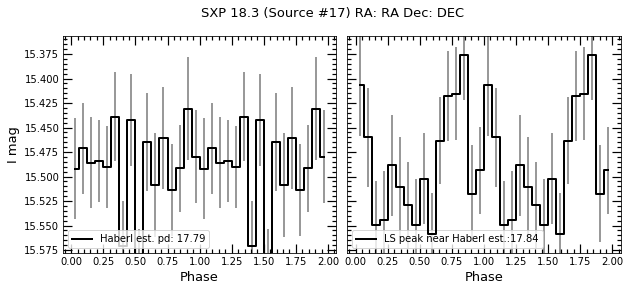

Phase-folding with Coe et al. established orbital period and highest peak within 1.78 days of that value...


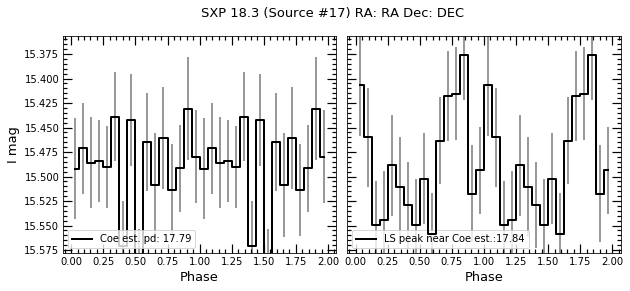

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


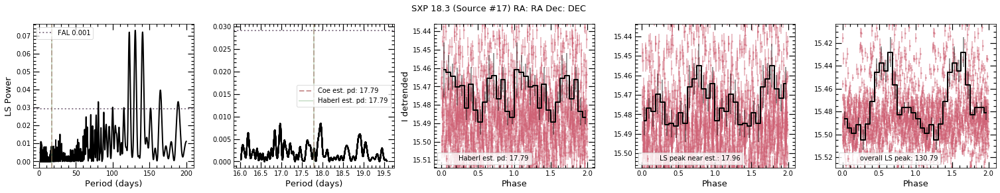

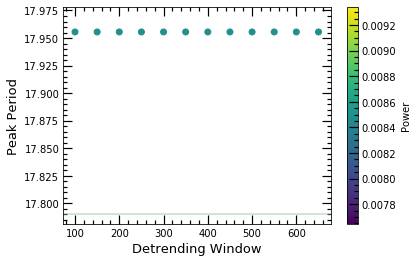

Comparing peaks of 0.1-2 day window function and detrended periodogram...
No peaks found so not searching for beat periods or aliases.


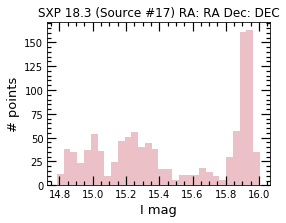



max I band:  16.005
min I band:  14.785
I range:  1.2199999999999989
I stdev:  0.39559407501244287
max V band:  16.064
min V band:  15.201
V range:  0.8629999999999995
V stdev:  0.2511608658236033


In [14]:
#has spin period?
#should really be in part 1 esp. since low period uncertainty
reload(o)
basic(2,pbins=16,saveall=save,window=200)

Original source number: 42
Current source number: 38
RA,Dec (deg): 11.847077, -73.207756
Established period: 49.06
NS spin period: 263.0
Separation: 3.543153565465679


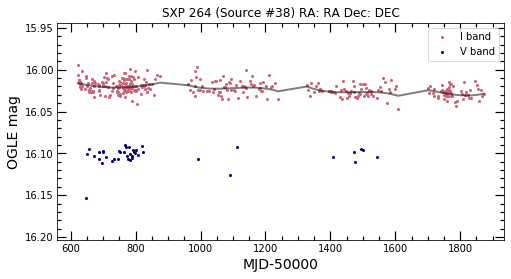

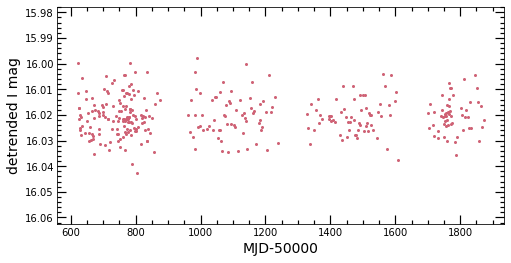

I and V-I correlation: -0.6831273553244358
V and V-I correlation: 0.8747141006391075


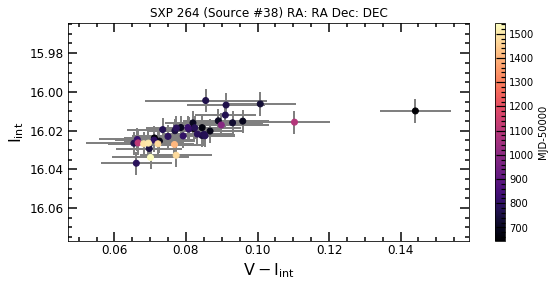

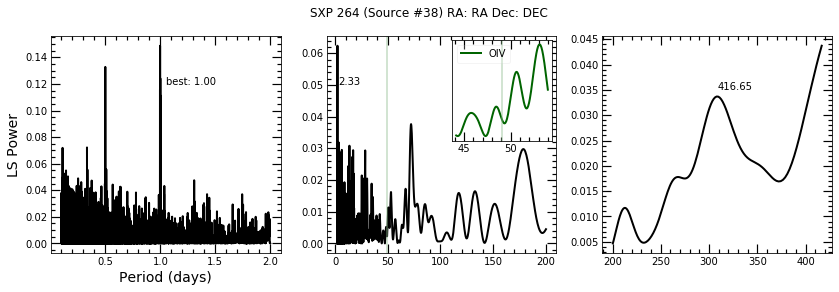

Phase-folding with established orbital period and highest peak within 4.91 days of that value...


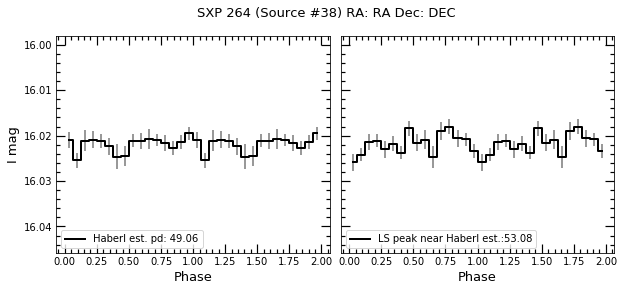

Phase-folding with Coe et al. established orbital period and highest peak within 4.92 days of that value...


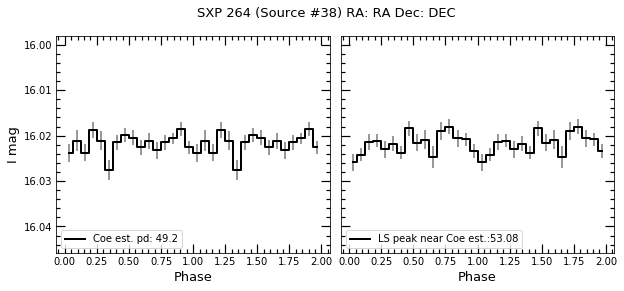

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


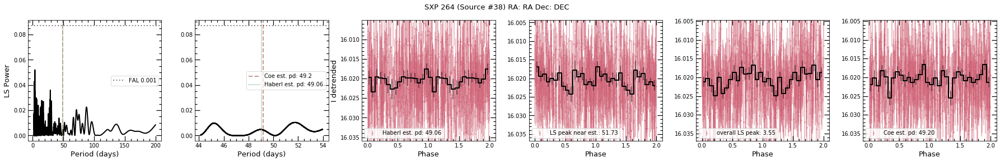

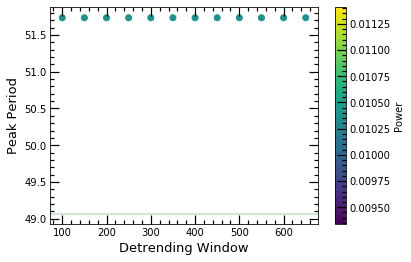

Comparing peaks of 0.1-2 day window function and detrended periodogram...
No peaks found so not searching for beat periods or aliases.


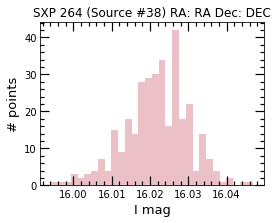



max I band:  16.047
min I band:  15.994
I range:  0.053000000000000824
I stdev:  0.008348814549892988
max V band:  16.154
min V band:  16.09
V range:  0.06400000000000006
V stdev:  0.010509280338359153


In [15]:
basic(3,pbins=16,saveall=save) #try out peak around 70 days in more detailed analysis

Original source number: 61
Current source number: 56
RA,Dec (deg): 12.373937, -73.18304
Established period: 91.5
NS spin period: 894.0
Separation: 0.2781968914149977


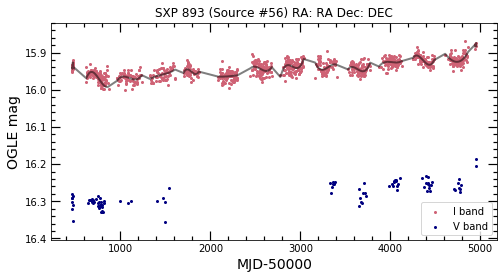

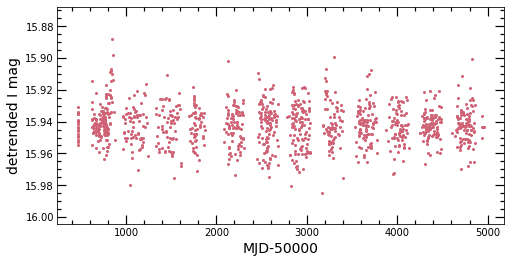

I and V-I correlation: 0.011100182905325186
V and V-I correlation: 0.617853792790458


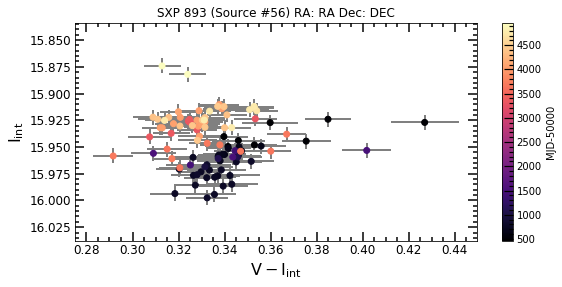

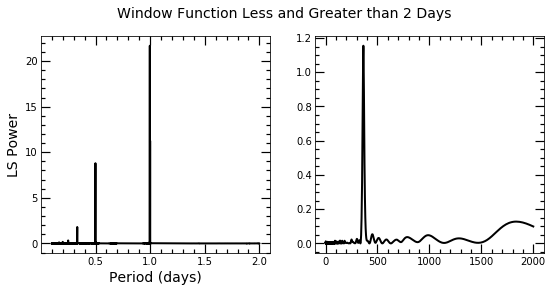

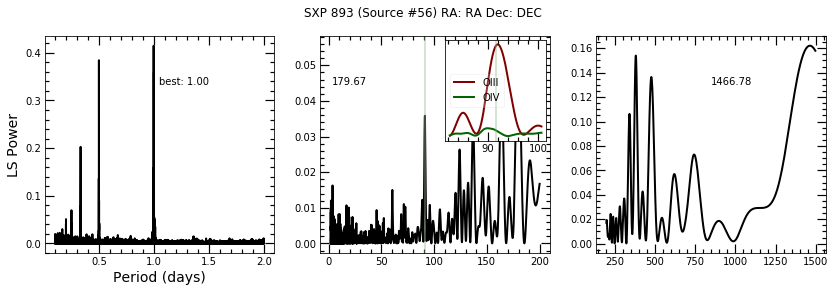

Phase-folding with established orbital period and highest peak within 9.15 days of that value...


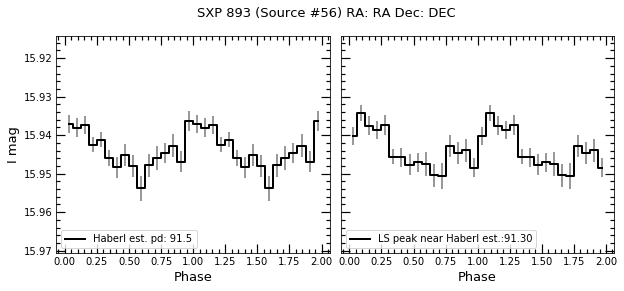

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


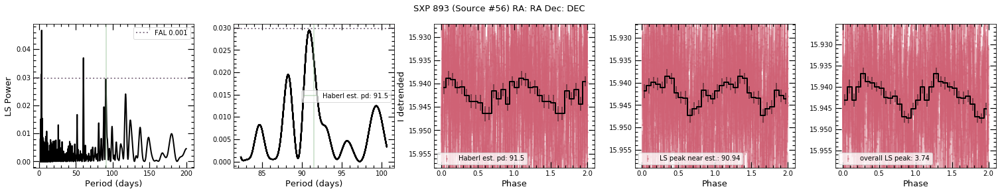

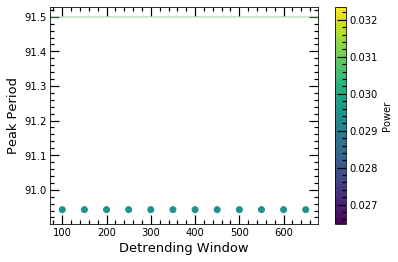

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of the established period.
There is at least one alias of the 0.1-2 day window function within a day of the established period.


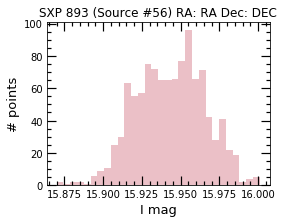



max I band:  16.001
min I band:  15.87
I range:  0.131000000000002
I stdev:  0.02200551260199458
max V band:  16.355
min V band:  16.187
V range:  0.16799999999999926
V stdev:  0.030626815644909648


In [16]:
basic(4,pbins=16,saveall=save)

Original source number: 67
Current source number: 61
RA,Dec (deg): 10.532371, -73.75095
Established period: nan
NS spin period: nan
Separation: 1.4710400317317927


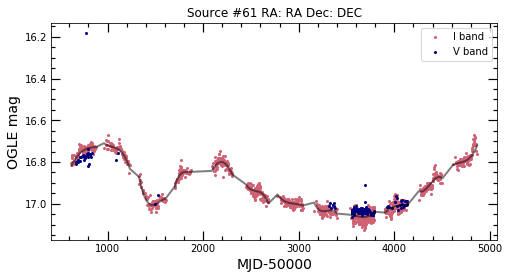

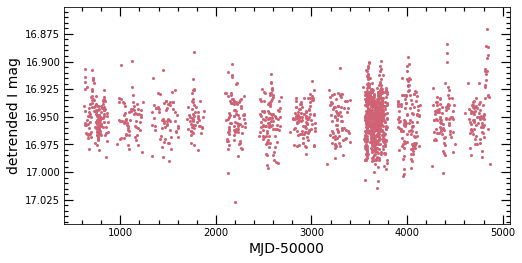

I and V-I correlation: -0.32756498369748815
V and V-I correlation: 0.10889980040748493


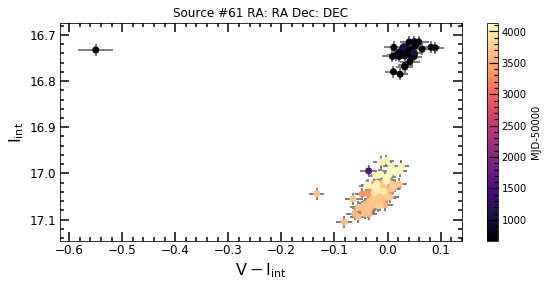

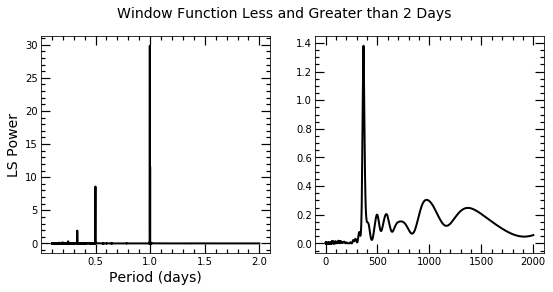

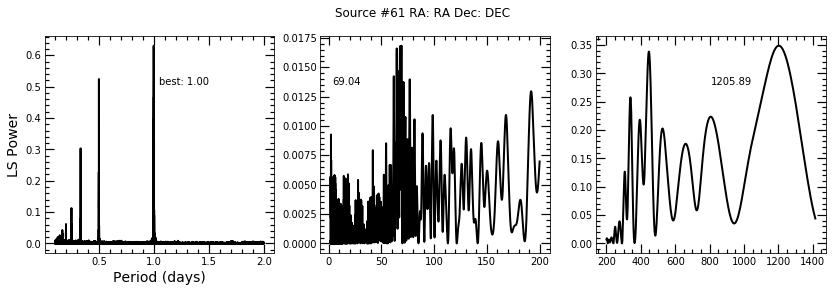

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


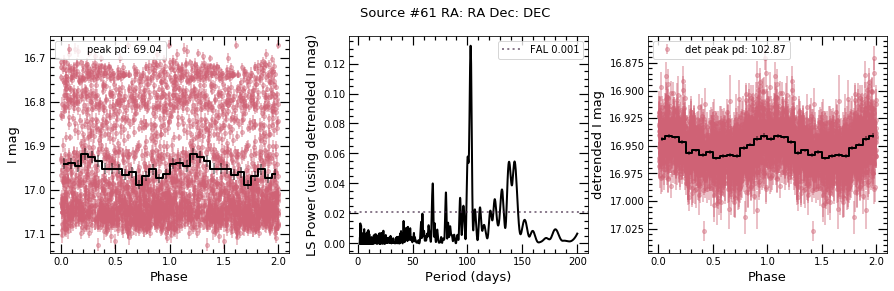

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 102.72832212004025.
There is at least one alias of the 0.1-2 day detrended search within a day of 102.86855558721388 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 102.86855558721388 days (the detrended peak).


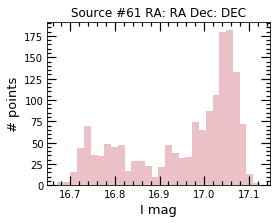



max I band:  17.125
min I band:  16.67
I range:  0.4549999999999983
I stdev:  0.11966109571992009
max V band:  17.063
min V band:  16.183
V range:  0.879999999999999
V stdev:  0.12036219692191123


In [17]:
basic(5,pbins=16,saveall=save,medlim=False)

Original source number: 68
Current source number: 62
RA,Dec (deg): 10.816116, -73.410904
Established period: nan
NS spin period: nan
Separation: 2.8205668840631937


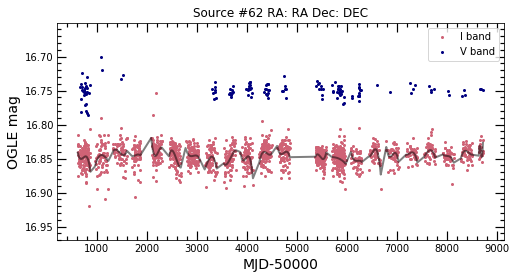

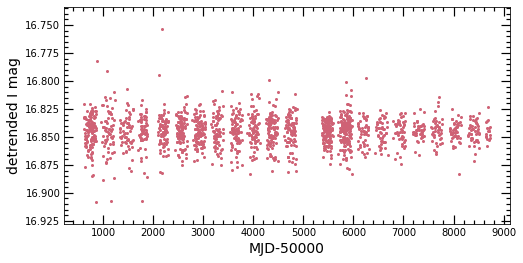

I and V-I correlation: -0.6901662108771951
V and V-I correlation: 0.5755156323439106


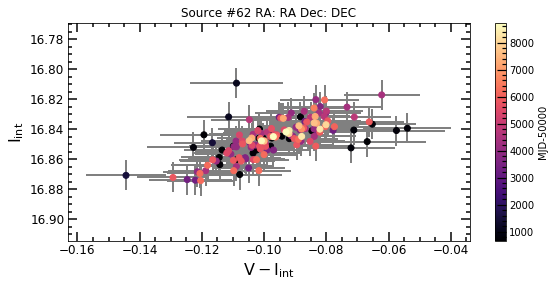

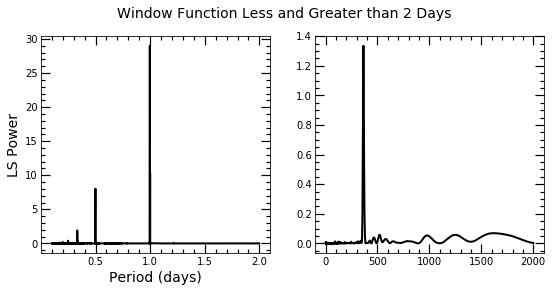

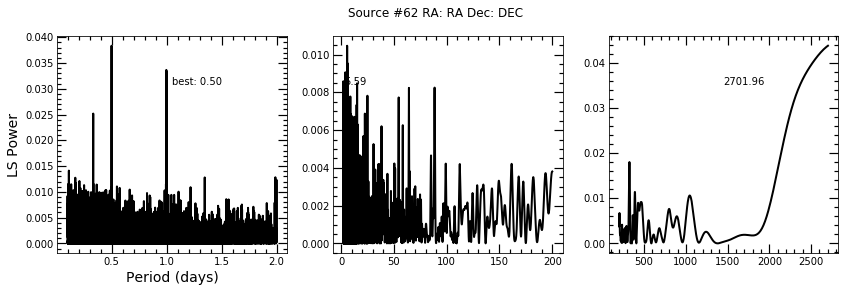

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


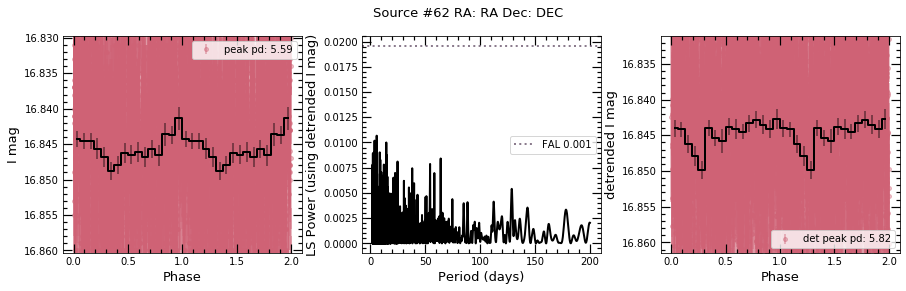

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 5.815634330205635 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 5.815634330205635 days (the detrended peak).


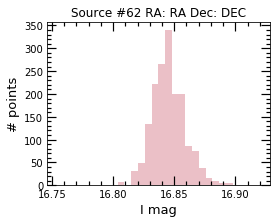



max I band:  16.92
min I band:  16.753999999999998
I range:  0.16600000000000392
I stdev:  0.013991425996260578
max V band:  16.785499999999995
min V band:  16.700499999999995
V range:  0.08500000000000085
V stdev:  0.010880331664176214


In [18]:
basic(6,pbins=16,saveall=save,calib=True) #calibration off? so epochs shifted to common median

so far, many with less (super-orbital) variability than part 1 sources

Original source number: 69
Current source number: 63
RA,Dec (deg): 11.250834, -73.71298
Established period: nan
NS spin period: nan
Separation: 1.64945348111386


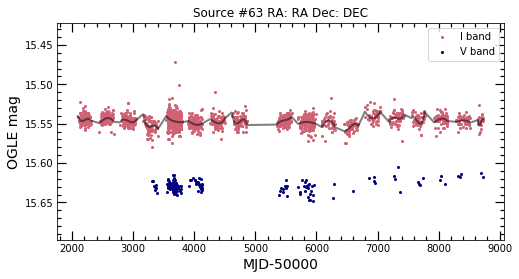

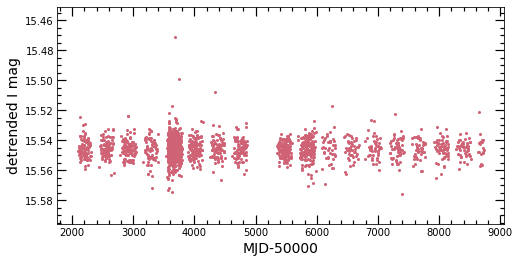

I and V-I correlation: -0.6210708660660861
V and V-I correlation: 0.6442676017233209


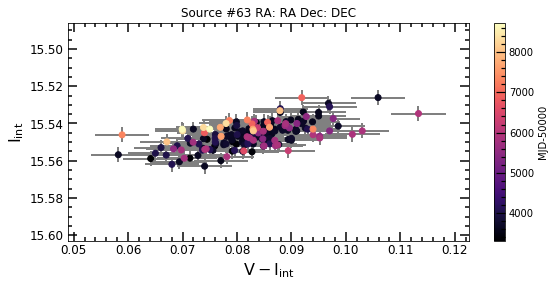

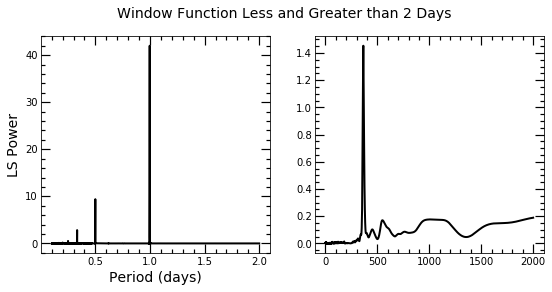

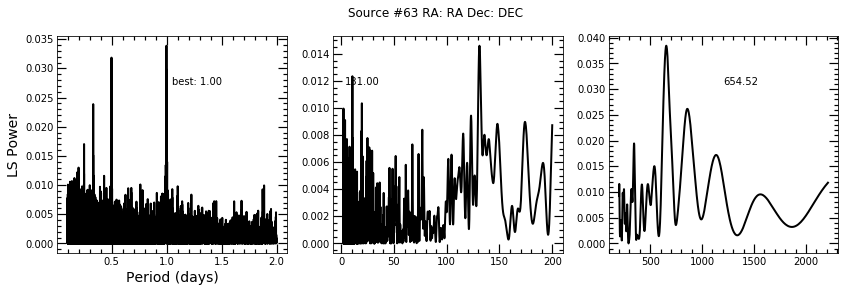

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


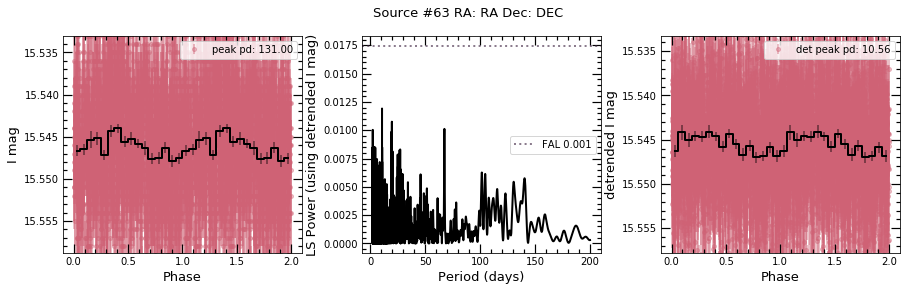

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 10.564077431098323 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 10.564077431098323 days (the detrended peak).


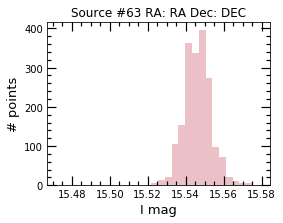



max I band:  15.579
min I band:  15.472
I range:  0.1070000000000011
I stdev:  0.007666268281906547
max V band:  15.648
min V band:  15.605
V range:  0.04299999999999926
V stdev:  0.006904261258774298


In [19]:
basic(7,pbins=16,saveall=save,calib=True) #check calibration

Original source number: 71
Current source number: 64
RA,Dec (deg): 12.078058, -73.34998
Established period: nan
NS spin period: nan
Separation: 0.0431108040365839


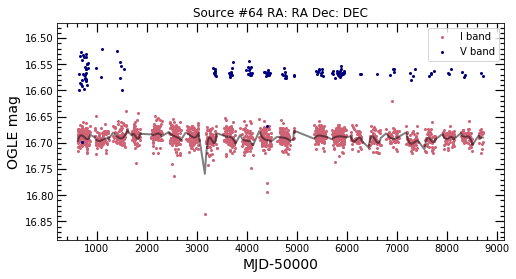

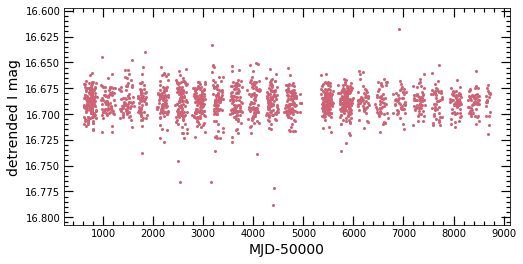

I and V-I correlation: -0.46661314657089864
V and V-I correlation: 0.7370456084684404


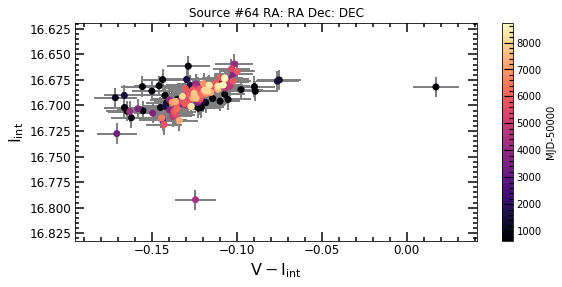

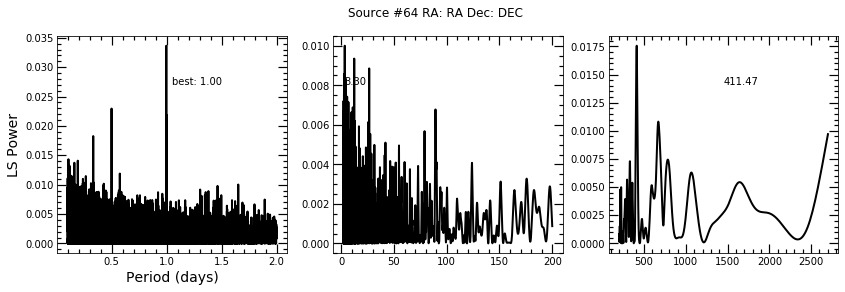

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


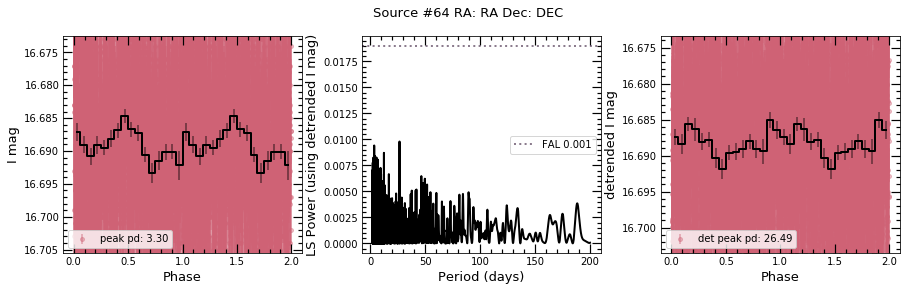

Comparing peaks of 0.1-2 day window function and detrended periodogram...
No peaks found so not searching for beat periods or aliases.


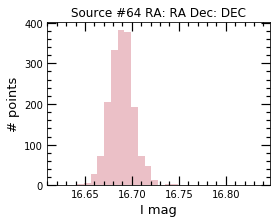



max I band:  16.836
min I band:  16.62
I range:  0.21599999999999753
I stdev:  0.014017944399415113
max V band:  16.698999999999998
min V band:  16.521
V range:  0.17799999999999727
V stdev:  0.018511397089961


In [20]:
basic(8,pbins=16,saveall=save,calib=True) #calibration

Original source number: 72
Current source number: 65
RA,Dec (deg): 12.142035, -73.04181
Established period: 414.91345
NS spin period: nan
Separation: 0.5884228331103324


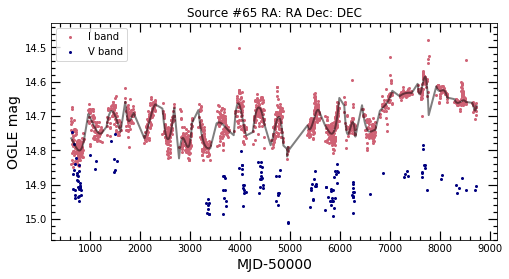

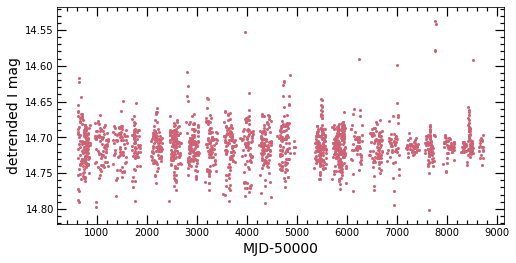

I and V-I correlation: -0.6254613949678095
V and V-I correlation: 0.2752110302977543


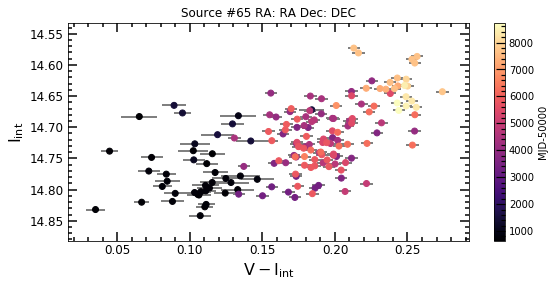

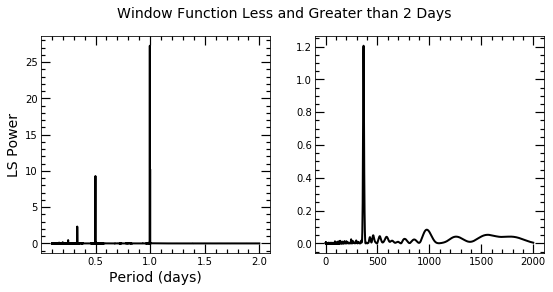

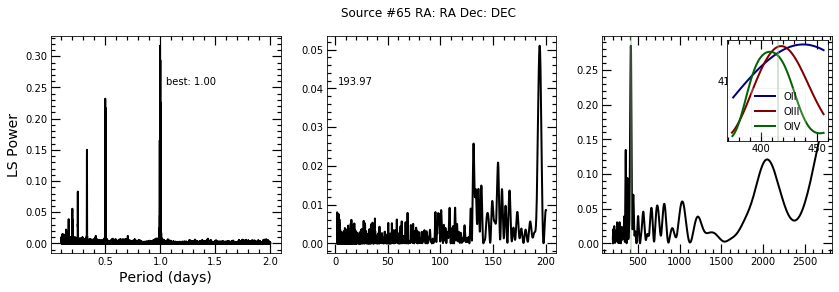

Phase-folding with established orbital period and highest peak within 41.49 days of that value...


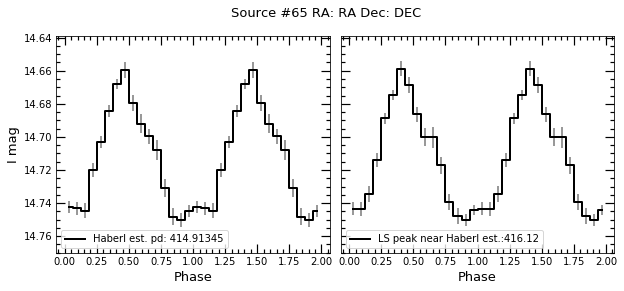

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


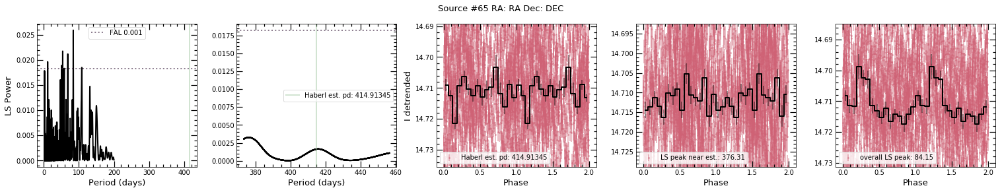

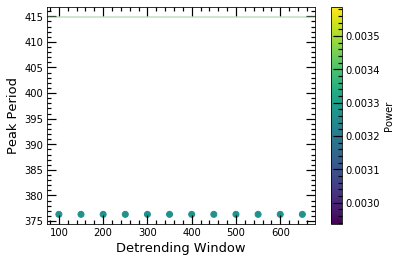

Comparing peaks of 0.1-2 day window function and detrended periodogram...


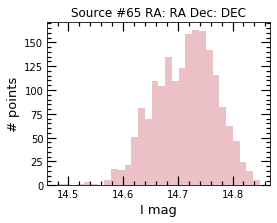



max I band:  14.85
min I band:  14.479
I range:  0.37100000000000044
I stdev:  0.05577543547212916
max V band:  15.012
min V band:  14.748
V range:  0.2640000000000011
V stdev:  0.048269219727602


In [21]:
basic(9,pbins=16,saveall=save,window=2000) #look for decreasing period

In [22]:
phase[phase['src_n']==72]

,src_n,period,amp,phase diff,phase max,phase min,shape,diff mean,mean,skew,kurtosis,symm sum,mean err,aperiodic quiescence
65,72,376.313009,0.058299,0.5625,0.90625,0.34375,FRED,0.027241,14.714697,0.048478,-1.30869,0.018916,0.005512,NO


Original source number: 73
Current source number: 66
RA,Dec (deg): 12.204167, -73.27361
Established period: nan
NS spin period: nan
Separation: 1.7438400173472062


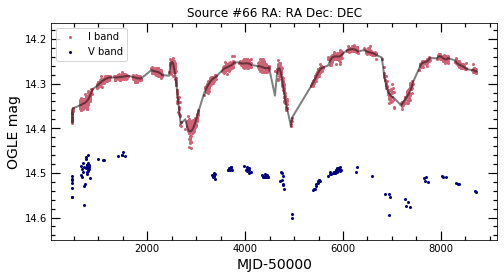

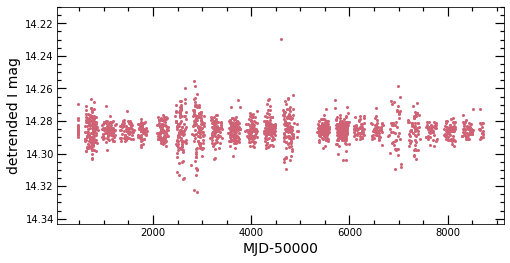

I and V-I correlation: -0.8124872651805103
V and V-I correlation: 0.3205025098677481


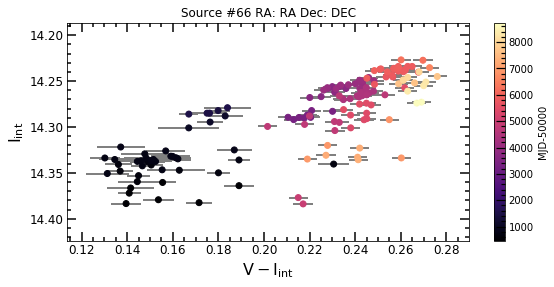

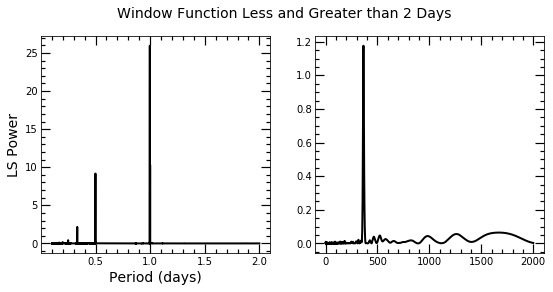

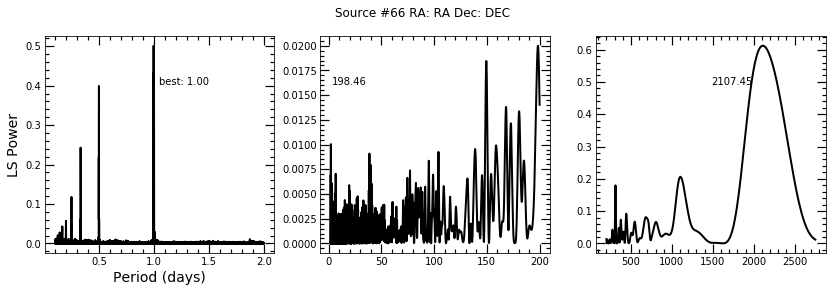

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


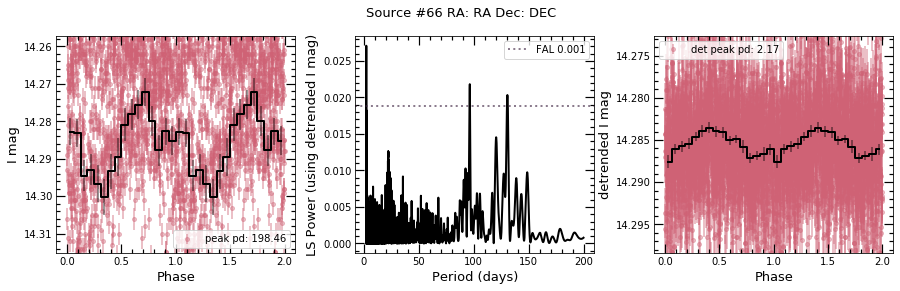

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 2.1673717658108624.
There is at least one alias of the 0.1-2 day detrended search within a day of 2.167391106047142 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 2.167391106047142 days (the detrended peak).


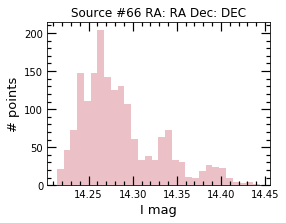



max I band:  14.444
min I band:  14.214
I range:  0.23000000000000043
I stdev:  0.044759233557362776
max V band:  14.601
min V band:  14.453
V range:  0.14800000000000146
V stdev:  0.02588635203063326


In [23]:
basic(10,pbins=16,saveall=save)

Original source number: 75
Current source number: 67
RA,Dec (deg): 12.306787, -73.1938
Established period: 80.1
NS spin period: nan
Separation: 0.707051444753511


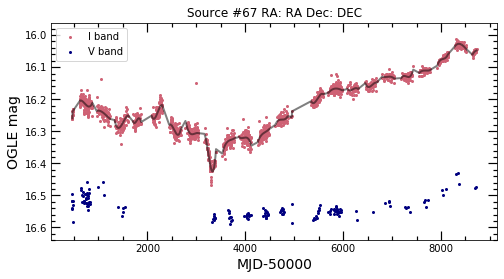

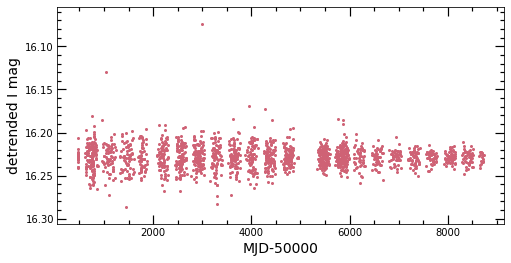

I and V-I correlation: -0.932428467980274
V and V-I correlation: -0.2515816687525331


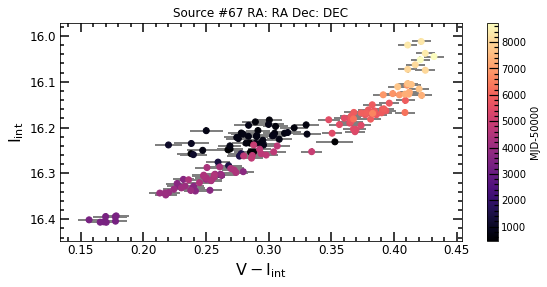

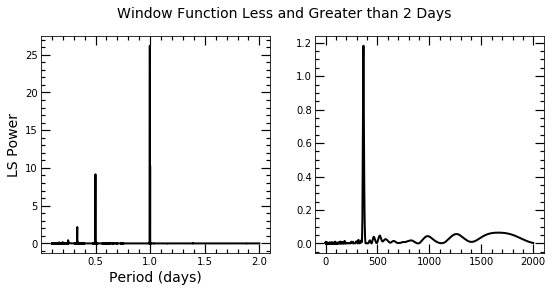

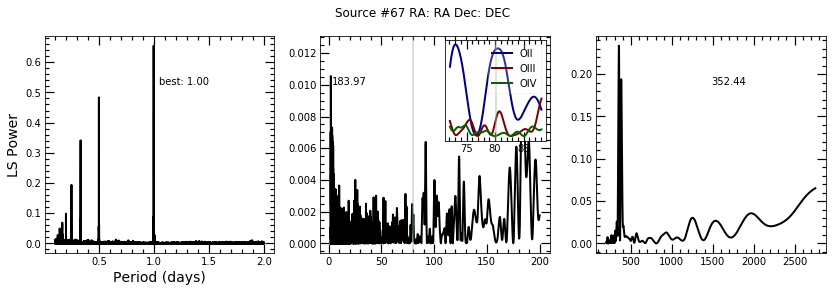

Phase-folding with established orbital period and highest peak within 8.01 days of that value...


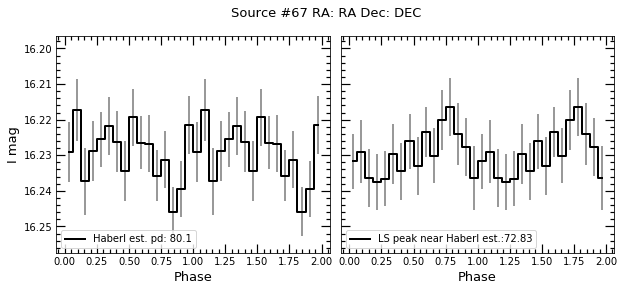

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


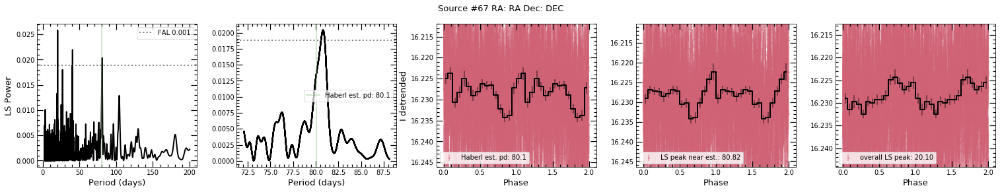

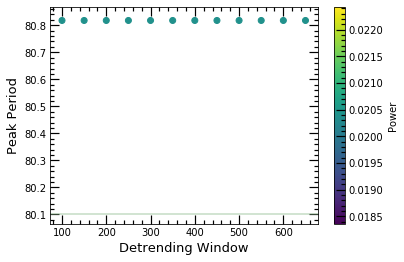

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of the established period.
There is at least one alias of the 0.1-2 day window function within a day of the established period.


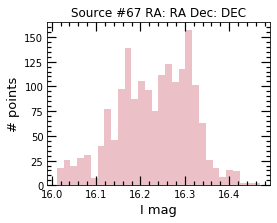



max I band:  16.469
min I band:  16.012
I range:  0.45700000000000074
I stdev:  0.08472090375763396
max V band:  16.59
min V band:  16.431
V range:  0.15899999999999892
V stdev:  0.031157660911993436


In [24]:
basic(11,pbins=16,saveall=save)

Original source number: 76
Current source number: 68
RA,Dec (deg): 12.3425, -73.335
Established period: nan
NS spin period: nan
Separation: 1.5777340571430303


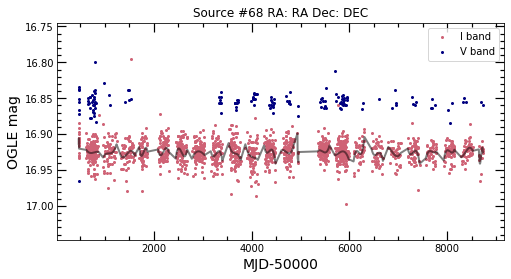

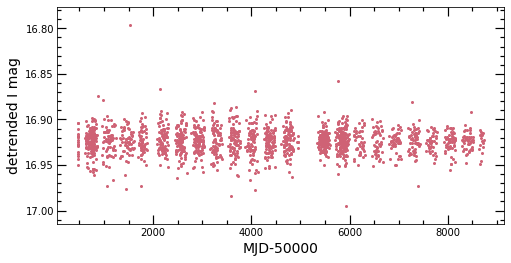

I and V-I correlation: -0.6845528361331351
V and V-I correlation: 0.7611162503089715


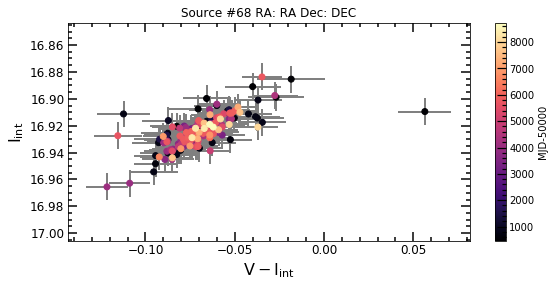

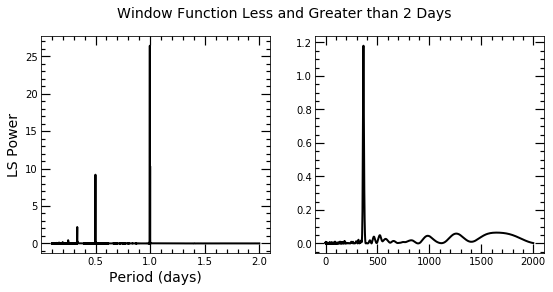

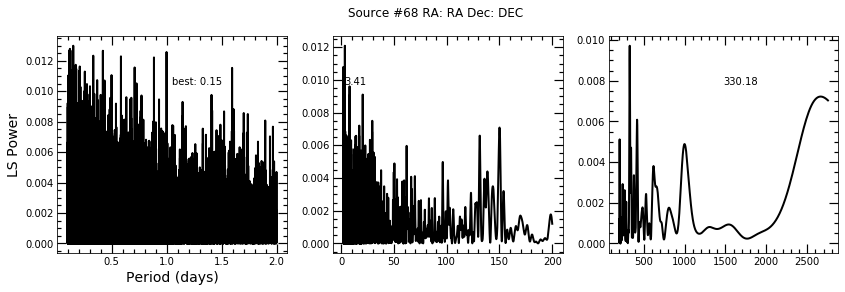

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


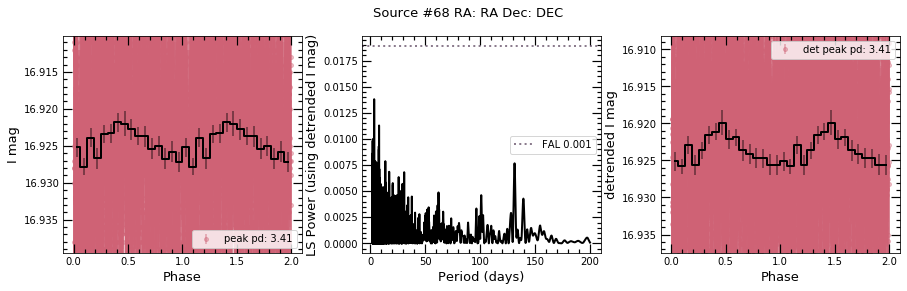

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 3.4144714624986787 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 3.4144714624986787 days (the detrended peak).


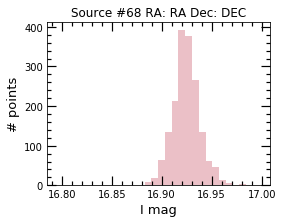



max I band:  16.998
min I band:  16.794999999999998
I range:  0.20300000000000296
I stdev:  0.014268657046933137
max V band:  16.966
min V band:  16.799
V range:  0.1670000000000016
V stdev:  0.013969897521758166


In [25]:
basic(12,pbins=16,saveall=save,calib=True)

Original source number: 77
Current source number: 69
RA,Dec (deg): 12.377575, -73.519264
Established period: nan
NS spin period: nan
Separation: 1.2890474967685142


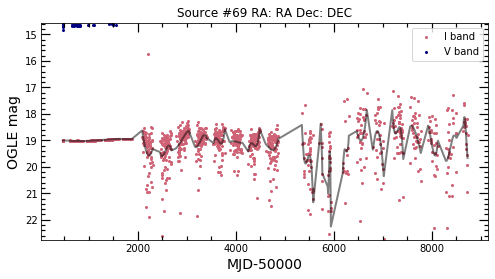

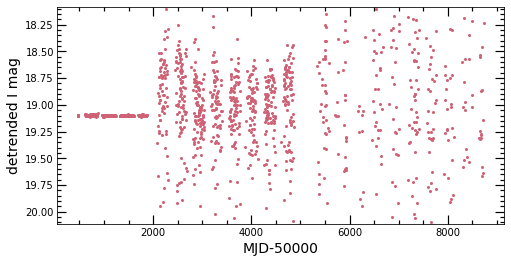

I and V-I correlation: -0.3172205594085145
V and V-I correlation: 0.8271378581283979


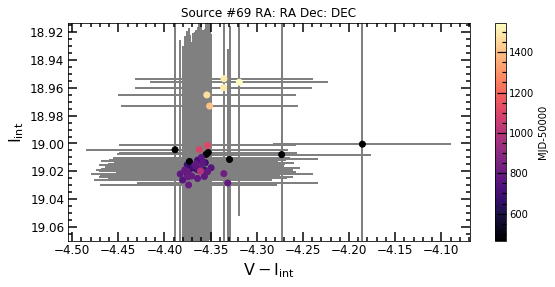

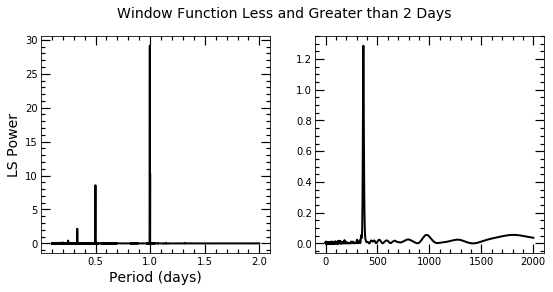

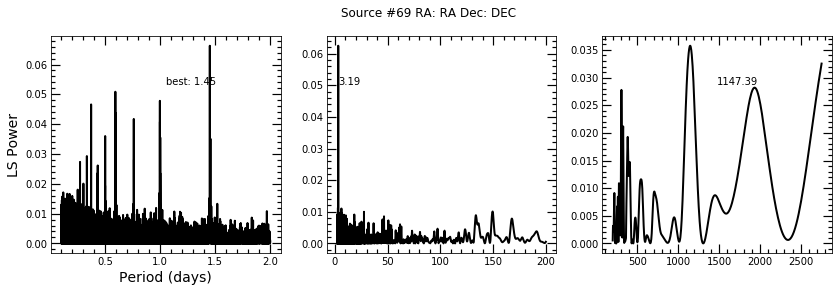

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


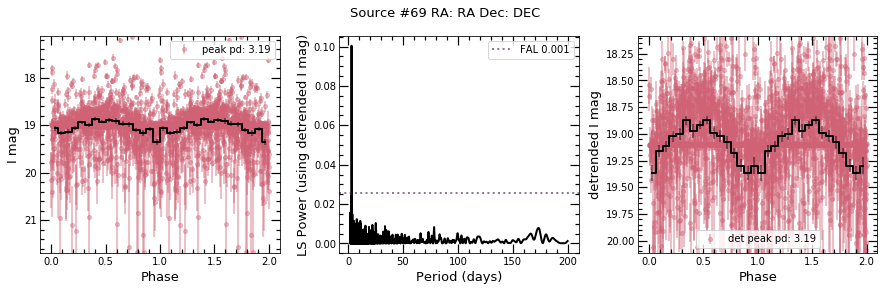

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 3.1882201292085406.
There is at least one alias of the 0.1-2 day detrended search within a day of 3.1881636017351114 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 3.1881636017351114 days (the detrended peak).


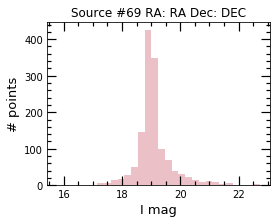



max I band:  22.725
min I band:  15.755999999999998
I range:  6.969000000000003
I stdev:  0.6460892537477114
max V band:  14.815
min V band:  14.611
V range:  0.20399999999999885
V stdev:  0.03163050566919346


In [26]:
reload(o)
basic(13,pbins=16,saveall=save,medlim=False,calib=True) #what's going on with points in the beginning?

Original source number: 78
Current source number: 70
RA,Dec (deg): 12.423583, -72.81192
Established period: nan
NS spin period: nan
Separation: 1.4188226668631583
empty file for OII I


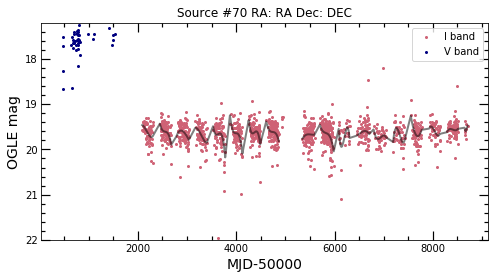

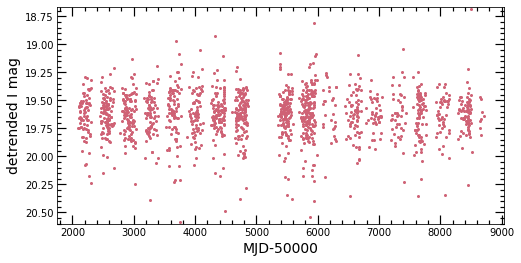

I and V-I correlation: nan
V and V-I correlation: 1.0


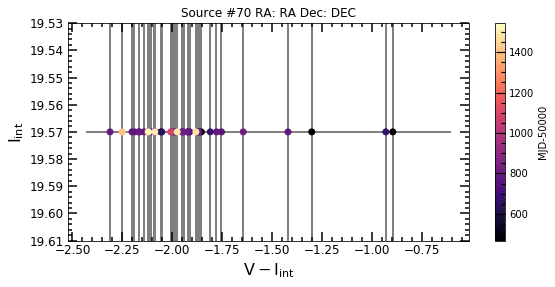

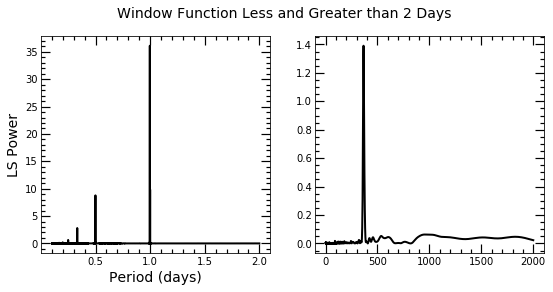

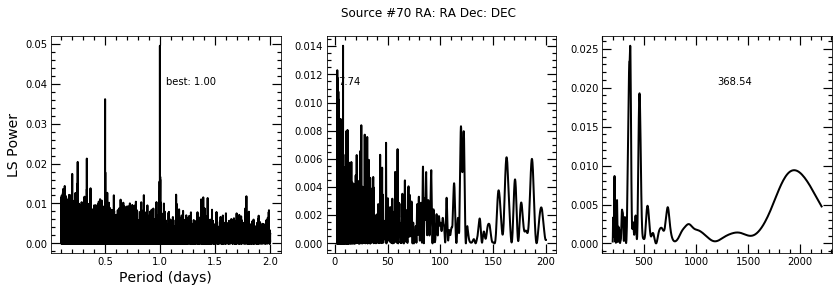

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


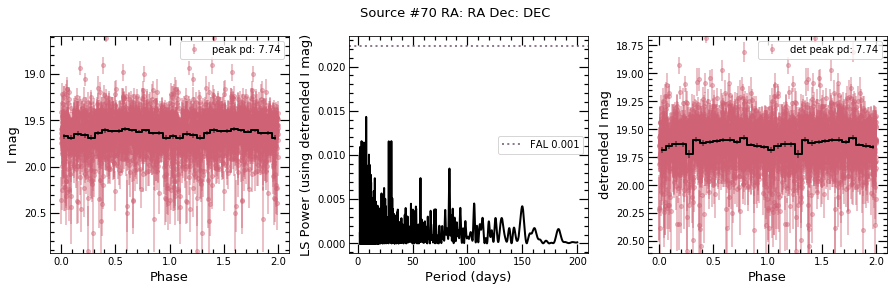

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 7.741275799315349 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 7.741275799315349 days (the detrended peak).


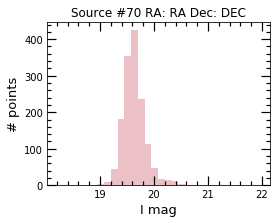



max I band:  21.956
min I band:  18.199
I range:  3.756999999999998
I stdev:  0.23370842789645066
max V band:  18.674
min V band:  17.258
V range:  1.4160000000000004
V stdev:  0.29850037508000304


In [27]:
basic(14,pbins=16,saveall=save,medlim=False,calib=True) 

Original source number: 79
Current source number: 71
RA,Dec (deg): 12.518333, -73.240555
Established period: nan
NS spin period: nan
Separation: 0.8130891502035685


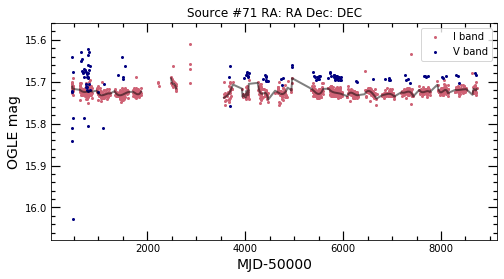

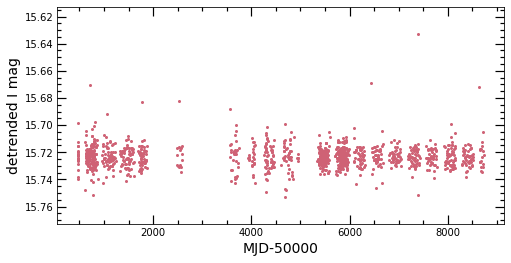

I and V-I correlation: -0.20924902495568612
V and V-I correlation: 0.980507911486608


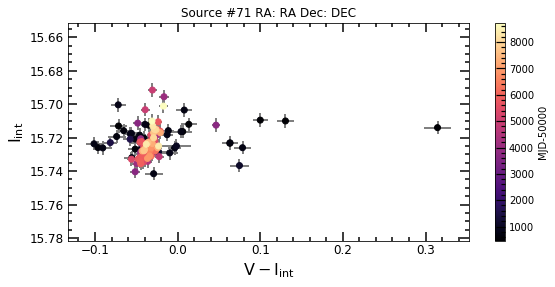

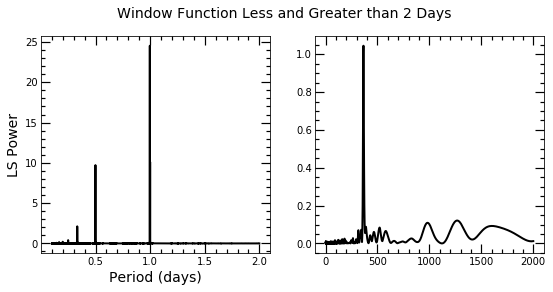

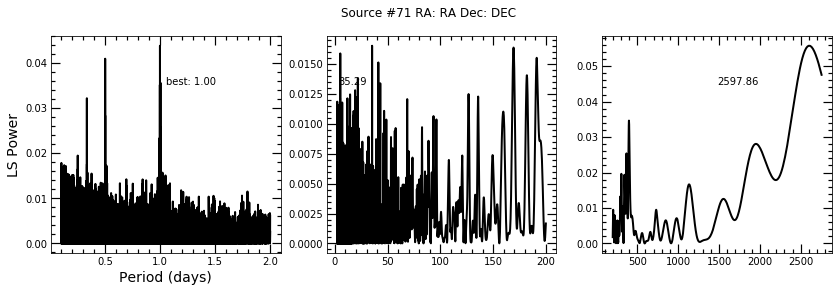

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


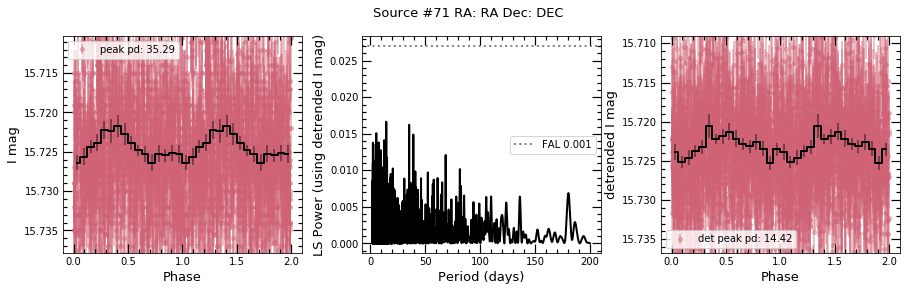

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 14.418806912324204 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 14.418806912324204 days (the detrended peak).


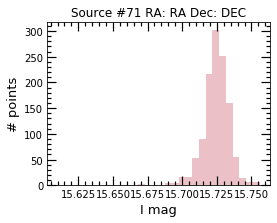



max I band:  15.755999999999998
min I band:  15.6095
I range:  0.14649999999999785
I stdev:  0.010548850250252473
max V band:  16.0285
min V band:  15.622499999999999
V range:  0.40600000000000236
V stdev:  0.04383192151845509


In [28]:
basic(15,pbins=16,saveall=save,calib=True) #check calibration

Original source number: 80
Current source number: 72
RA,Dec (deg): 12.550833, -73.19889
Established period: nan
NS spin period: nan
Separation: nan


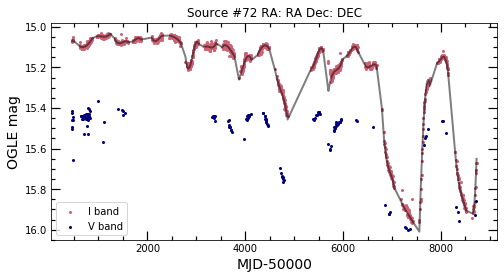

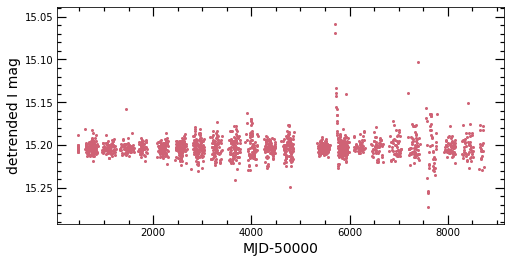

I and V-I correlation: -0.7418541628472648
V and V-I correlation: -0.4623167530237583


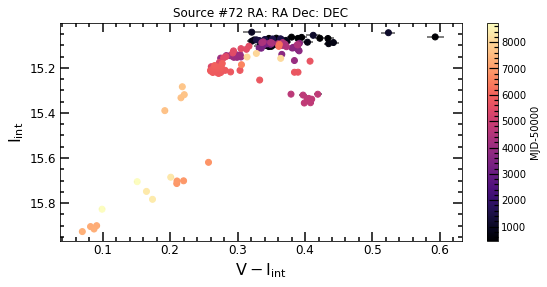

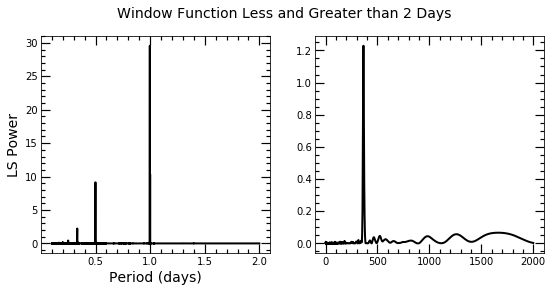

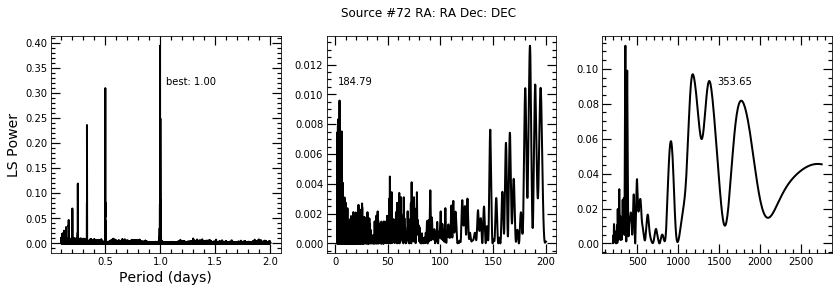

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


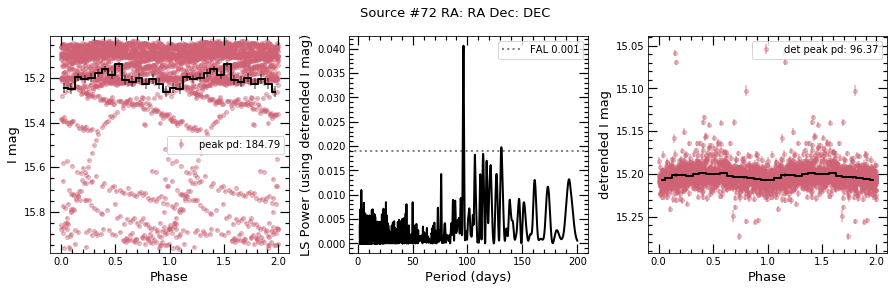

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 96.37421336910879.
There is at least one alias of the 0.1-2 day detrended search within a day of 96.36748175425079 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 96.36748175425079 days (the detrended peak).


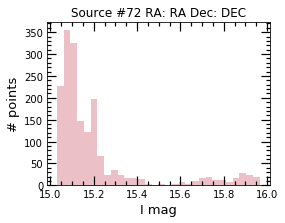



max I band:  15.966
min I band:  15.03
I range:  0.9359999999999999
I stdev:  0.22031571872294575
max V band:  16.002
min V band:  15.363
V range:  0.6389999999999993
V stdev:  0.14682643541246457


In [29]:
basic(16,pbins=16,saveall=save,medlim=False) #changing amplitude

Original source number: 81
Current source number: 73
RA,Dec (deg): 12.647917, -73.23361
Established period: nan
NS spin period: nan
Separation: 1.4965820370445162


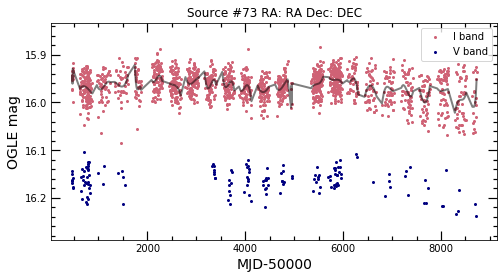

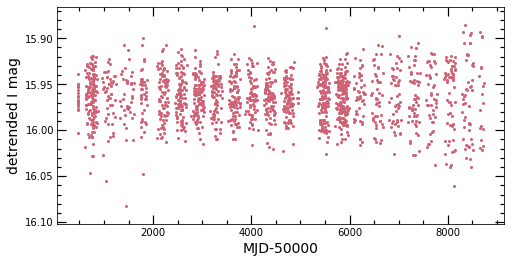

I and V-I correlation: -0.4698083262743087
V and V-I correlation: 0.5052579605195575


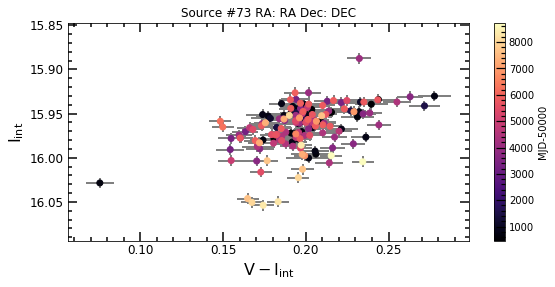

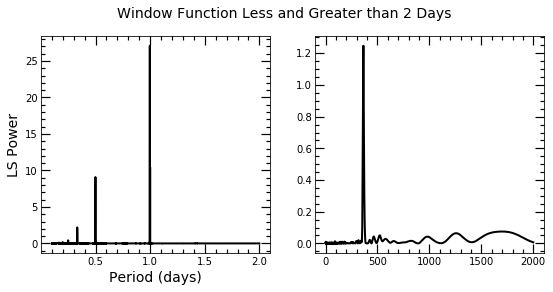

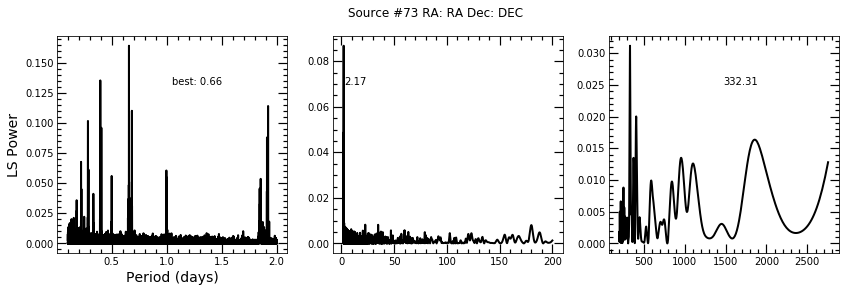

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


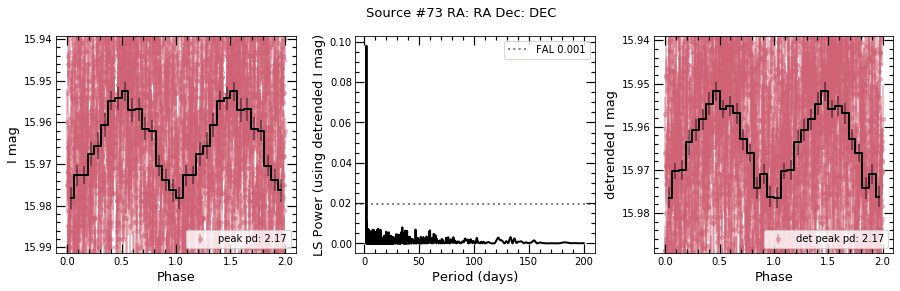

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 1.9221474603876312.
There is at least one alias of the 0.1-2 day detrended search within a day of 2.169816190250918 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 2.169816190250918 days (the detrended peak).


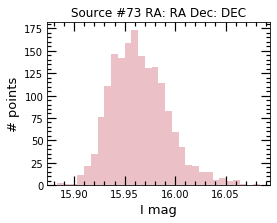



max I band:  16.083999999999996
min I band:  15.883000000000001
I range:  0.20099999999999518
I stdev:  0.02839552248111637
max V band:  16.239
min V band:  16.104000000000003
V range:  0.134999999999998
V stdev:  0.026046347867846344


In [30]:
basic(17,pbins=16,saveall=save,calib=True) 

Original source number: 82
Current source number: 74
RA,Dec (deg): 12.65, -73.29417
Established period: nan
NS spin period: nan
Separation: 0.5274558714263263


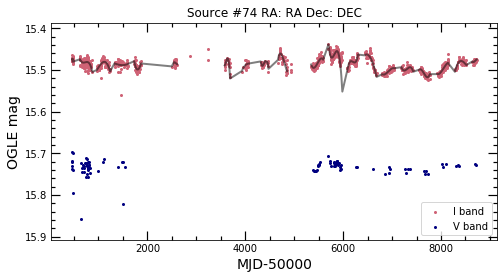

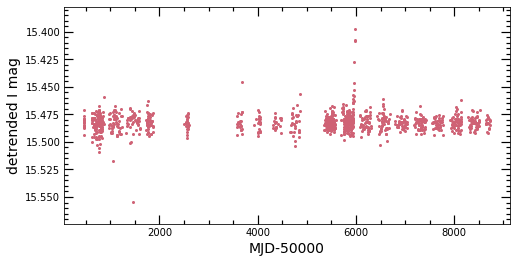

I and V-I correlation: -0.4442059486171381
V and V-I correlation: 0.711570485268687


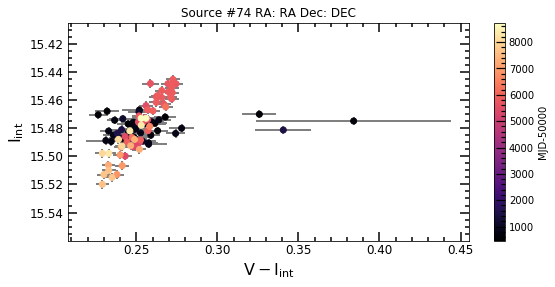

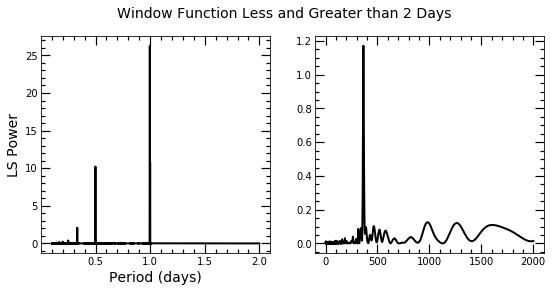

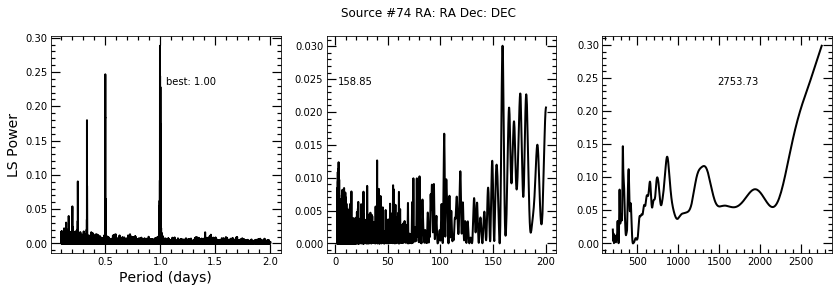

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


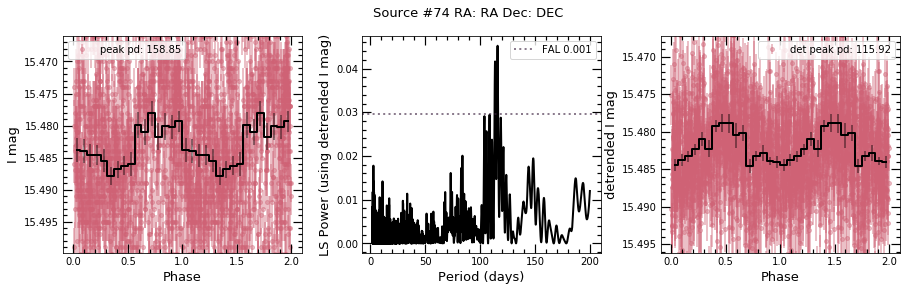

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 115.92062103156547 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 115.92062103156547 days (the detrended peak).


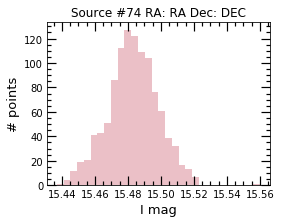



max I band:  15.56
min I band:  15.437
I range:  0.12300000000000111
I stdev:  0.015207061450756806
max V band:  15.859
min V band:  15.697
V range:  0.1620000000000008
V stdev:  0.01980612490169848


In [31]:
basic(18,pbins=16,saveall=save,calib=True)

Original source number: 84
Current source number: 75
RA,Dec (deg): 12.699167, -73.293335
Established period: nan
NS spin period: nan
Separation: 0.5527096967798616


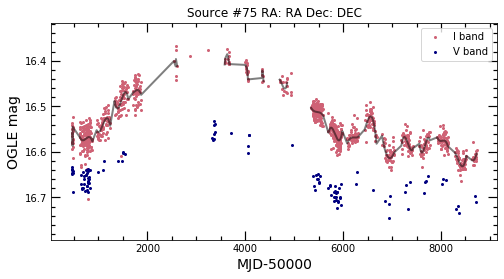

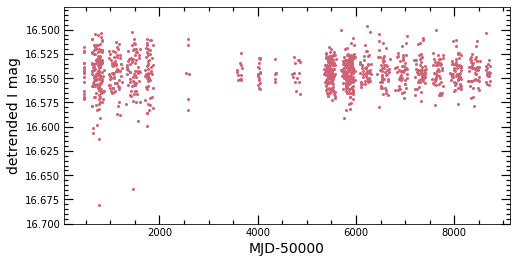

I and V-I correlation: -0.6677604520225899
V and V-I correlation: -0.17855315315375467


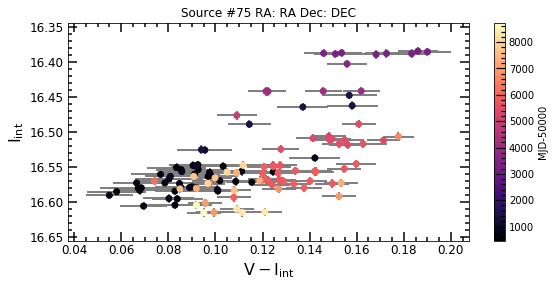

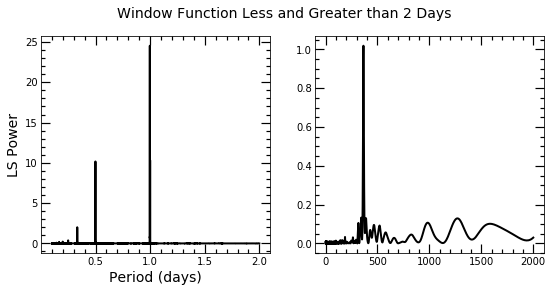

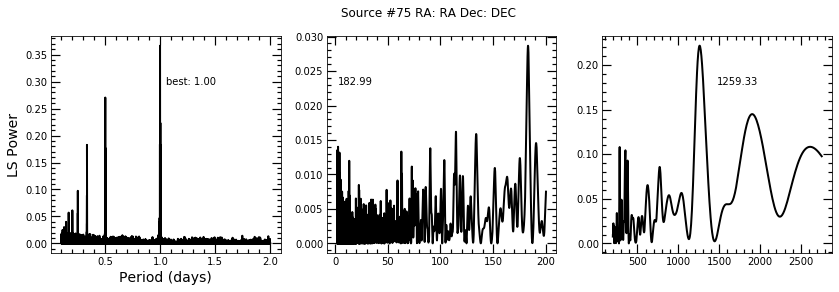

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


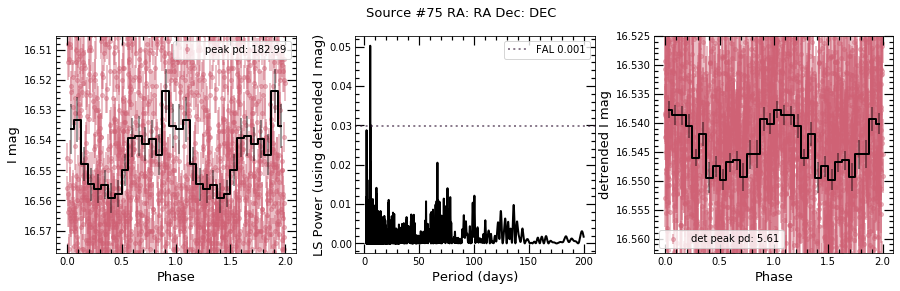

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 5.613576660558964 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 5.613576660558964 days (the detrended peak).


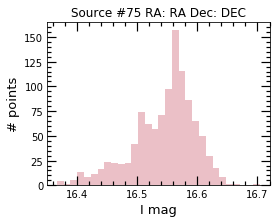



max I band:  16.704
min I band:  16.367
I range:  0.33699999999999974
I stdev:  0.051525214878432084
max V band:  16.744
min V band:  16.533
V range:  0.21099999999999852
V stdev:  0.044261874737648844


In [32]:
basic(19,pbins=16,saveall=save)

Original source number: 85
Current source number: 76
RA,Dec (deg): 12.738696, -73.168884
Established period: nan
NS spin period: nan
Separation: 0.5087102650552437


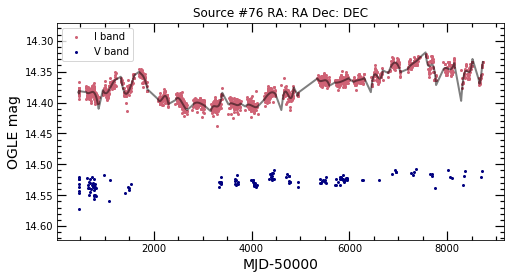

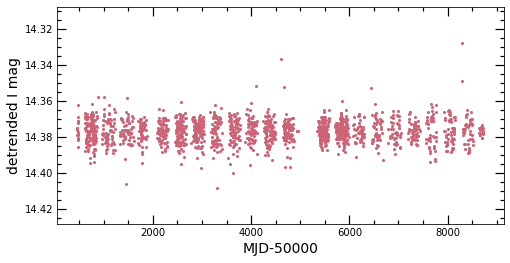

I and V-I correlation: -0.8564583967944337
V and V-I correlation: 0.06680177775356583


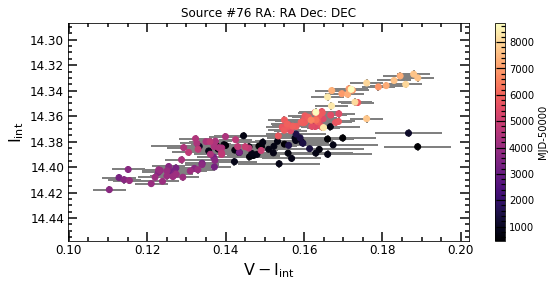

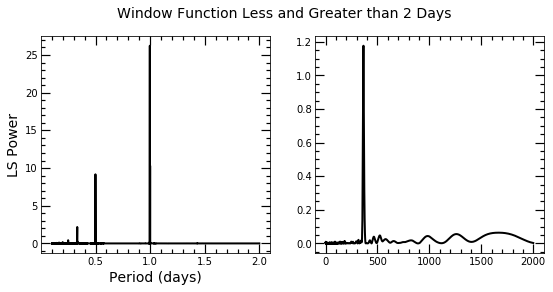

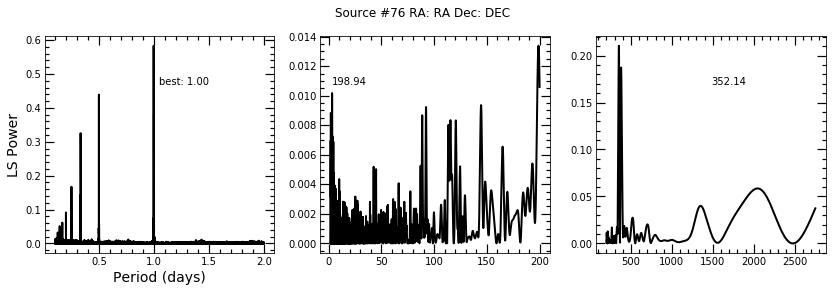

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


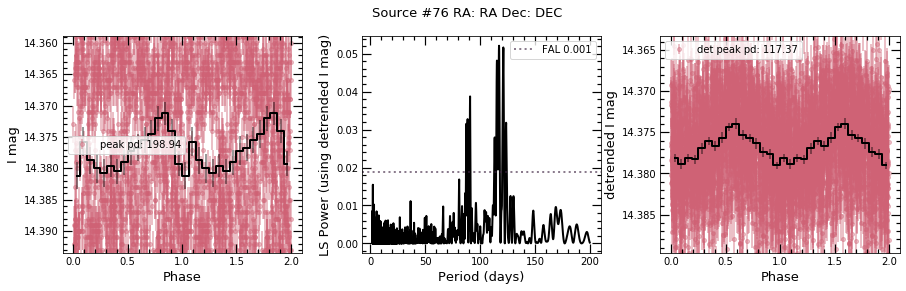

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 117.31322877023432.
There is at least one alias of the 0.1-2 day detrended search within a day of 117.36991725690471 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 117.36991725690471 days (the detrended peak).


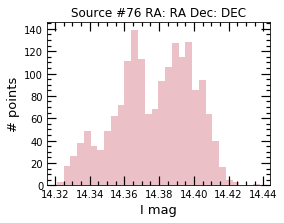



max I band:  14.438
min I band:  14.321
I range:  0.11700000000000088
I stdev:  0.02206041843459092
max V band:  14.573
min V band:  14.507
V range:  0.06600000000000072
V stdev:  0.010348805397386113


In [33]:
basic(20,pbins=16,saveall=save) 

Original source number: 86
Current source number: 77
RA,Dec (deg): 12.77375, -73.22
Established period: nan
NS spin period: nan
Separation: 0.3034814732763056


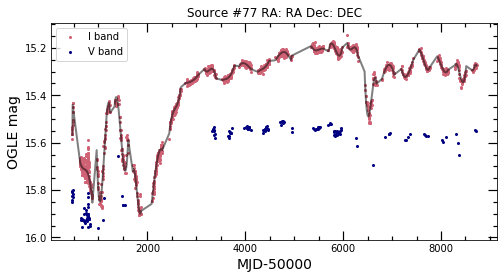

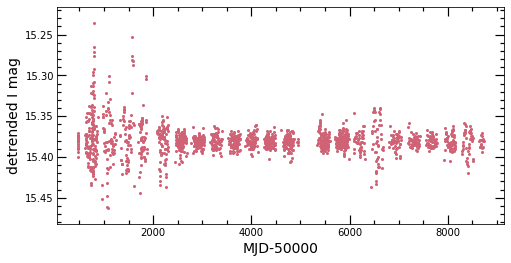

I and V-I correlation: -0.816913465563012
V and V-I correlation: -0.6878375612248163


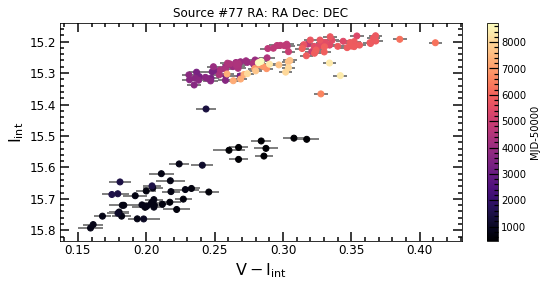

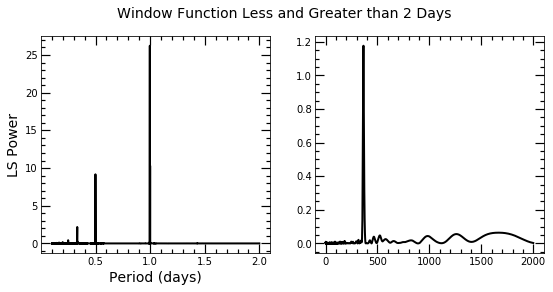

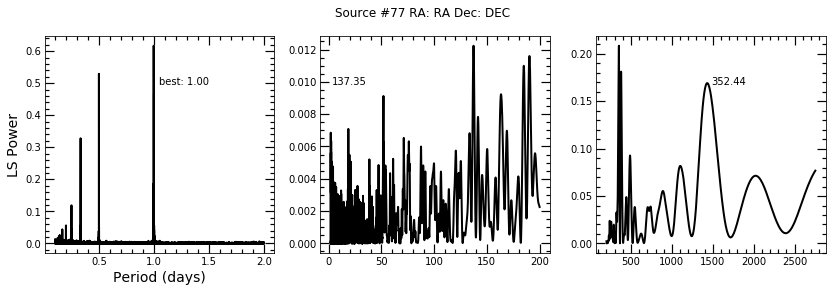

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


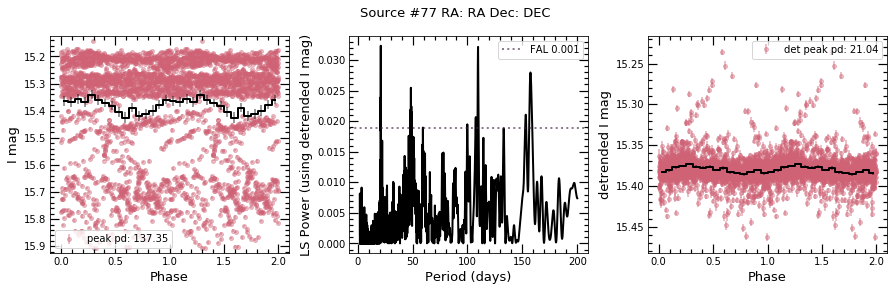

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 21.03659690861523 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 21.03659690861523 days (the detrended peak).


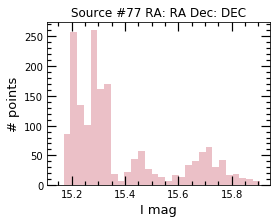



max I band:  15.906
min I band:  15.144
I range:  0.7620000000000005
I stdev:  0.19181405096468448
max V band:  15.962
min V band:  15.508
V range:  0.4540000000000006
V stdev:  0.15634246674998226


In [34]:
basic(21,pbins=16,saveall=save,medlim=False)

Original source number: 87
Current source number: 78
RA,Dec (deg): 12.820833, -73.26833
Established period: nan
NS spin period: nan
Separation: 0.7322323111572513


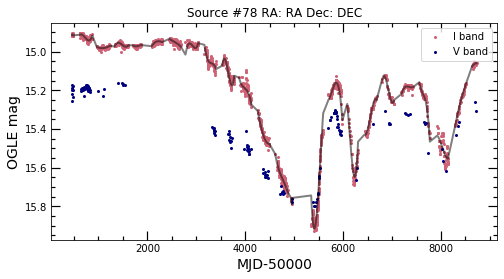

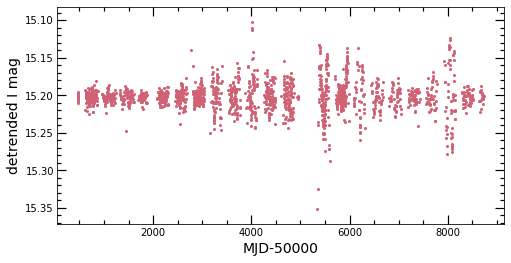

I and V-I correlation: -0.8150152676339503
V and V-I correlation: -0.5866867635448035


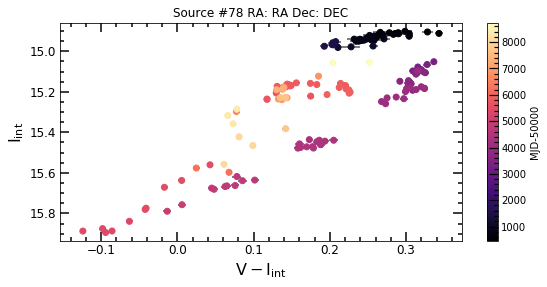

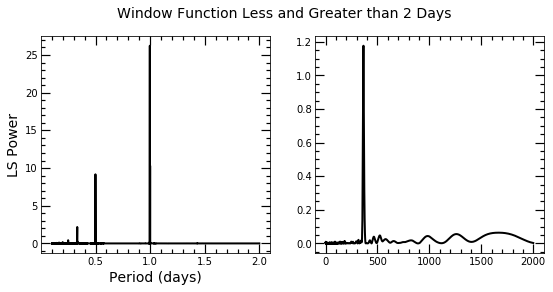

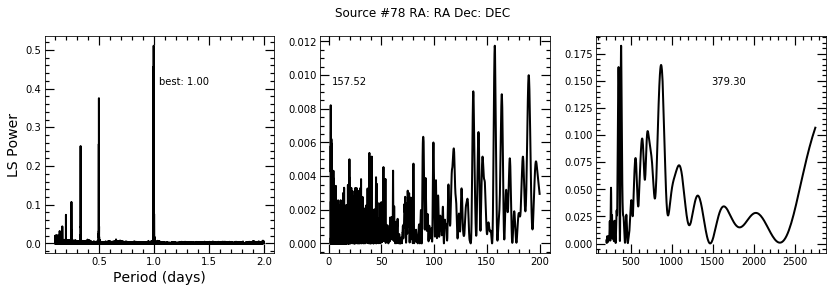

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


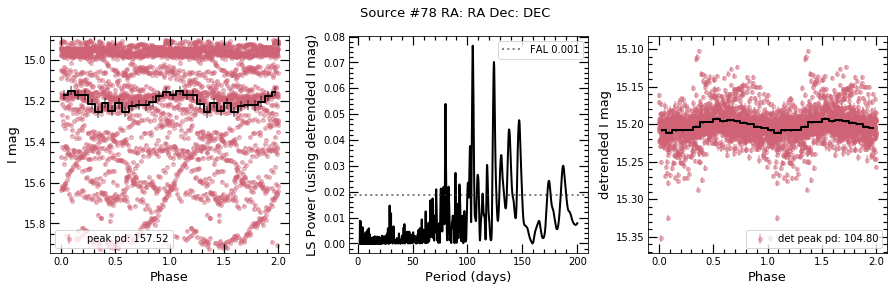

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 104.80296911369439 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 104.80296911369439 days (the detrended peak).


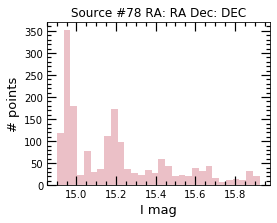



max I band:  15.926
min I band:  14.901
I range:  1.0250000000000004
I stdev:  0.27012718788969486
max V band:  15.801
min V band:  15.16
V range:  0.641
V stdev:  0.18845538797557349


In [35]:
basic(22,pbins=16,saveall=save,medlim=False)

Original source number: 93
Current source number: 79
RA,Dec (deg): 13.032346, -72.35717
Established period: nan
NS spin period: nan
Separation: 1.7089293054259382


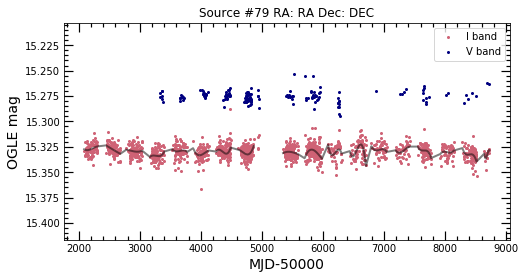

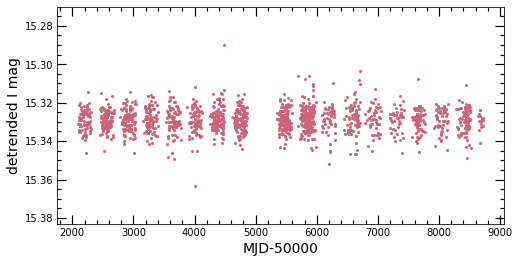

I and V-I correlation: -0.7272831316604508
V and V-I correlation: 0.7351522220762995


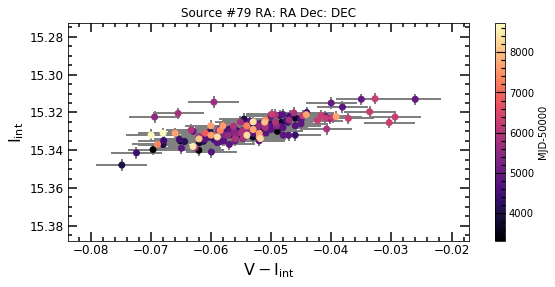

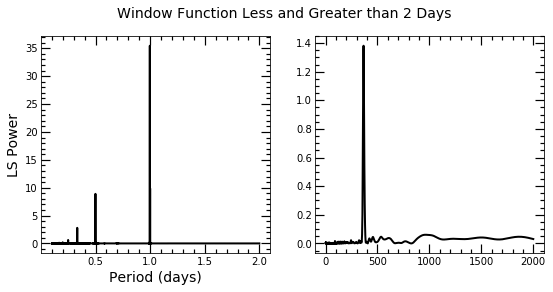

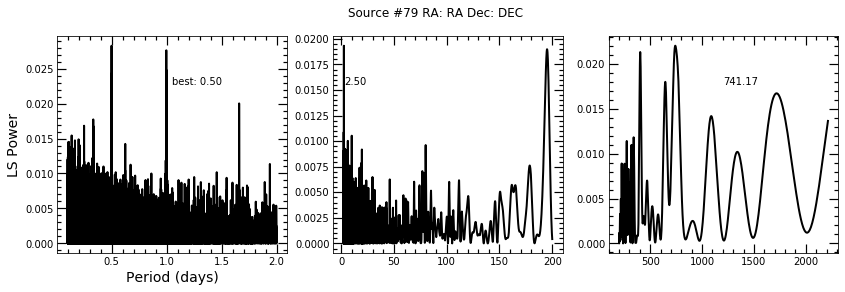

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


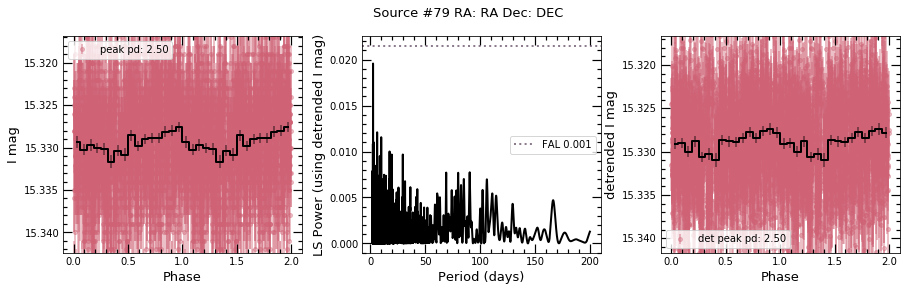

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 2.4980600022569956.
There is at least one alias of the 0.1-2 day detrended search within a day of 2.4980560428513234 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 2.4980560428513234 days (the detrended peak).


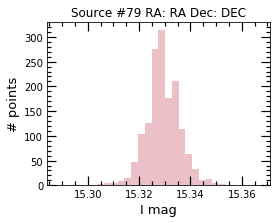



max I band:  15.367
min I band:  15.288
I range:  0.07900000000000063
I stdev:  0.006555624107709534
max V band:  15.295000000000002
min V band:  15.253000000000002
V range:  0.041999999999999815
V stdev:  0.005857712146732683


In [36]:
basic(23,pbins=16,saveall=save,calib=True) #check calibration

Original source number: 95
Current source number: 80
RA,Dec (deg): 13.155417, -72.458885
Established period: nan
NS spin period: nan
Separation: 0.5213547493498698


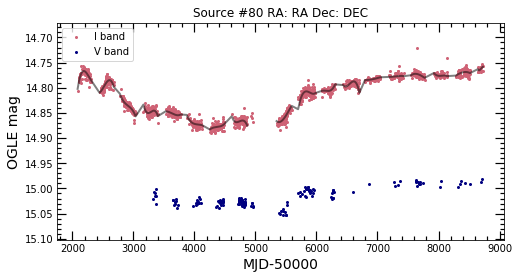

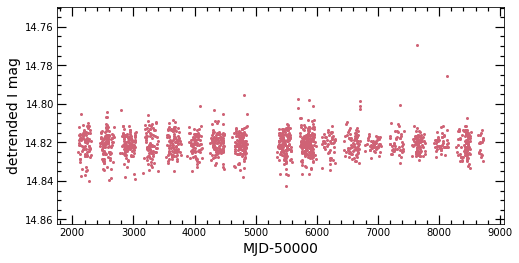

I and V-I correlation: -0.943471636775356
V and V-I correlation: -0.6588177630694824


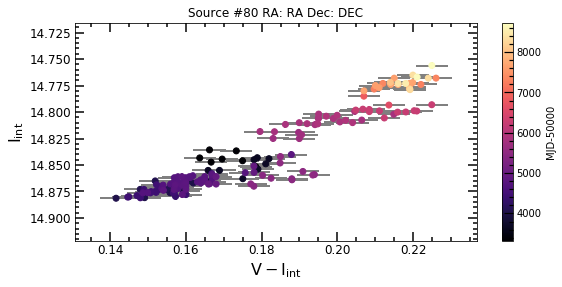

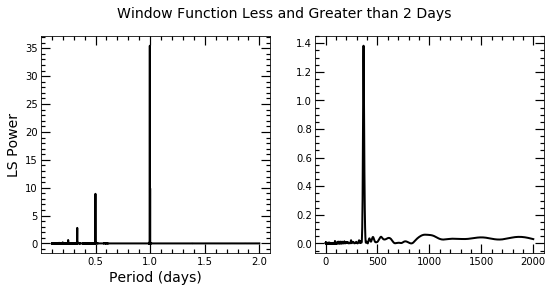

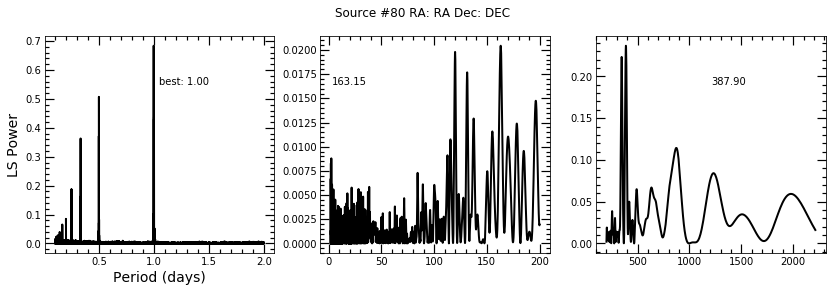

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


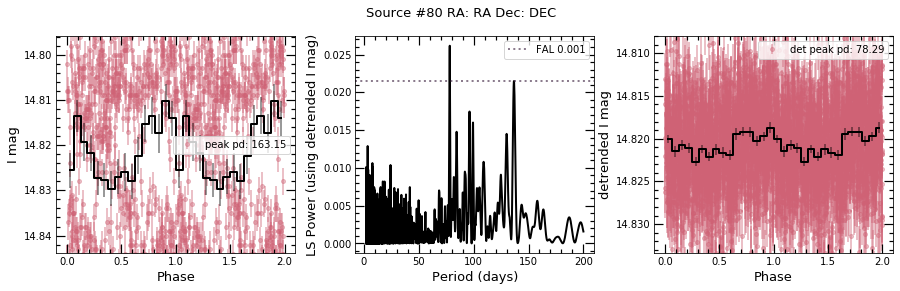

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 78.28946985857435 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 78.28946985857435 days (the detrended peak).


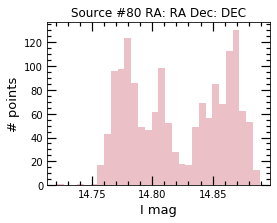



max I band:  14.889
min I band:  14.721
I range:  0.16799999999999926
I stdev:  0.03904534655330587
max V band:  15.053
min V band:  14.981
V range:  0.07200000000000095
V stdev:  0.016393001308739923


In [37]:
basic(24,pbins=16,saveall=save)

Original source number: 96
Current source number: 81
RA,Dec (deg): 13.187667, -72.478775
Established period: nan
NS spin period: nan
Separation: 0.3227359863563713


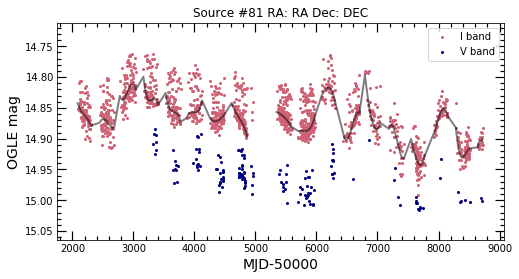

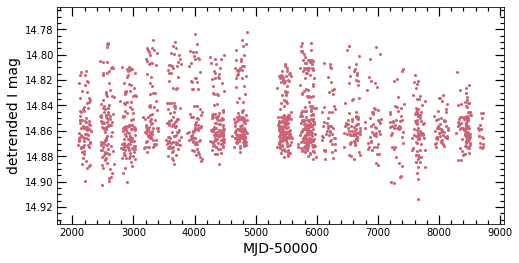

I and V-I correlation: -0.5242624080645107
V and V-I correlation: -0.008505770124147301


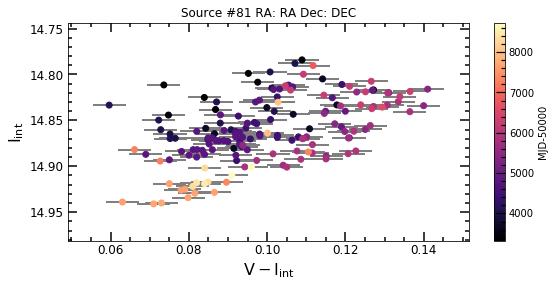

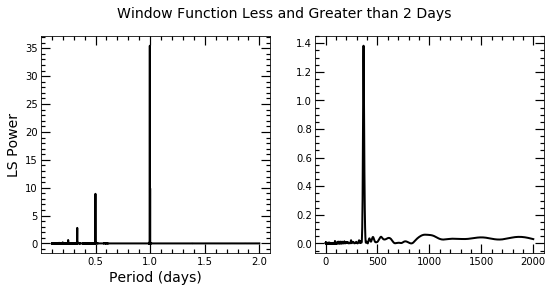

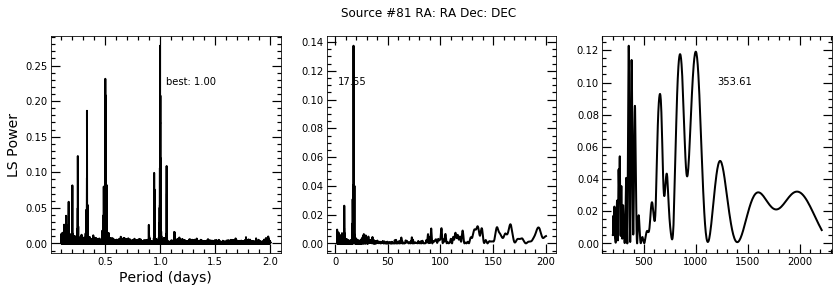

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


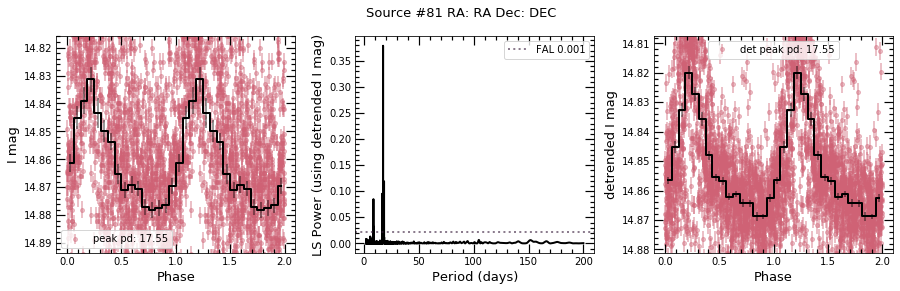

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 17.5507233733284.
There is at least one alias of the 0.1-2 day detrended search within a day of 17.548672818005514 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 17.548672818005514 days (the detrended peak).


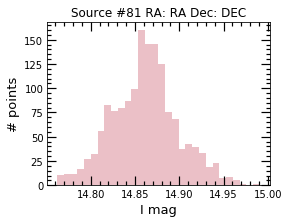



max I band:  14.991
min I band:  14.762
I range:  0.2289999999999992
I stdev:  0.03761252900932711
max V band:  15.015
min V band:  14.885
V range:  0.13000000000000078
V stdev:  0.029502959367501923


In [38]:
basic(25,pbins=16,saveall=save)

Original source number: 97
Current source number: 82
RA,Dec (deg): 13.217584, -72.80828
Established period: nan
NS spin period: nan
Separation: 0.3714398207678562


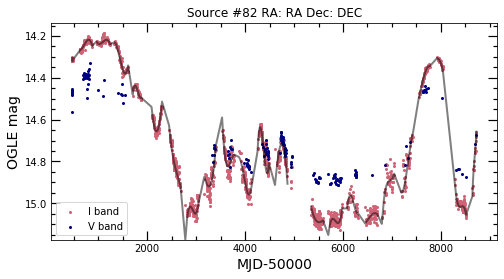

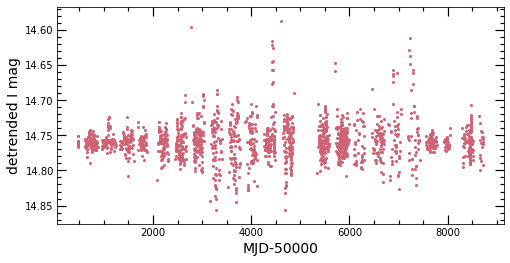

I and V-I correlation: -0.9836267906610039
V and V-I correlation: -0.949454883045651


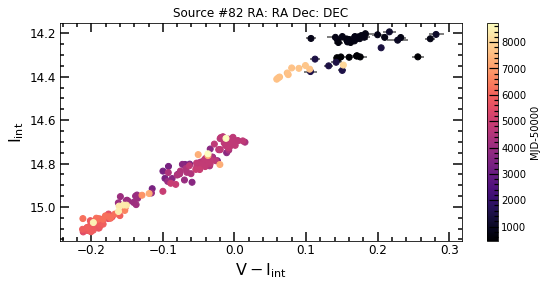

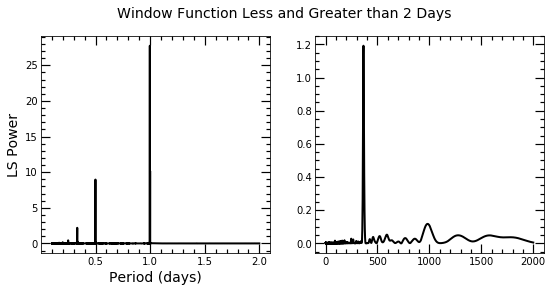

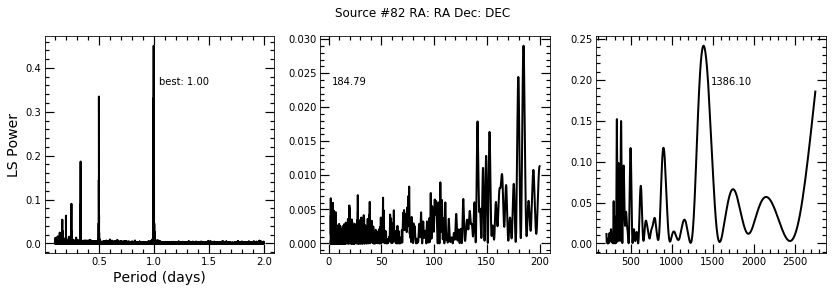

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


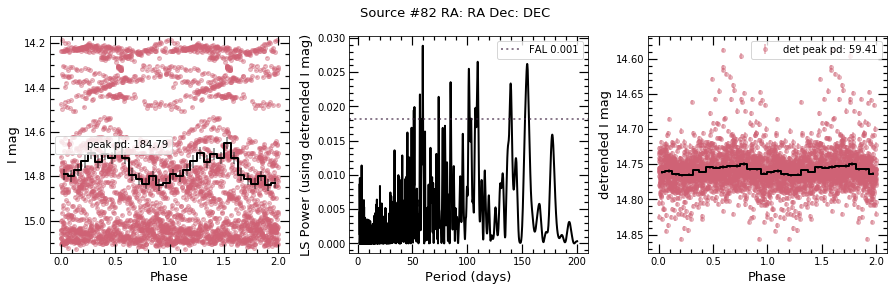

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 59.413326373904624 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 59.413326373904624 days (the detrended peak).


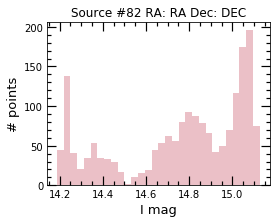



max I band:  15.127
min I band:  14.187
I range:  0.9400000000000013
I stdev:  0.2933382931710367
max V band:  14.914
min V band:  14.33
V range:  0.5839999999999996
V stdev:  0.17087821036245526


In [39]:
basic(26,pbins=16,saveall=save,medlim=False) #strong super-orbital peak

Original source number: 98
Current source number: 83
RA,Dec (deg): 13.247778, -72.9006
Established period: nan
NS spin period: nan
Separation: 0.7278923479836363


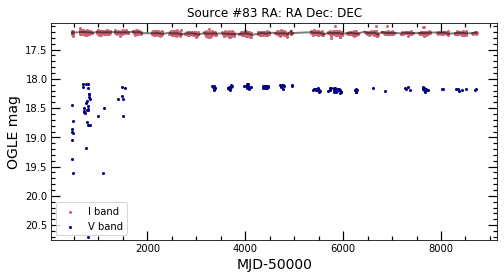

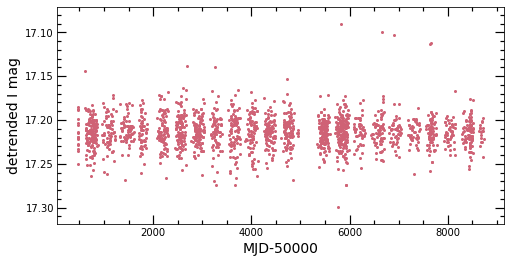

I and V-I correlation: -0.2455623866494508
V and V-I correlation: 0.9978296132599885


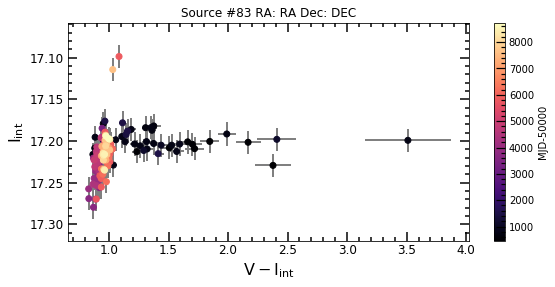

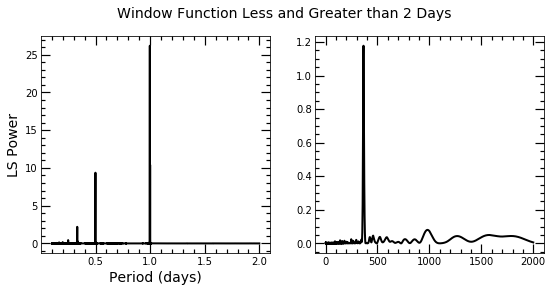

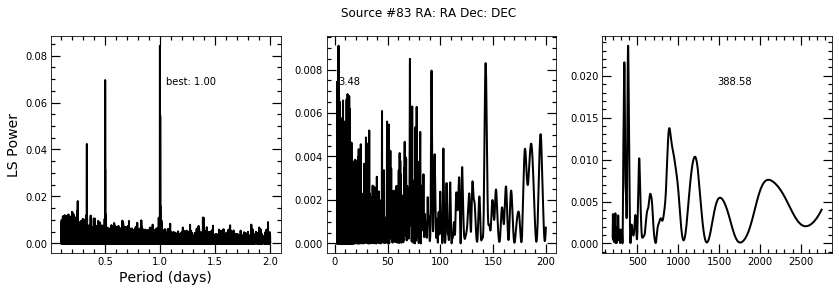

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


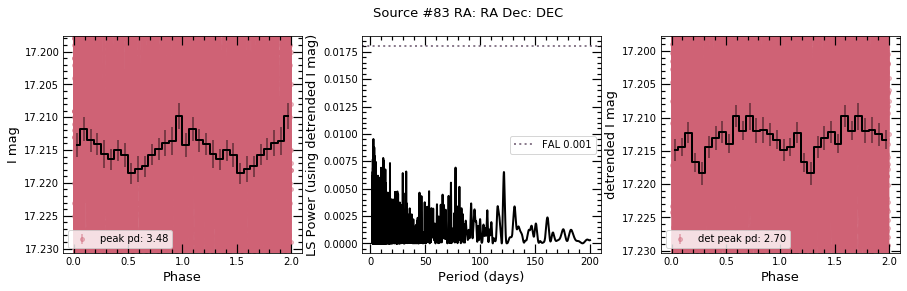

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 2.699126758089259 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 2.699126758089259 days (the detrended peak).


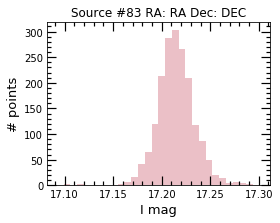



max I band:  17.301
min I band:  17.092
I range:  0.20899999999999963
I stdev:  0.019528380715445406
max V band:  20.71
min V band:  18.079
V range:  2.6310000000000002
V stdev:  0.32210589561004865


In [40]:
basic(27,pbins=16,saveall=save)

Original source number: 100
Current source number: 84
RA,Dec (deg): 13.327146, -72.27155
Established period: nan
NS spin period: nan
Separation: 2.38253918281978


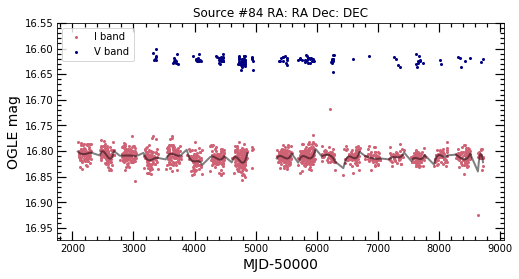

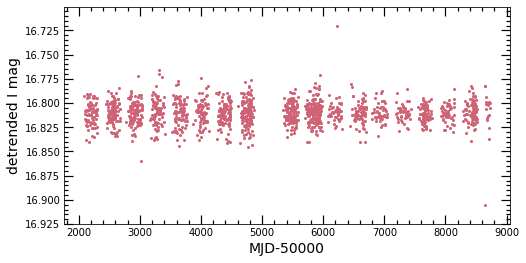

I and V-I correlation: -0.8769800113967978
V and V-I correlation: 0.514008557446414


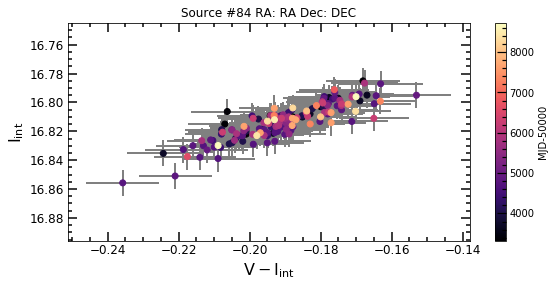

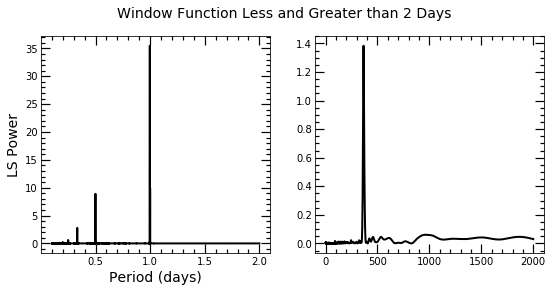

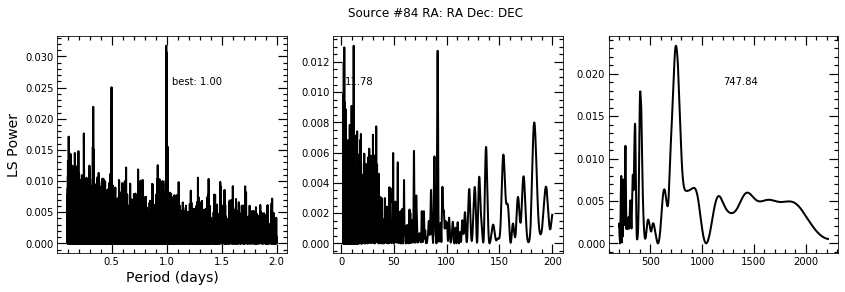

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


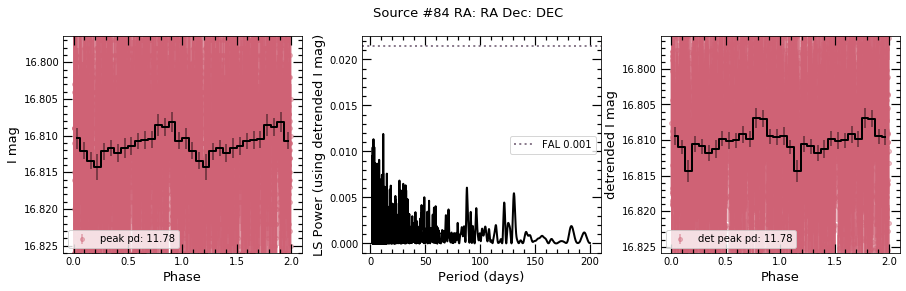

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 11.78323052764294 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 11.78323052764294 days (the detrended peak).


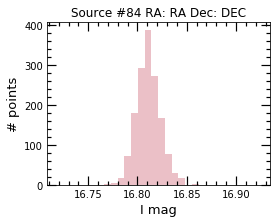



max I band:  16.924000000000003
min I band:  16.718
I range:  0.20600000000000307
I stdev:  0.012572127238352174
max V band:  16.646000000000004
min V band:  16.6
V range:  0.04600000000000293
V stdev:  0.00665240456229936


In [41]:
basic(28,pbins=16,saveall=save,calib=True) #check calibration

Original source number: 101
Current source number: 85
RA,Dec (deg): 13.371667, -72.56333
Established period: nan
NS spin period: nan
Separation: 0.6750252590555292


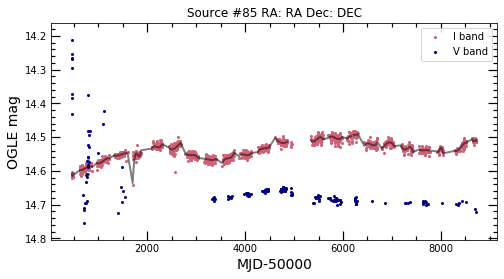

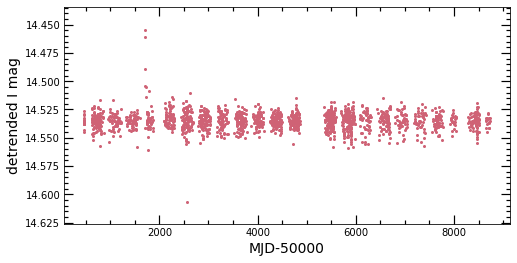

I and V-I correlation: -0.7681050531669736
V and V-I correlation: 0.9700221010725473


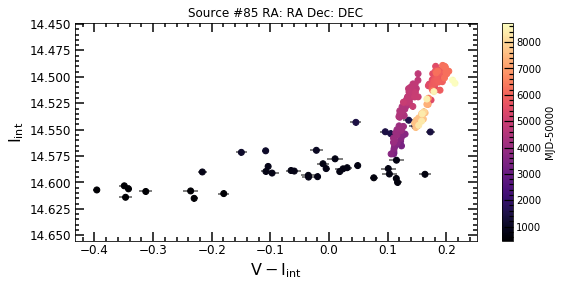

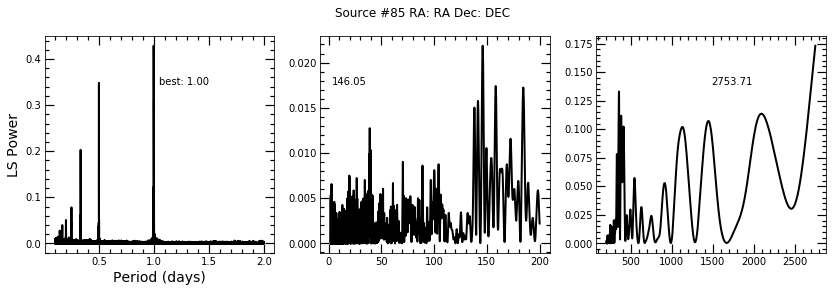

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


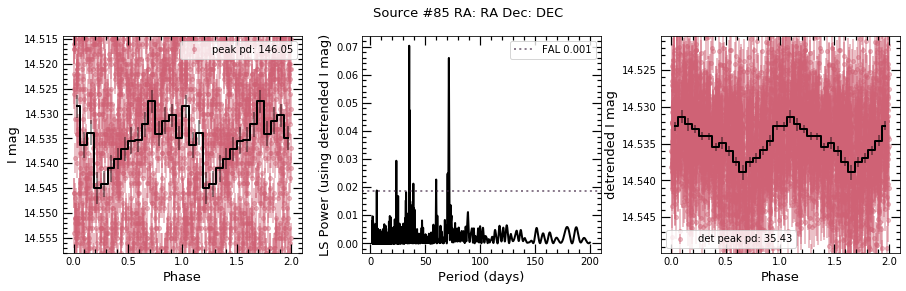

Comparing peaks of 0.1-2 day window function and detrended periodogram...
No peaks found so not searching for beat periods or aliases.


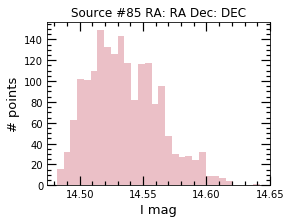



max I band:  14.642
min I band:  14.482
I range:  0.16000000000000014
I stdev:  0.027345771371484404
max V band:  14.756
min V band:  14.211
V range:  0.5449999999999999
V stdev:  0.08622969594507024


In [42]:
basic(29,pbins=16,saveall=save) #check on weird V values

Original source number: 104
Current source number: 86
RA,Dec (deg): 13.423982, -72.88615
Established period: nan
NS spin period: nan
Separation: 2.458240850477693


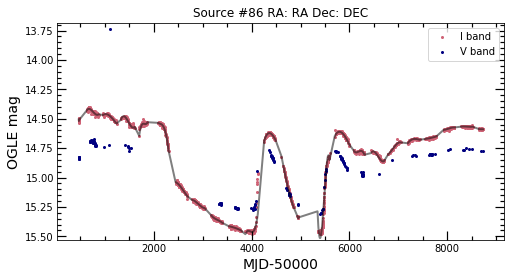

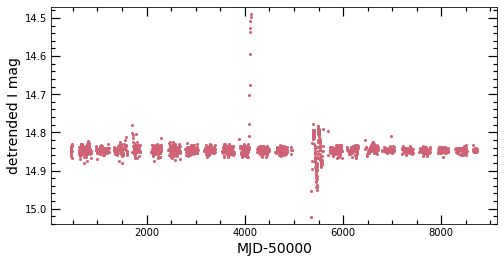

I and V-I correlation: -0.8755528565327301
V and V-I correlation: -0.616191492468143


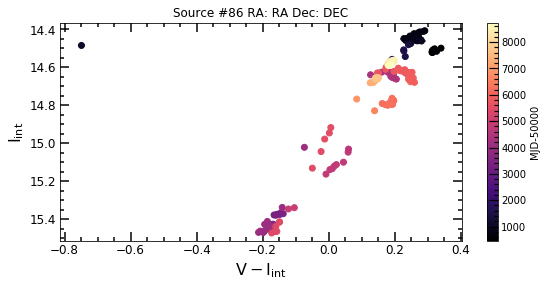

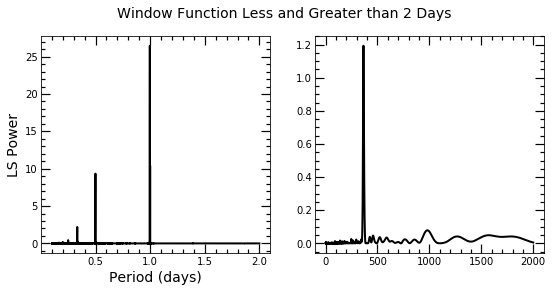

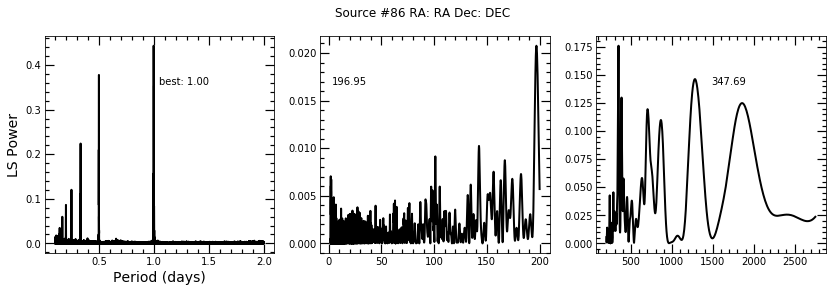

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


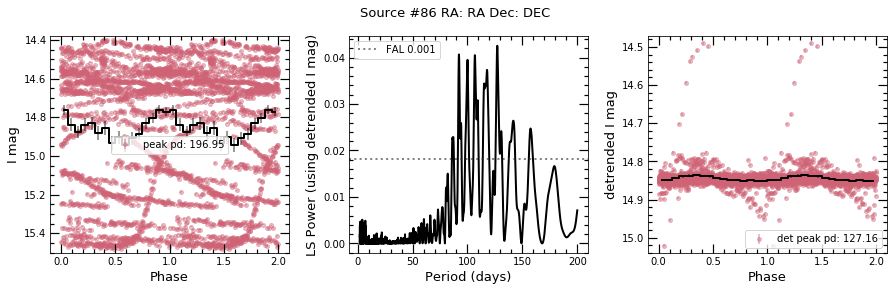

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 127.1617834686679 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 127.1617834686679 days (the detrended peak).


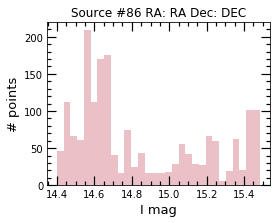



max I band:  15.484
min I band:  14.399
I range:  1.0850000000000009
I stdev:  0.3385370001412316
max V band:  15.308
min V band:  13.735
V range:  1.5730000000000004
V stdev:  0.22299204637314102


In [43]:
basic(30,pbins=16,saveall=save,medlim=False)

Original source number: 105
Current source number: 87
RA,Dec (deg): 13.46875, -72.44417
Established period: nan
NS spin period: nan
Separation: 1.4931021441023236


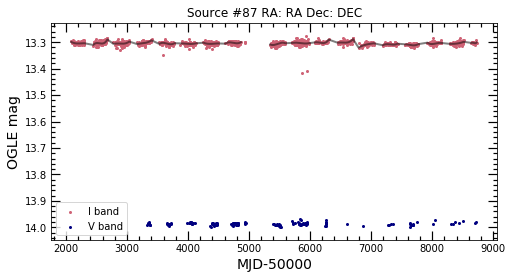

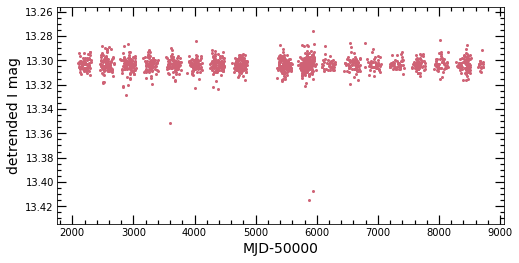

I and V-I correlation: -0.6464696903041375
V and V-I correlation: 0.5519736780640019


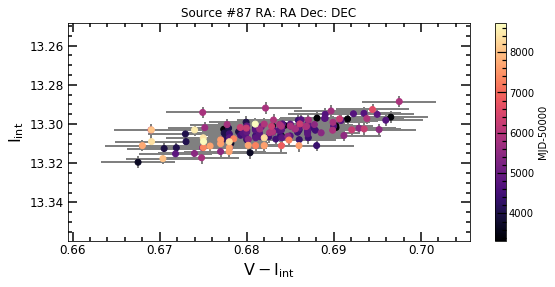

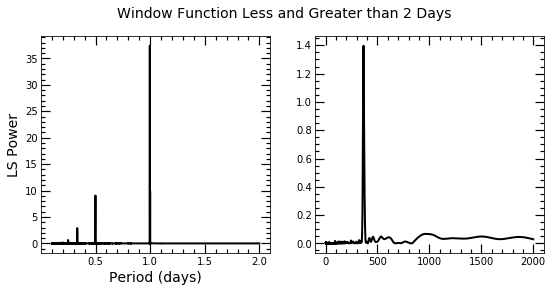

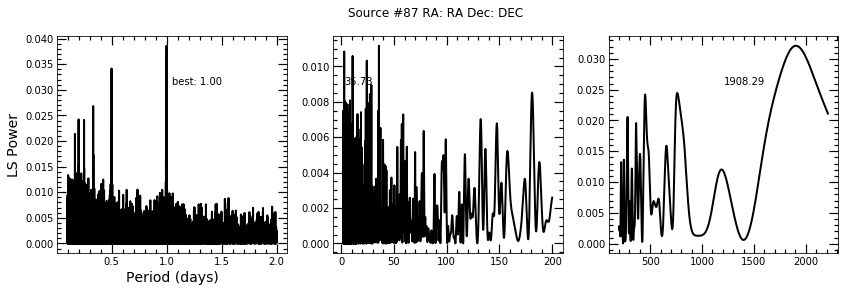

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


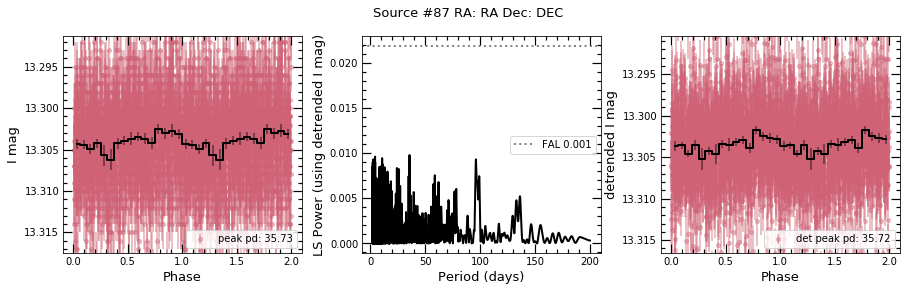

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 35.72185150184294 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 35.72185150184294 days (the detrended peak).


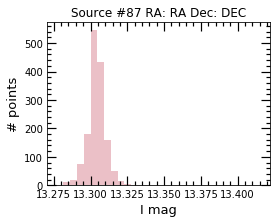



max I band:  13.415
min I band:  13.277
I range:  0.1379999999999999
I stdev:  0.007233561870429601
max V band:  13.999
min V band:  13.969000000000001
V range:  0.02999999999999936
V stdev:  0.00493685186135816


In [49]:
basic(31,pbins=16,saveall=save,calib=True) 

Original source number: 106
Current source number: 88
RA,Dec (deg): 13.53615, -72.53543
Established period: nan
NS spin period: nan
Separation: nan


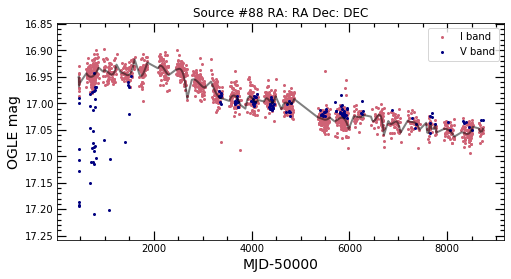

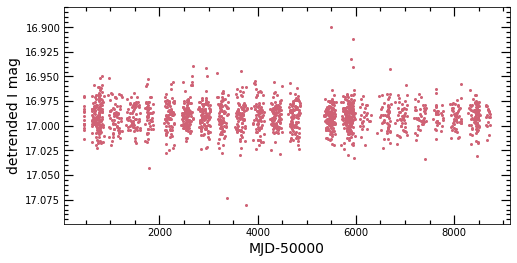

I and V-I correlation: -0.72135262346909
V and V-I correlation: 0.8364826423834628


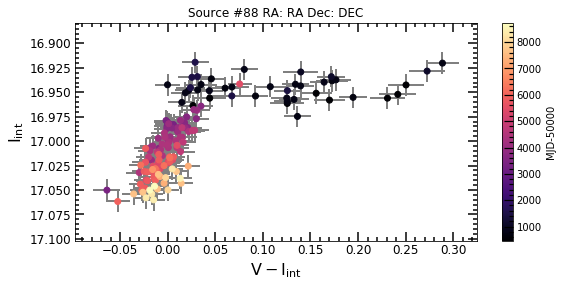

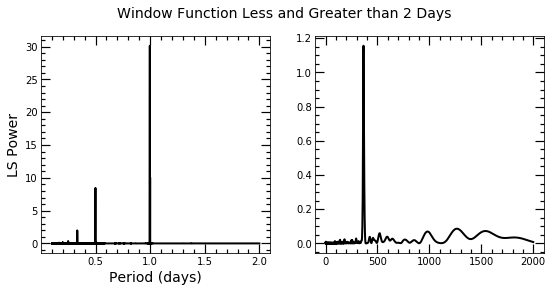

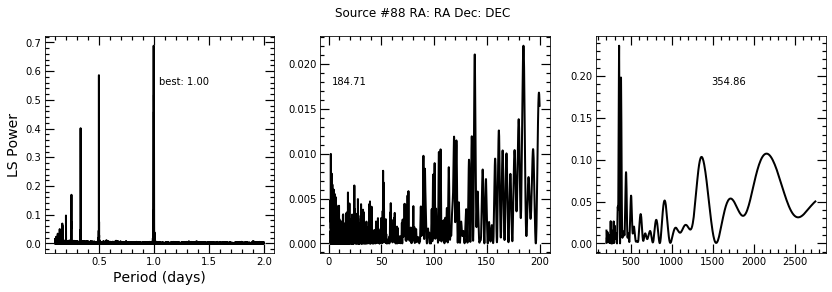

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


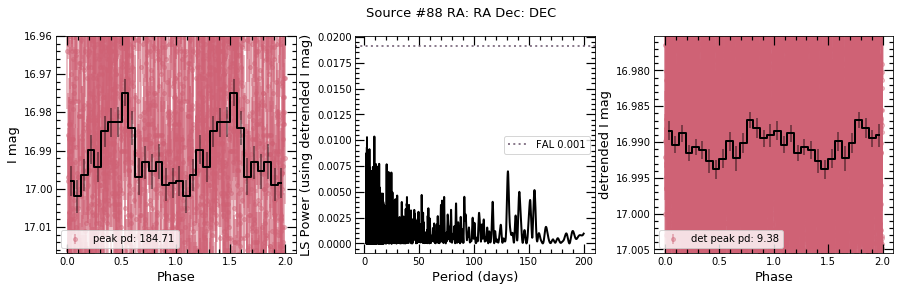

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 9.379064726062682 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 9.379064726062682 days (the detrended peak).


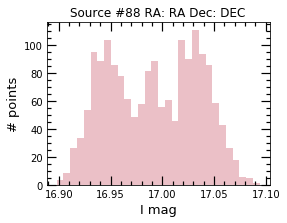



max I band:  17.094
min I band:  16.898
I range:  0.1960000000000015
I stdev:  0.04359469489083697
max V band:  17.209
min V band:  16.942
V range:  0.26699999999999946
V stdev:  0.04693304173475907


In [50]:
basic(32,pbins=16,saveall=save) #worth checking calibration but not necessarily an issue

Original source number: 107
Current source number: 89
RA,Dec (deg): 13.538656, -72.695335
Established period: nan
NS spin period: nan
Separation: 1.0859548508868178
empty file for OIII I


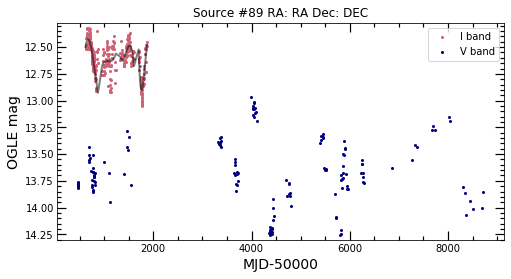

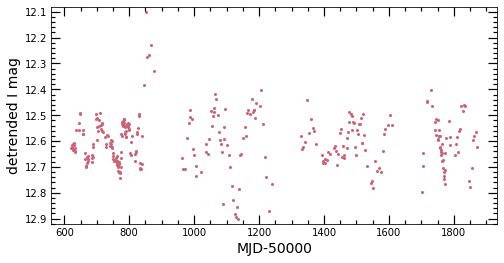

I and V-I correlation: -0.057333142384844854
V and V-I correlation: 0.978473180595306


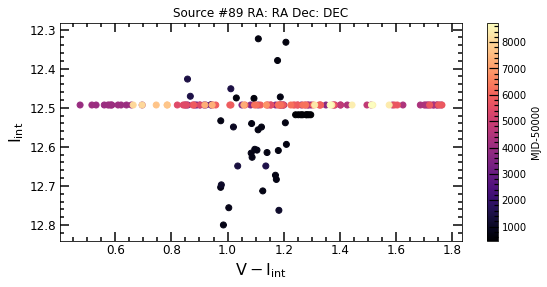

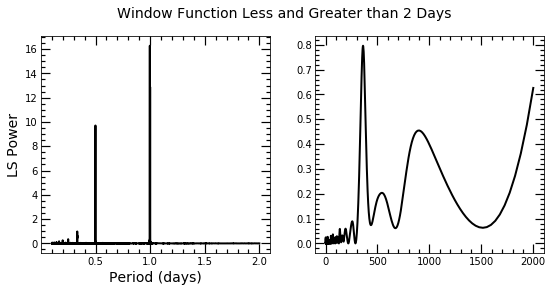

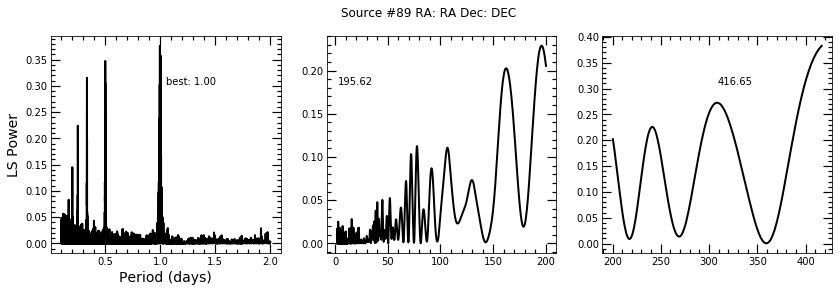

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


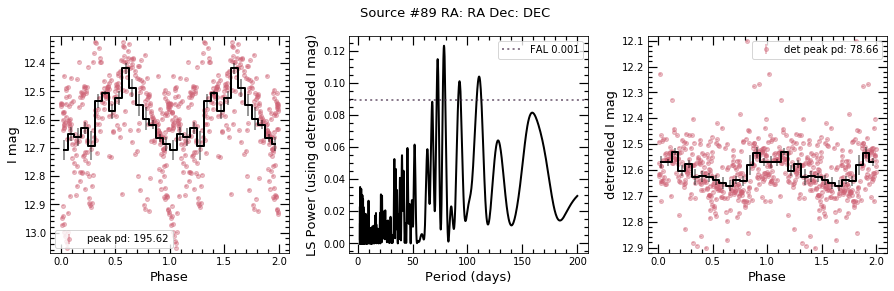

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 78.66374904169221 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 78.66374904169221 days (the detrended peak).


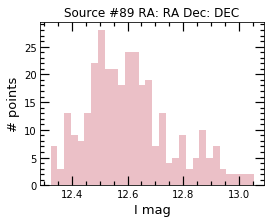



max I band:  13.053
min I band:  12.323
I range:  0.7300000000000004
I stdev:  0.15480118197953385
max V band:  14.256
min V band:  12.968
V range:  1.2880000000000003
V stdev:  0.3090547910797653


In [51]:
basic(33,pbins=16,saveall=save,medlim=False) #interpolation doesn't make sense for this source; maybe do periodicity search in V band (as well)

Original source number: 111
Current source number: 90
RA,Dec (deg): 13.782148, -72.37787
Established period: nan
NS spin period: nan
Separation: 0.7733069774609475


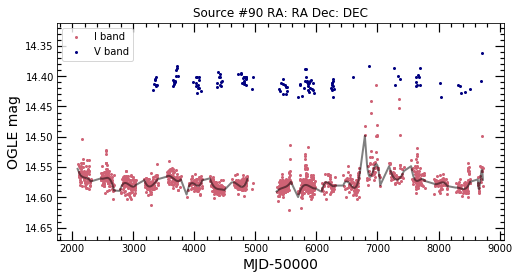

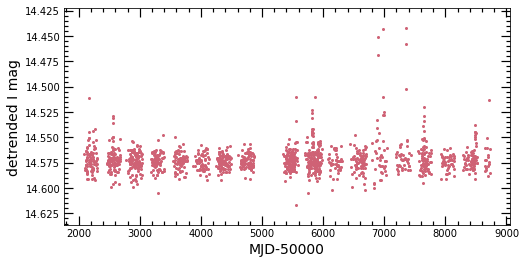

I and V-I correlation: -0.4499013176301471
V and V-I correlation: 0.3944493577891568


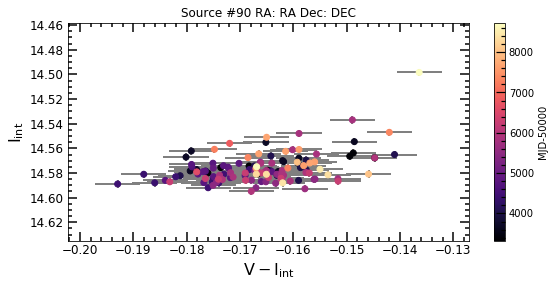

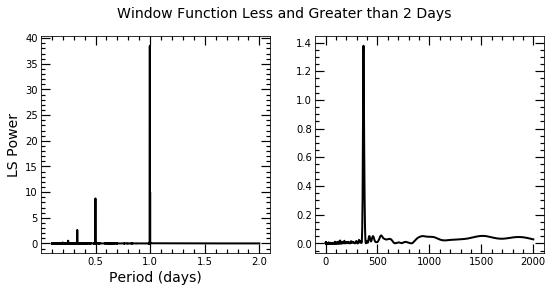

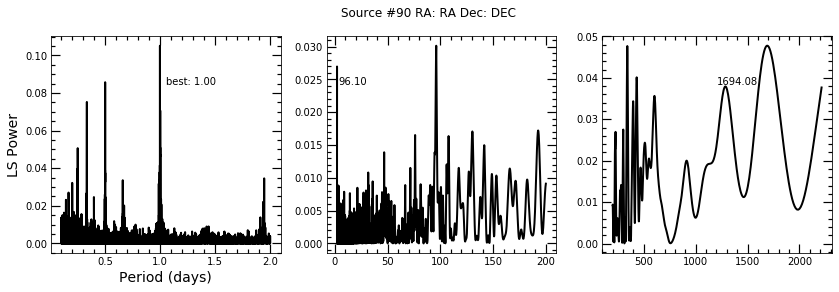

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


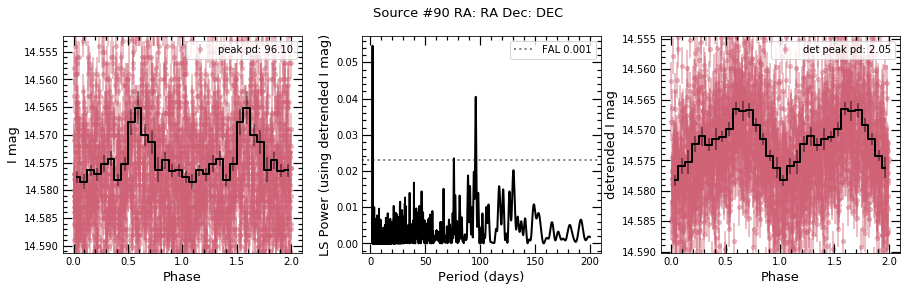

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 2.045842874306839.
There is at least one alias of the 0.1-2 day detrended search within a day of 2.0458025192765126 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 2.0458025192765126 days (the detrended peak).


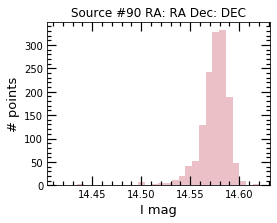



max I band:  14.621
min I band:  14.414
I range:  0.20700000000000074
I stdev:  0.016476346637921153
max V band:  14.435
min V band:  14.362
V range:  0.0730000000000004
V stdev:  0.011796221696021795


In [52]:
basic(34,pbins=16,saveall=save) 

In [53]:
summ[summ['src_n']==114]

,src_n,ra_deg,dec_deg,spin period,perr,est. period,Coe est. period,Coe eccentricity,Coe eccentricity err,sep,...,mean abs bright residual,residual slope diff,bright res monotonic frac,bright - faint slope,best 2-200d period,2-200d period above FAL?,Haberl nearby period above FAL?,Coe nearby period above FAL?,# 2-200d peaks above FAL,best near Coe
91,114,14.022837,-72.00308,0.0,1.97,0.0,NaN,NaN,NaN,1.127127,...,0.004906,0.293561,0.58209,0.114015,0.0,no,no,no,0,0.0


Original source number: 114
Current source number: 91
RA,Dec (deg): 14.022837, -72.00308
Established period: nan
NS spin period: nan
Separation: 1.1271267307353983


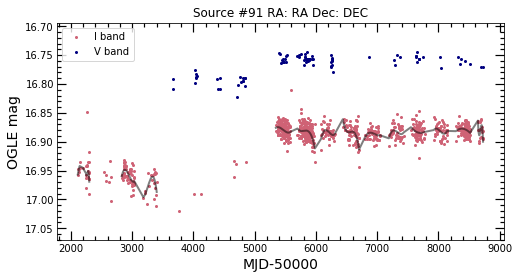

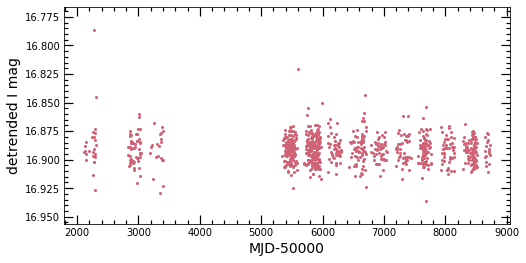

I and V-I correlation: -0.9149324003847996
V and V-I correlation: -0.5085433409713094


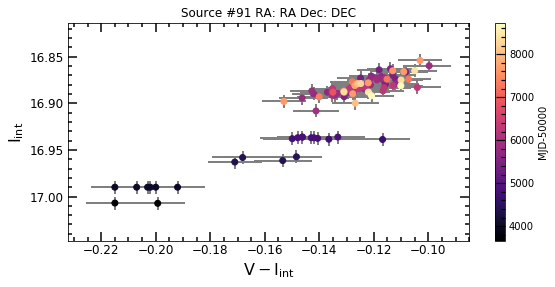

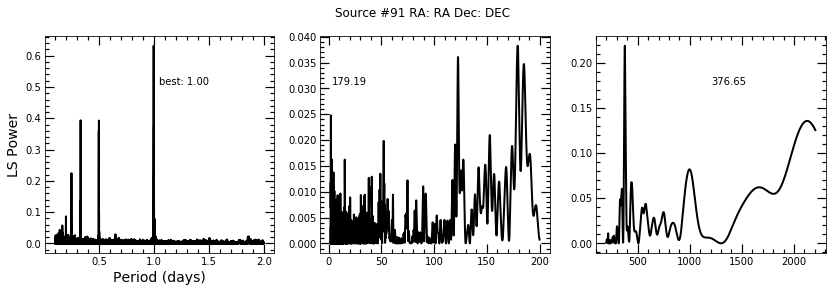

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


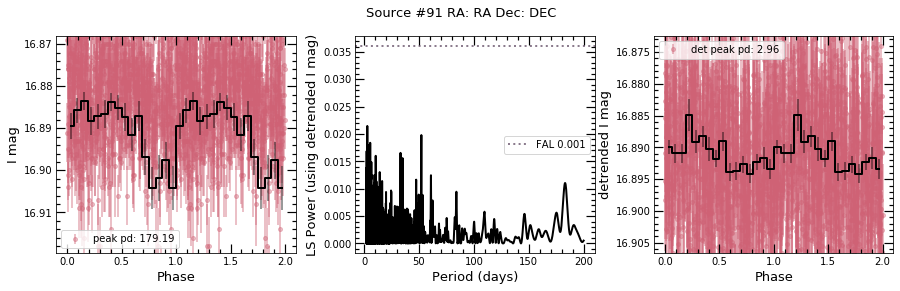

Comparing peaks of 0.1-2 day window function and detrended periodogram...
No peaks found so not searching for beat periods or aliases.


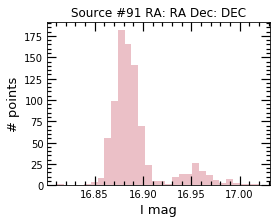



max I band:  17.021
min I band:  16.811
I range:  0.21000000000000085
I stdev:  0.02929534853808877
max V band:  16.822
min V band:  16.744
V range:  0.0779999999999994
V stdev:  0.017985784620867282


In [54]:
basic(35,pbins=16,saveall=save) #check calibration

Original source number: 115
Current source number: 92
RA,Dec (deg): 14.057791, -72.4999
Established period: 72.231
NS spin period: nan
Separation: 1.072509092593595


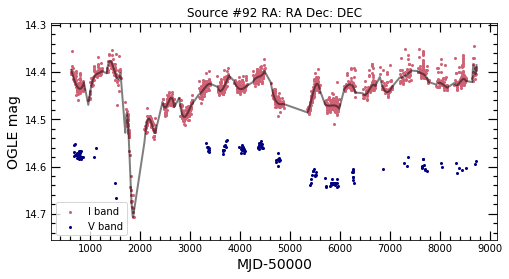

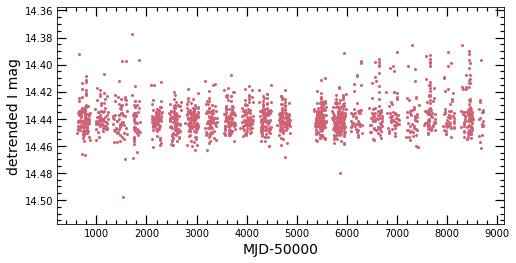

I and V-I correlation: -0.3634415884802355
V and V-I correlation: 0.5967636297255688


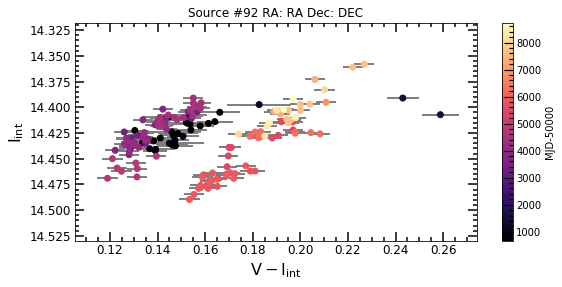

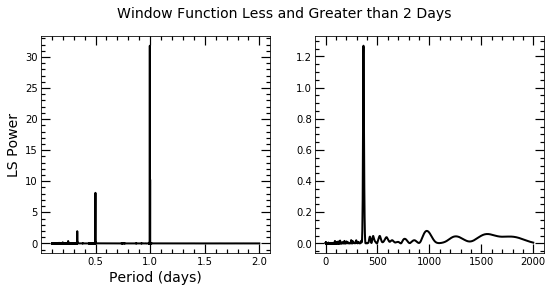

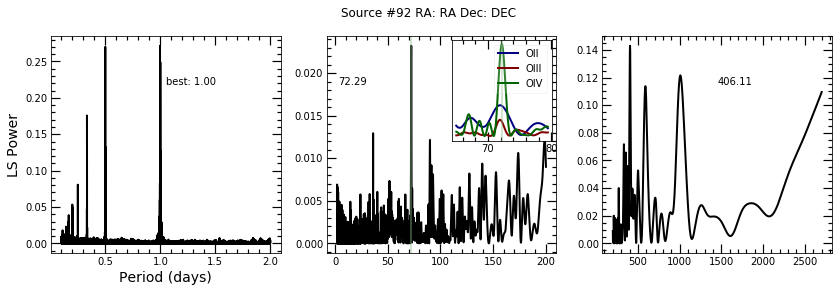

Phase-folding with established orbital period and highest peak within 7.22 days of that value...


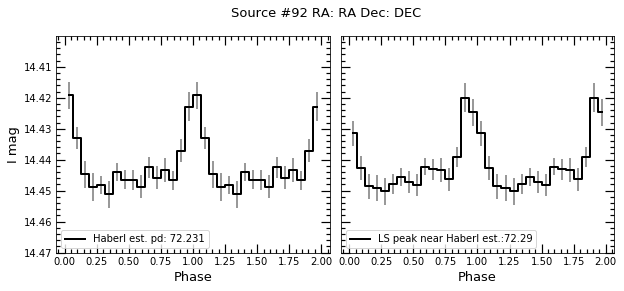

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


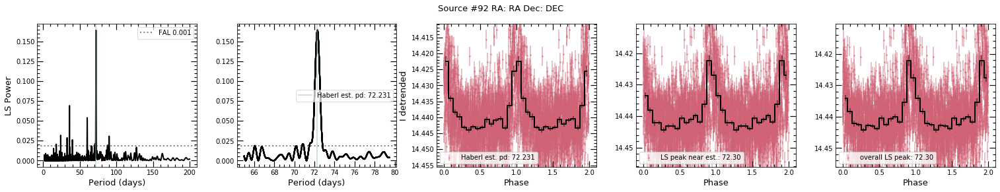

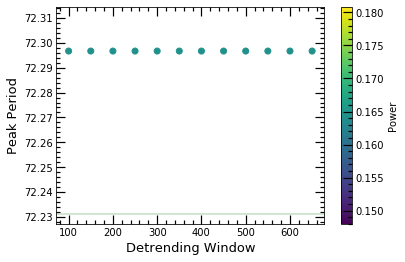

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 72.2965678737076.
There is at least one alias of the 0.1-2 day detrended search within a day of the established period.
There is at least one alias of the 0.1-2 day window function within a day of the established period.


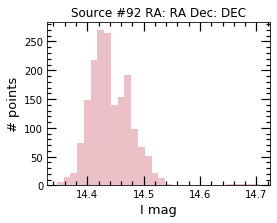



max I band:  14.706
min I band:  14.346
I range:  0.35999999999999943
I stdev:  0.04009890140981963
max V band:  14.666
min V band:  14.544
V range:  0.12199999999999989
V stdev:  0.029576642353463672


In [55]:
basic(36,pbins=16,saveall=save) 

Original source number: 116
Current source number: 93
RA,Dec (deg): 14.061033, -72.632164
Established period: nan
NS spin period: nan
Separation: 0.8958477176463405


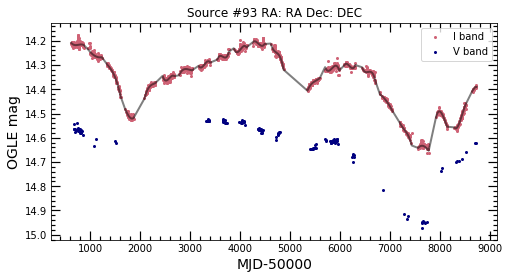

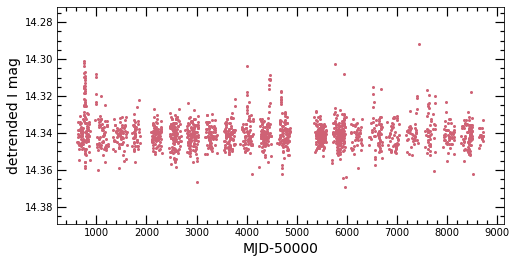

I and V-I correlation: -0.4230636455926597
V and V-I correlation: 0.021972129599033417


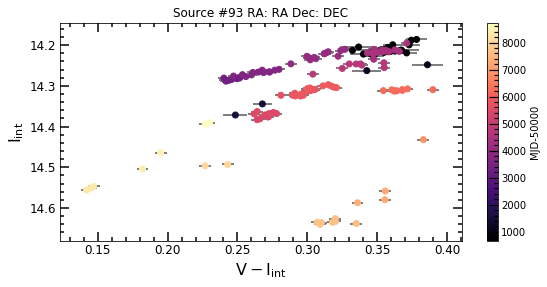

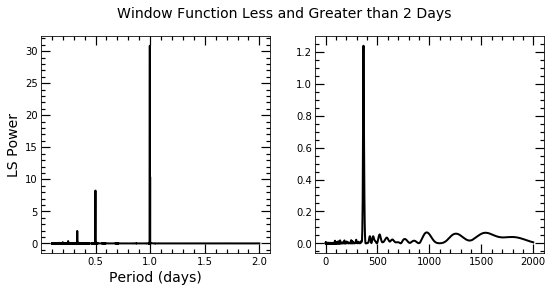

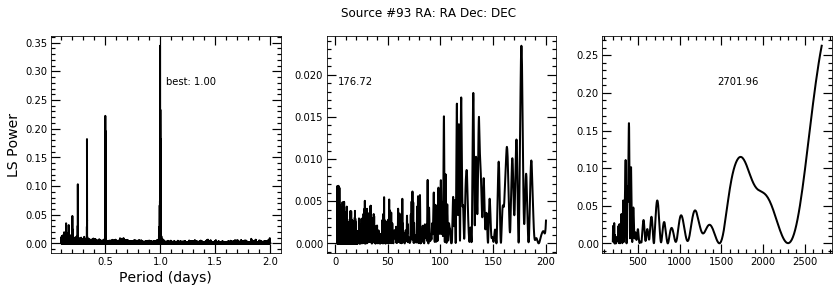

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


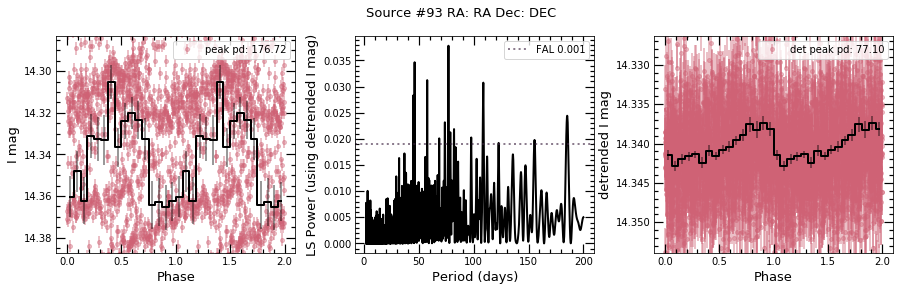

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 77.10390124966683 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 77.10390124966683 days (the detrended peak).


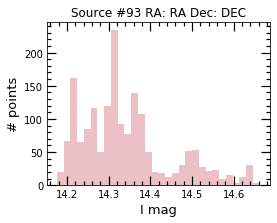



max I band:  14.663
min I band:  14.176
I range:  0.4870000000000001
I stdev:  0.10715396199222854
max V band:  14.973
min V band:  14.521
V range:  0.45199999999999996
V stdev:  0.10184484746992924


In [56]:
basic(37,pbins=16,saveall=save)

Original source number: 119
Current source number: 94
RA,Dec (deg): 14.348582, -72.39883
Established period: nan
NS spin period: nan
Separation: 1.7069379325809675


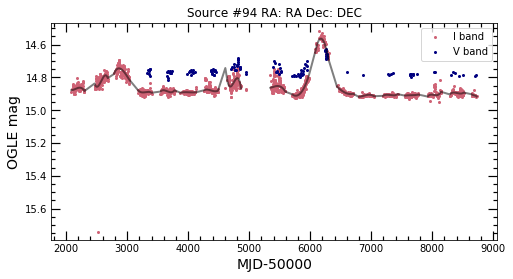

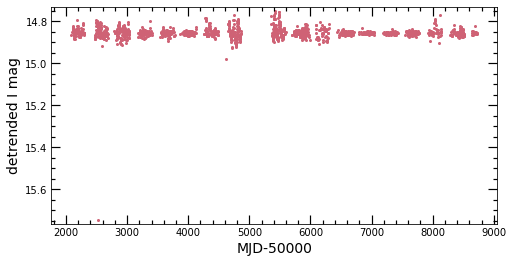

I and V-I correlation: -0.9562602917034363
V and V-I correlation: -0.8245738782996825


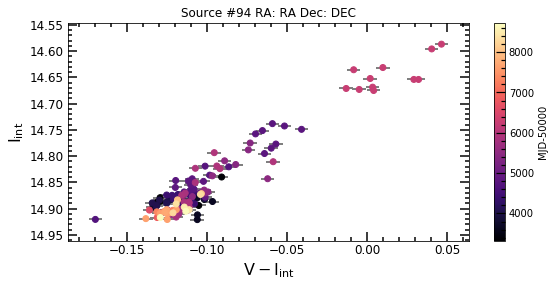

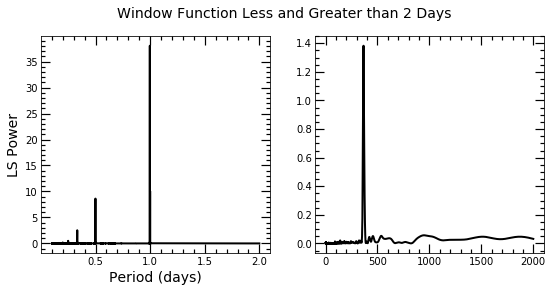

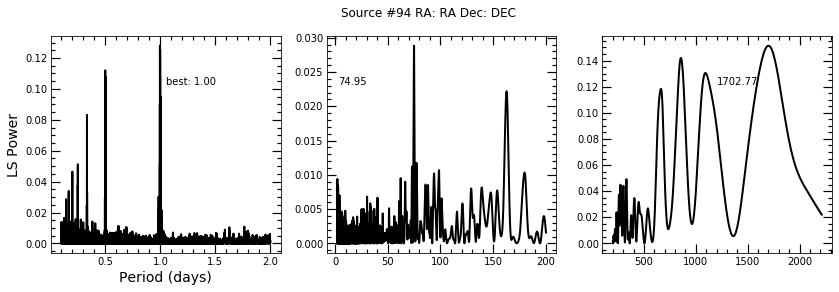

using best period from middle periodogram to phase-fold data, after detrending with 100
running periodogram on detrended data


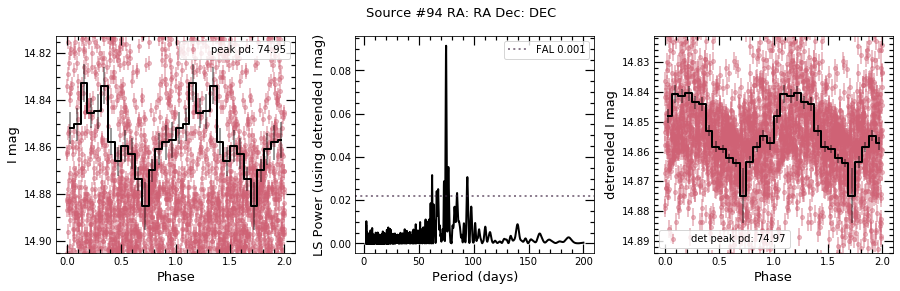

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 74.9188399142593.
There is at least one alias of the 0.1-2 day detrended search within a day of 74.96617597150328 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 74.96617597150328 days (the detrended peak).


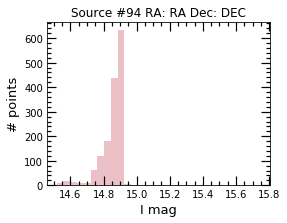



max I band:  15.743
min I band:  14.517
I range:  1.2260000000000009
I stdev:  0.06939099506287752
max V band:  14.815
min V band:  14.627
V range:  0.18799999999999883
V stdev:  0.03787273485462357


In [57]:
basic(38,pbins=16,saveall=save,window=100) #outliers but still consistent period independent of window

Original source number: 121
Current source number: 95
RA,Dec (deg): 15.126078, -72.34253
Established period: nan
NS spin period: nan
Separation: 0.950553401074245


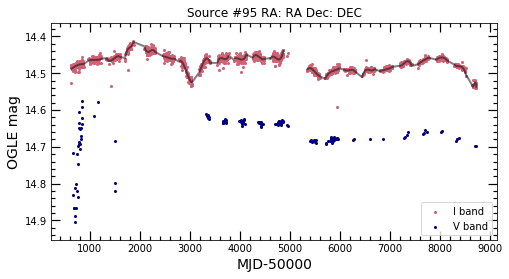

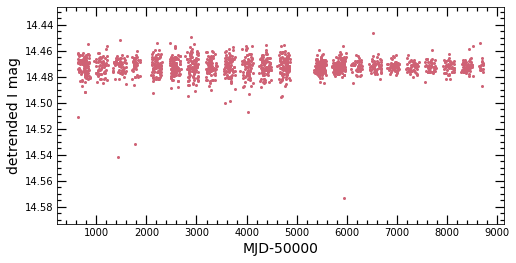

I and V-I correlation: 0.11779854679896275
V and V-I correlation: 0.9598427579632554


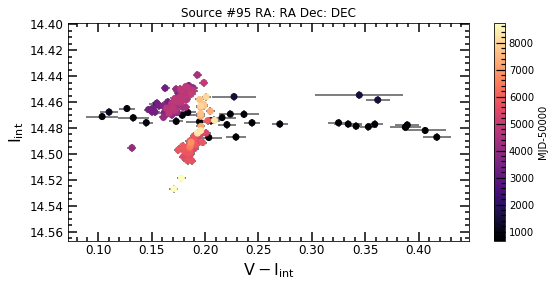

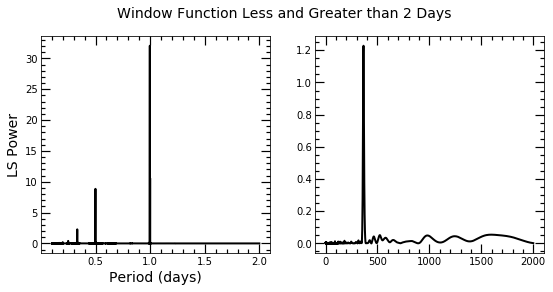

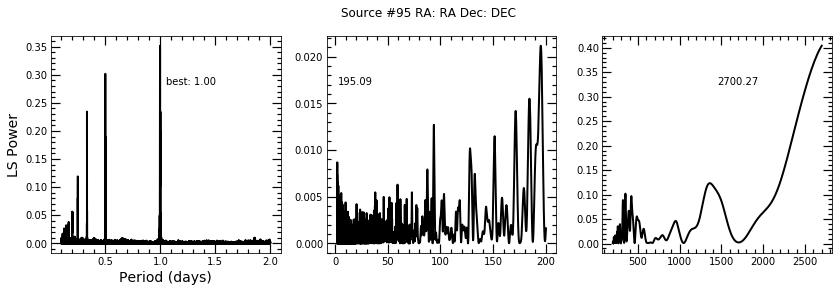

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


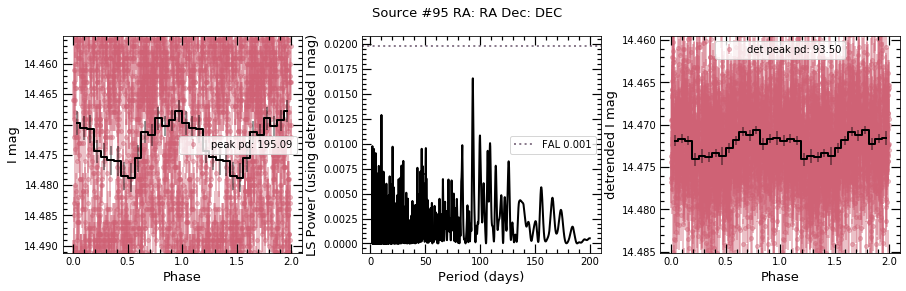

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 93.52127522512056.
There is at least one alias of the 0.1-2 day detrended search within a day of 93.49530086621294 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 93.49530086621294 days (the detrended peak).


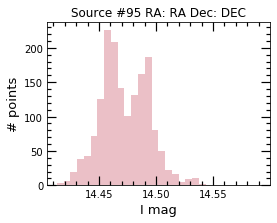



max I band:  14.591
min I band:  14.413
I range:  0.17799999999999905
I stdev:  0.02122196424896646
max V band:  14.904
min V band:  14.575
V range:  0.3290000000000006
V stdev:  0.05897846335440724


In [58]:
basic(39,pbins=16,saveall=save)

Original source number: 123
Current source number: 96
RA,Dec (deg): 15.232704, -72.38897
Established period: nan
NS spin period: nan
Separation: 1.462548114503142


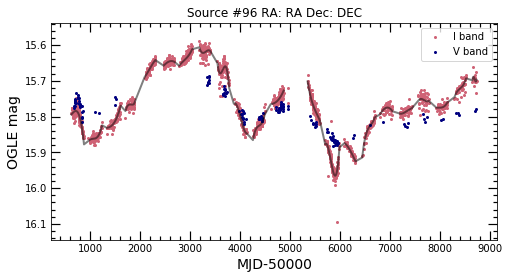

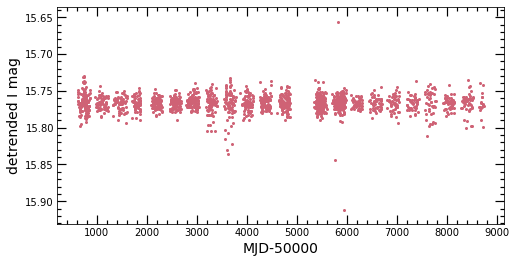

I and V-I correlation: -0.9094432831105441
V and V-I correlation: -0.5812402963746065


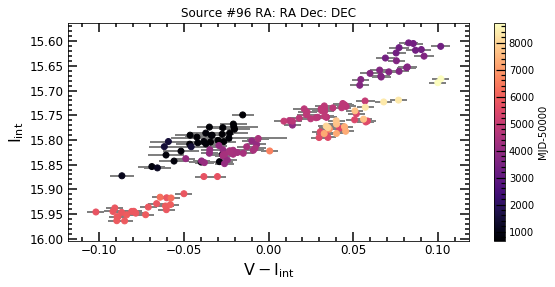

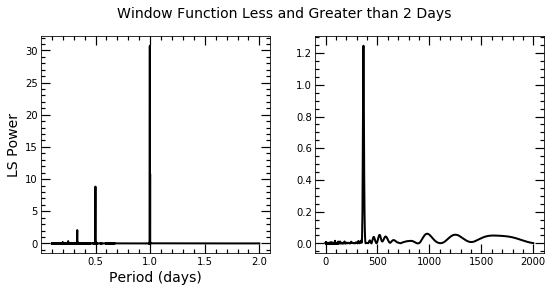

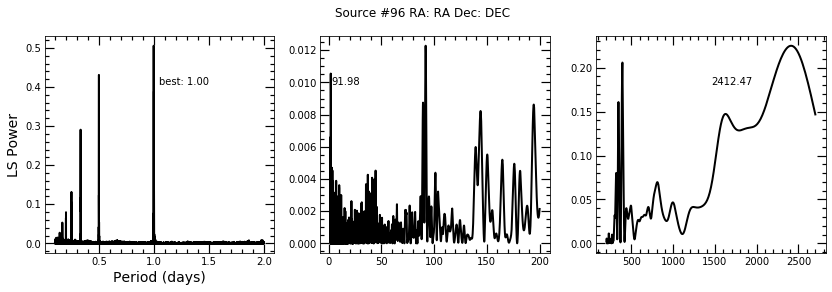

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


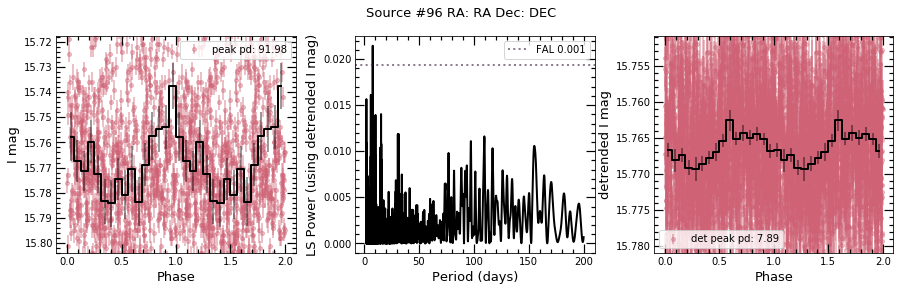

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 7.891861145727857.
There is at least one alias of the 0.1-2 day detrended search within a day of 7.891634934277497 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 7.891634934277497 days (the detrended peak).


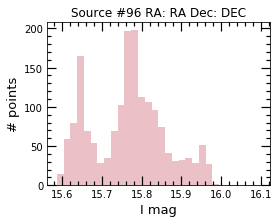



max I band:  16.096
min I band:  15.588
I range:  0.5080000000000009
I stdev:  0.09208875137629839
max V band:  15.881
min V band:  15.686
V range:  0.19500000000000028
V stdev:  0.04413156129365994


In [59]:
basic(40,pbins=16,saveall=save)

Original source number: 124
Current source number: 97
RA,Dec (deg): 15.448232, -71.930756
Established period: nan
NS spin period: nan
Separation: 1.6167622603650758


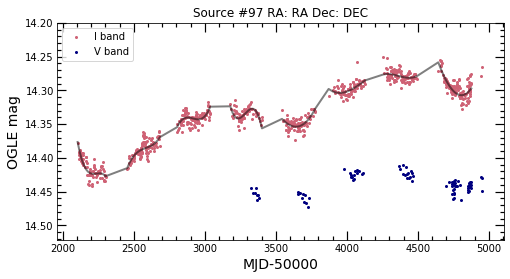

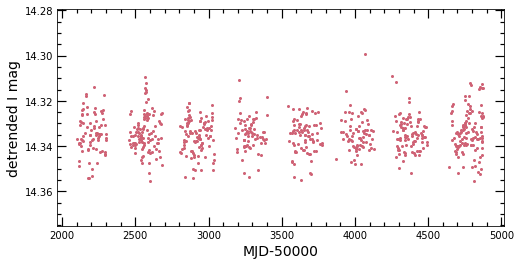

I and V-I correlation: -0.828569247670743
V and V-I correlation: -0.1708069714597908


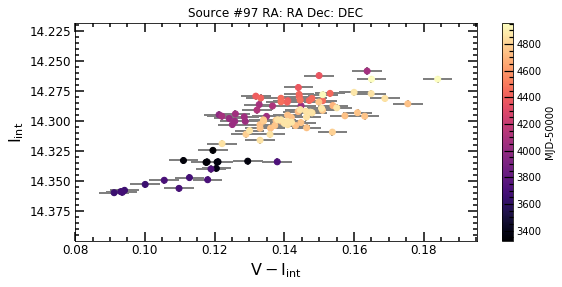

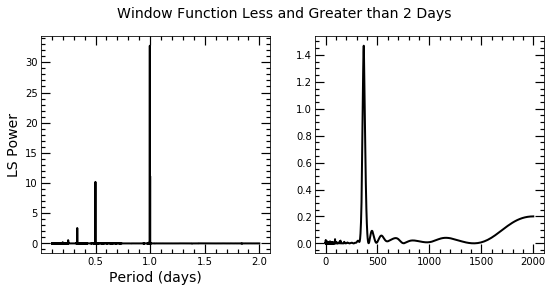

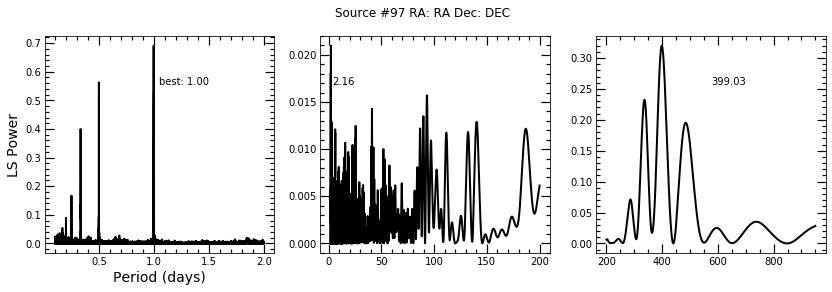

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


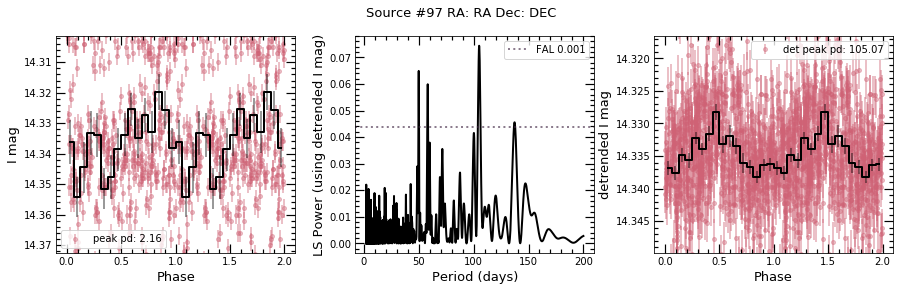

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 105.07354385488922 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 105.07354385488922 days (the detrended peak).


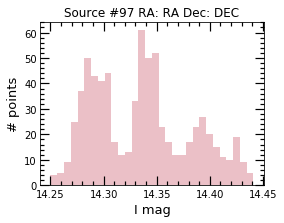



max I band:  14.441
min I band:  14.25
I range:  0.19100000000000072
I stdev:  0.045313818763909636
max V band:  14.472
min V band:  14.411
V range:  0.06099999999999994
V stdev:  0.013629916582238482


In [60]:
basic(41,pbins=16,saveall=save)

Original source number: 126
Current source number: 99
RA,Dec (deg): 15.482882, -72.174416
Established period: nan
NS spin period: nan
Separation: 1.2498756452559772


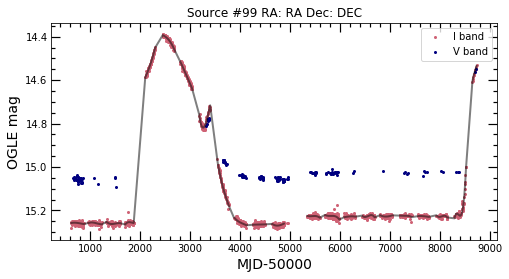

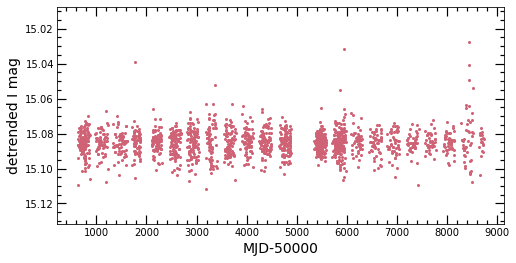

I and V-I correlation: -0.9659853103847417
V and V-I correlation: -0.8976564703240444


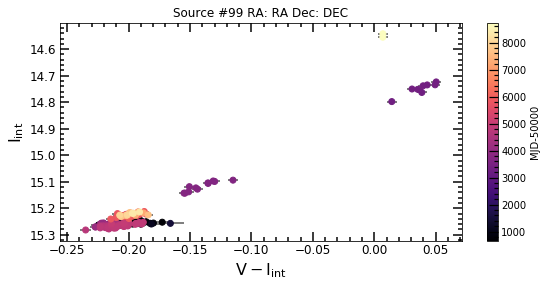

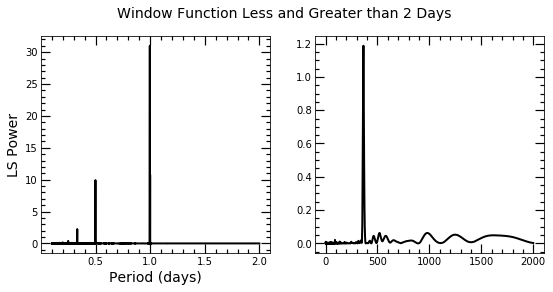

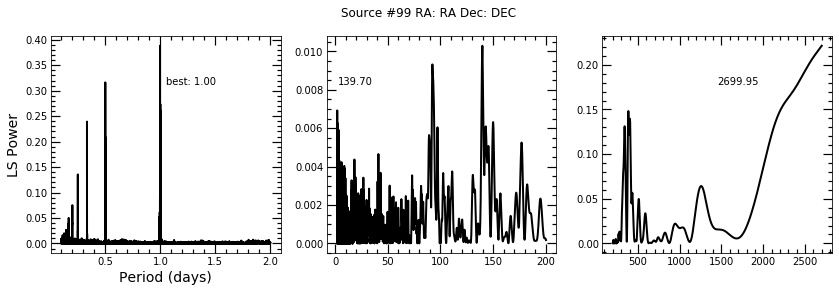

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


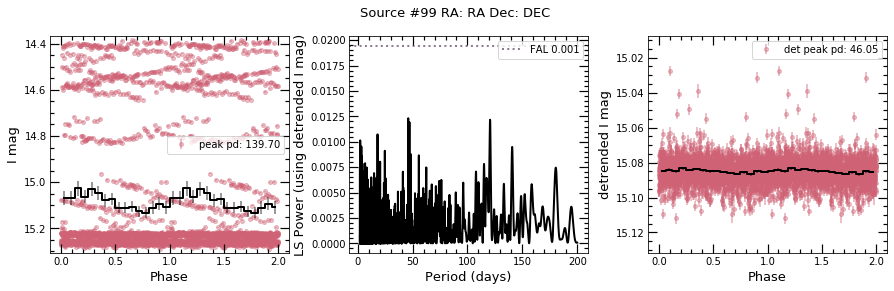

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 46.05342429747429 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 46.05342429747429 days (the detrended peak).


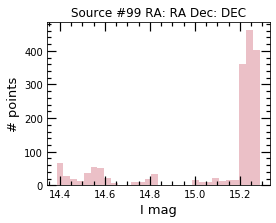



max I band:  15.288
min I band:  14.386
I range:  0.902000000000001
I stdev:  0.2868203072356147
max V band:  15.091
min V band:  14.549
V range:  0.5419999999999998
V stdev:  0.07621644991328248


In [61]:
basic(42,pbins=16,saveall=save,medlim=False)

Original source number: 128
Current source number: 100
RA,Dec (deg): 15.882196, -73.02901
Established period: nan
NS spin period: nan
Separation: 1.5884354148910238


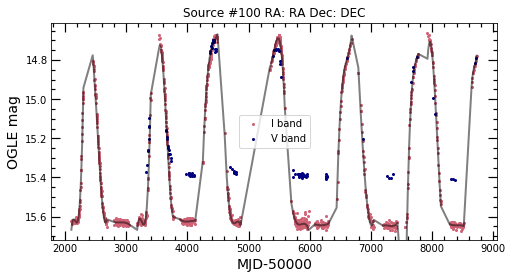

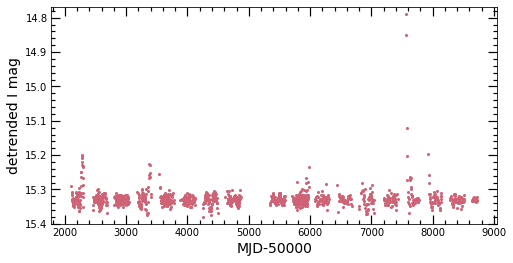

I and V-I correlation: -0.945568932143824
V and V-I correlation: -0.8840279171742701


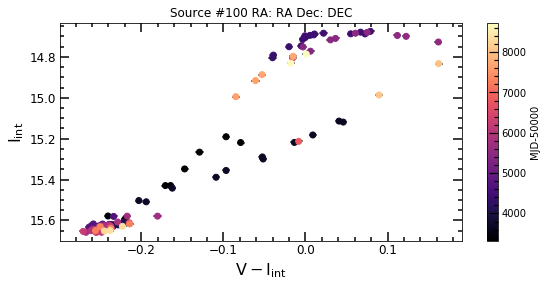

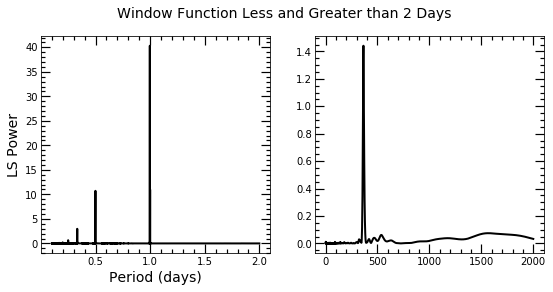

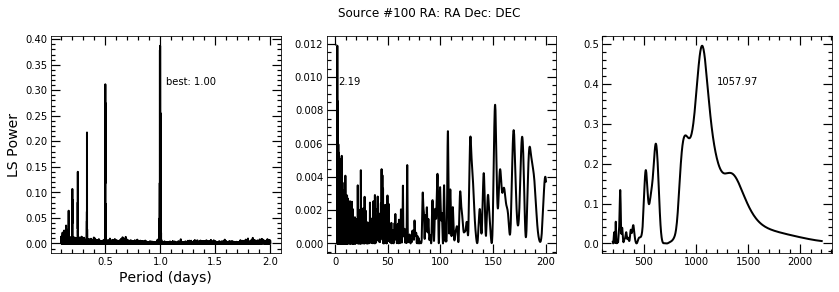

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


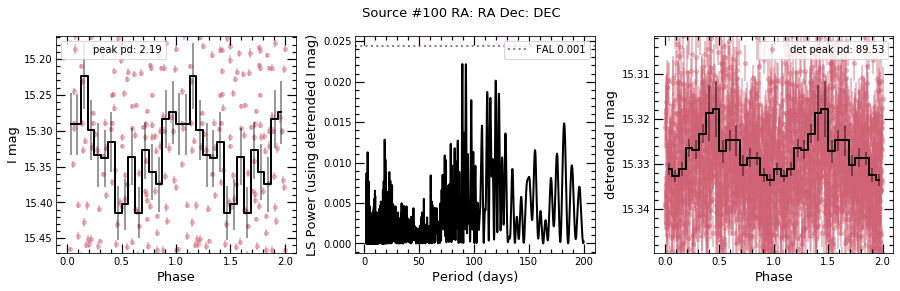

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 89.52935636907424 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 89.52935636907424 days (the detrended peak).


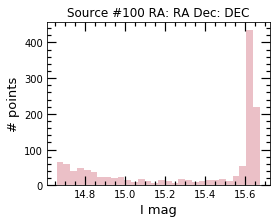



max I band:  15.671
min I band:  14.66
I range:  1.0109999999999992
I stdev:  0.3720736764600826
max V band:  15.412
min V band:  14.696
V range:  0.7160000000000011
V stdev:  0.26996207157540797


In [62]:
basic(43,pbins=16,saveall=save) #super-orbital trend

Original source number: 129
Current source number: 101
RA,Dec (deg): 15.89009, -72.07152
Established period: nan
NS spin period: nan
Separation: nan


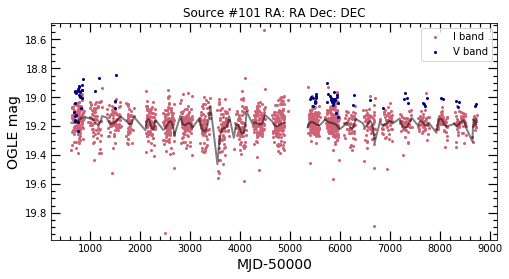

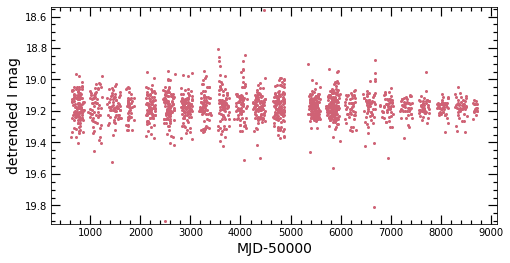

I and V-I correlation: -0.5620907892707462
V and V-I correlation: 0.6137246009339531


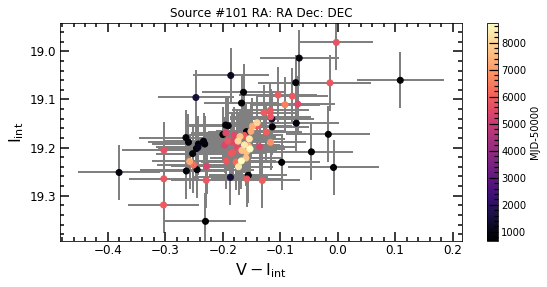

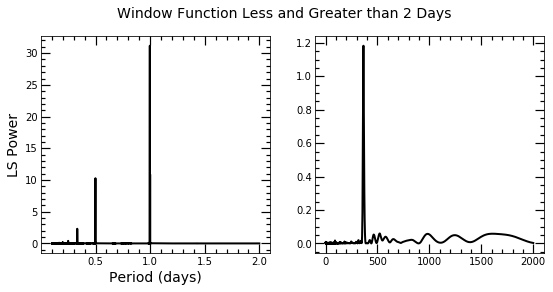

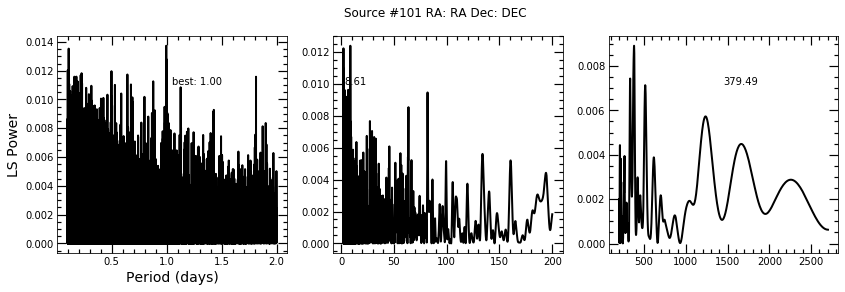

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


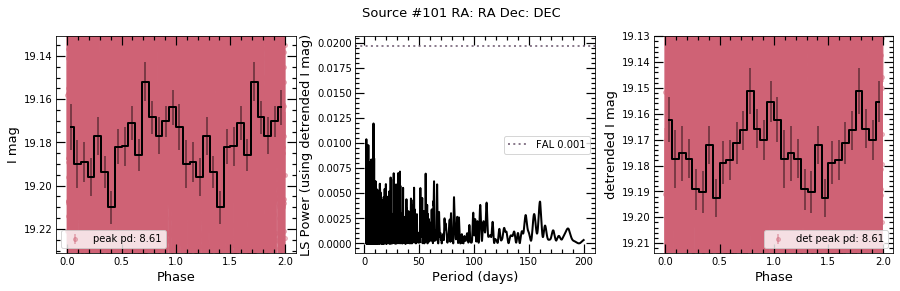

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 8.61183103464491 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 8.61183103464491 days (the detrended peak).


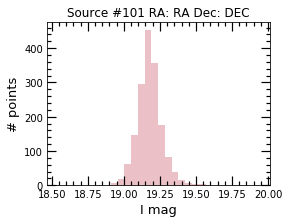



max I band:  19.941
min I band:  18.535
I range:  1.4059999999999988
I stdev:  0.08861303756301052
max V band:  19.234
min V band:  18.849
V range:  0.38500000000000156
V stdev:  0.06649075852824171


In [63]:
basic(44,pbins=16,saveall=save)

Original source number: 132
Current source number: 102
RA,Dec (deg): 16.122578, -72.52682
Established period: 29.75
NS spin period: nan
Separation: 2.2782803632779185


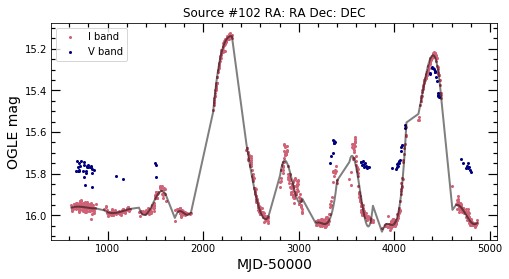

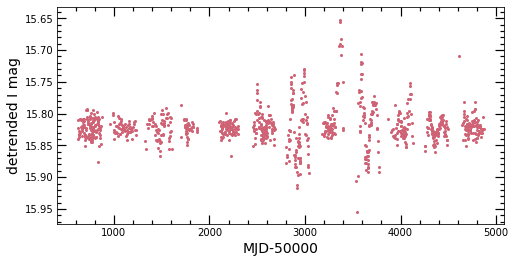

I and V-I correlation: -0.9647345966389136
V and V-I correlation: -0.9002903341106792


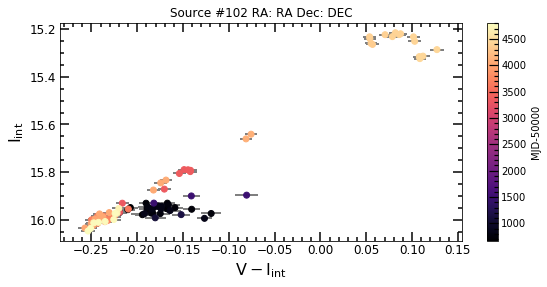

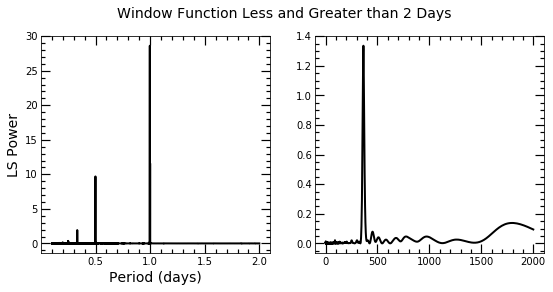

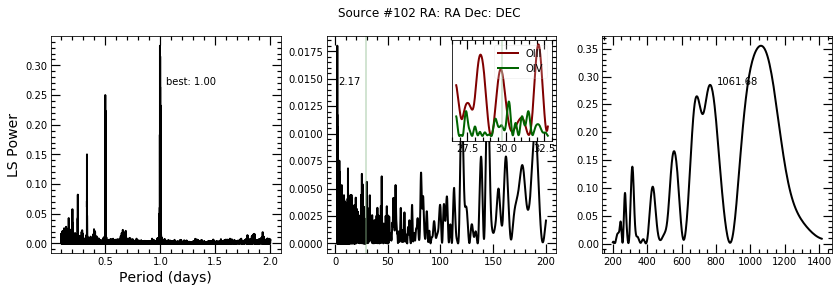

Phase-folding with established orbital period and highest peak within 2.98 days of that value...


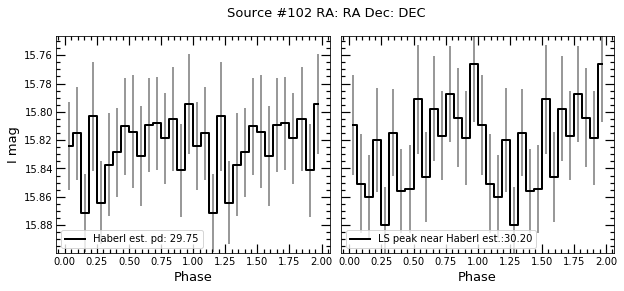

Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 100


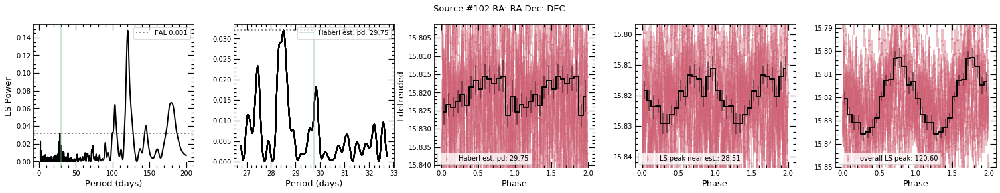

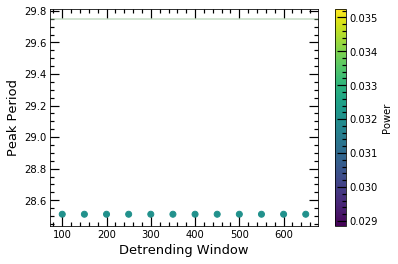

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of the established period.
There is at least one alias of the 0.1-2 day window function within a day of the established period.


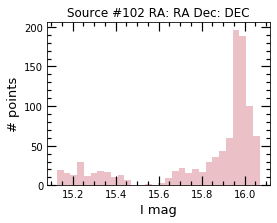



max I band:  16.07
min I band:  15.126
I range:  0.9440000000000008
I stdev:  0.26543803399506327
max V band:  15.866
min V band:  15.287
V range:  0.5789999999999988
V stdev:  0.16182345613565233


In [64]:
basic(45,pbins=16,saveall=save)


Original source number: 133
Current source number: 103
RA,Dec (deg): 16.147781, -72.363106
Established period: nan
NS spin period: nan
Separation: 1.2256164357677701


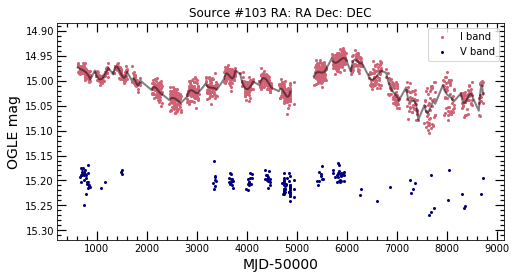

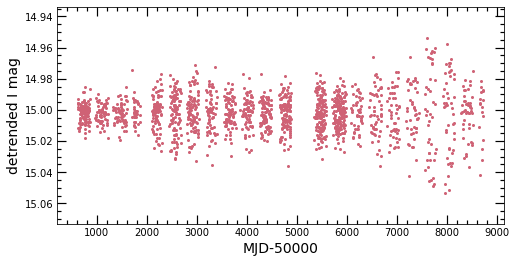

I and V-I correlation: -0.758292739506481
V and V-I correlation: -0.030963557107941103


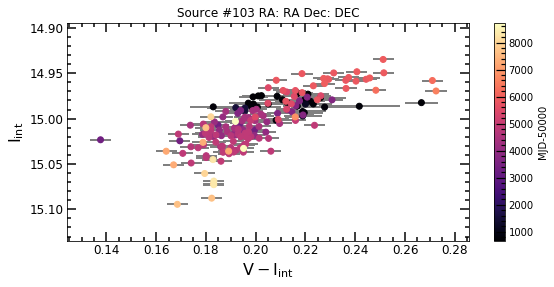

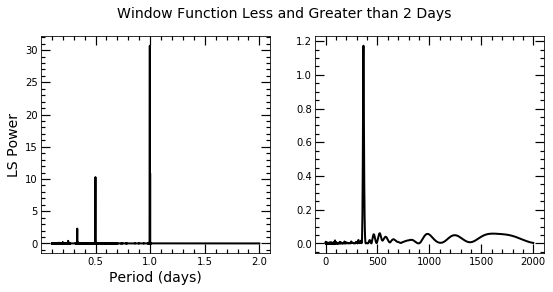

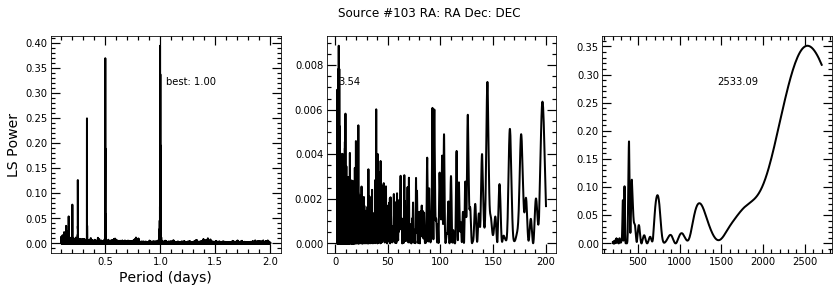

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


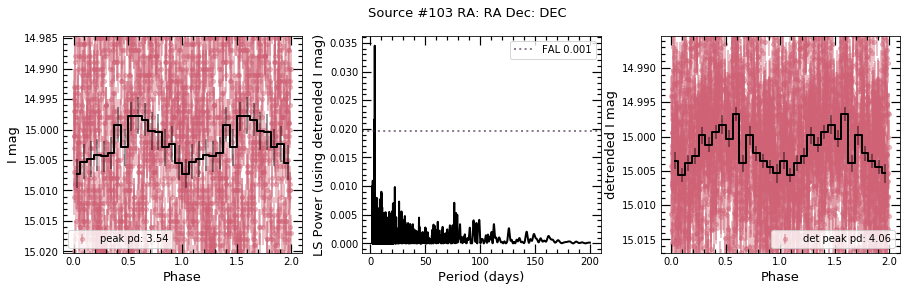

Comparing peaks of 0.1-2 day window function and detrended periodogram...
Beat period of highest peaks is 4.073716368479242.
There is at least one alias of the 0.1-2 day detrended search within a day of 4.063608598220921 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 4.063608598220921 days (the detrended peak).


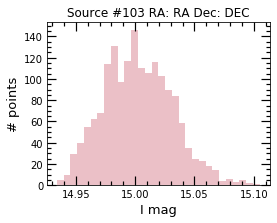



max I band:  15.105
min I band:  14.934
I range:  0.17100000000000115
I stdev:  0.028799009863389225
max V band:  15.27
min V band:  15.161
V range:  0.10899999999999999
V stdev:  0.01854787374034865


In [65]:
basic(46,pbins=16,saveall=save)

Original source number: 136
Current source number: 104
RA,Dec (deg): 16.637384, -73.26193
Established period: nan
NS spin period: nan
Separation: 0.7895092496738987


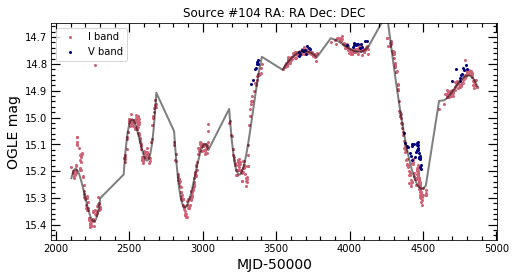

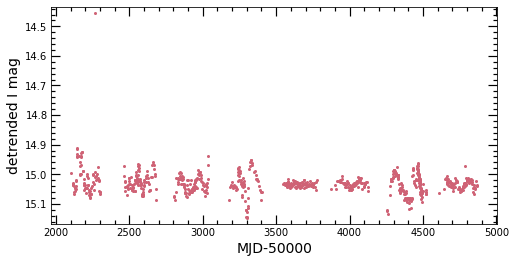

I and V-I correlation: -0.9106565350482855
V and V-I correlation: -0.8698268160040609


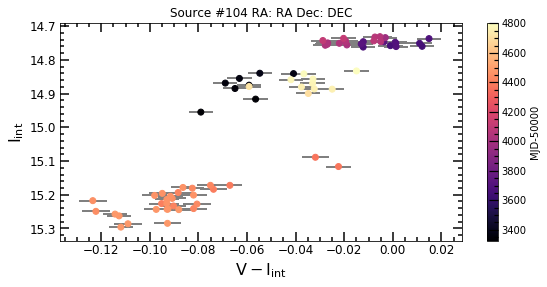

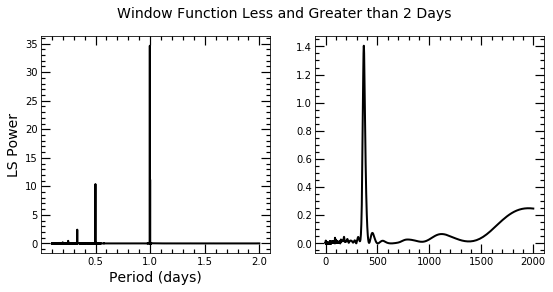

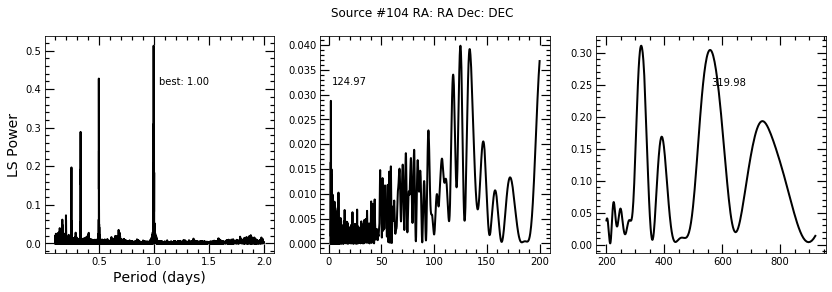

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


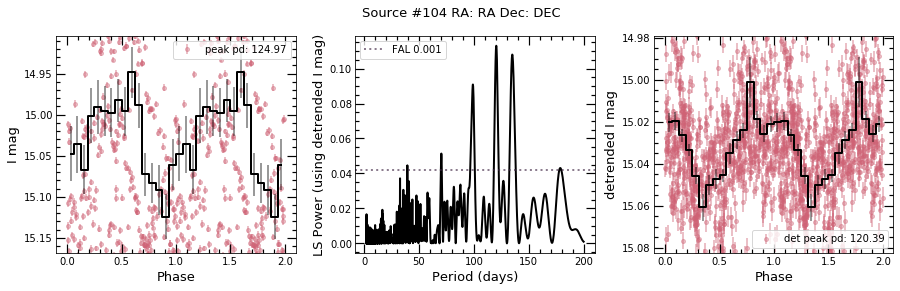

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 120.39478785308944 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 120.39478785308944 days (the detrended peak).


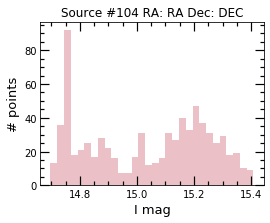



max I band:  15.408
min I band:  14.697
I range:  0.7110000000000003
I stdev:  0.208789924325467
max V band:  15.192
min V band:  14.714
V range:  0.47799999999999976
V stdev:  0.17802529227980976


In [66]:
basic(47,pbins=16,saveall=save)

Original source number: 138
Current source number: 105
RA,Dec (deg): 17.08409, -72.22975
Established period: nan
NS spin period: nan
Separation: 2.4513254433738694


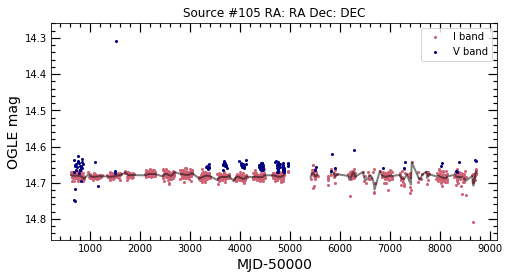

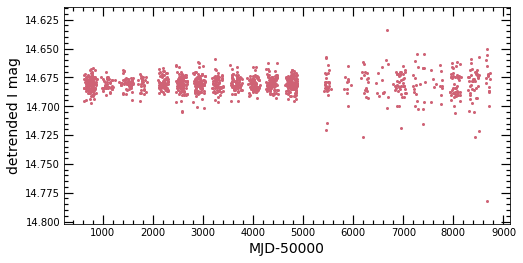

I and V-I correlation: -0.15874865892983878
V and V-I correlation: 0.9823385400628885


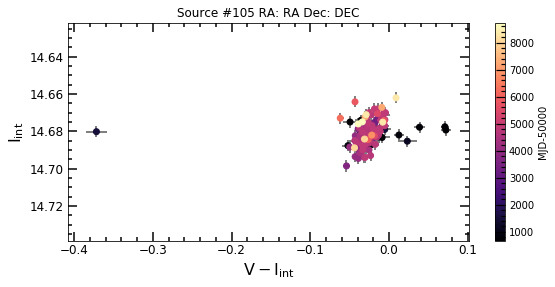

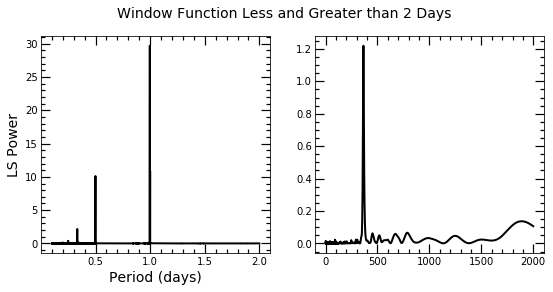

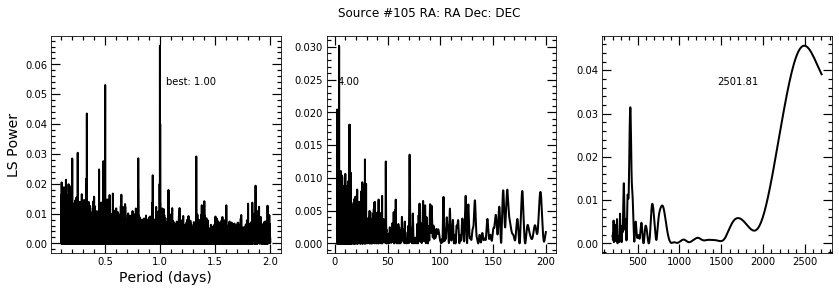

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


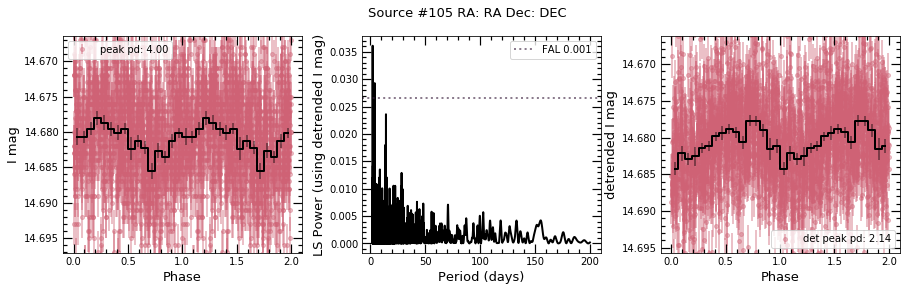

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 2.140351393431436 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 2.140351393431436 days (the detrended peak).


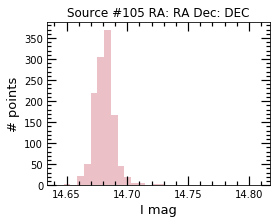



max I band:  14.809
min I band:  14.642
I range:  0.16699999999999982
I stdev:  0.009529005504904443
max V band:  14.751499999999998
min V band:  14.308499999999999
V range:  0.4429999999999996
V stdev:  0.033665545805910205


In [67]:
basic(48,pbins=16,saveall=save,calib=True) 

Original source number: 139
Current source number: 106
RA,Dec (deg): 18.764706, -73.47206
Established period: nan
NS spin period: nan
Separation: 1.804273525882011


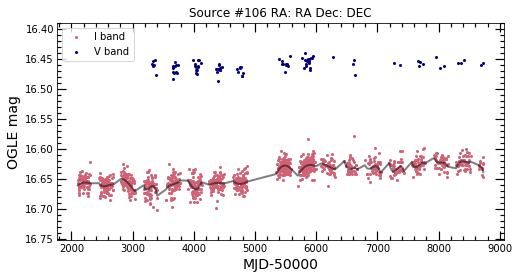

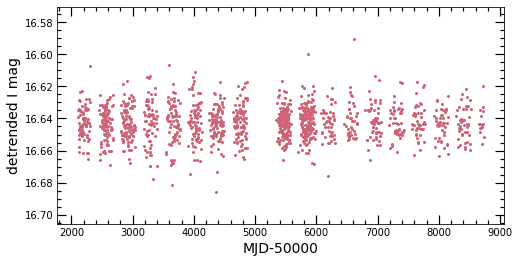

I and V-I correlation: -0.8559865848430388
V and V-I correlation: 0.0900490377071426


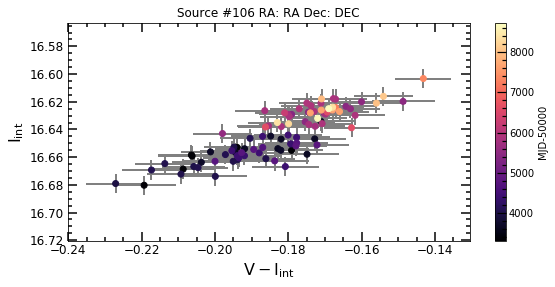

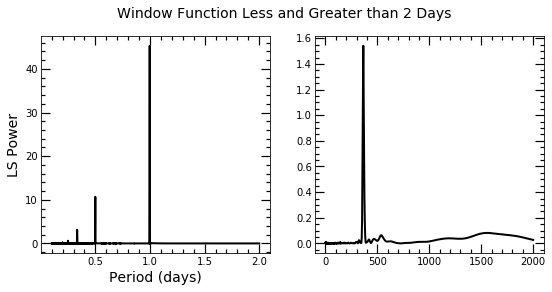

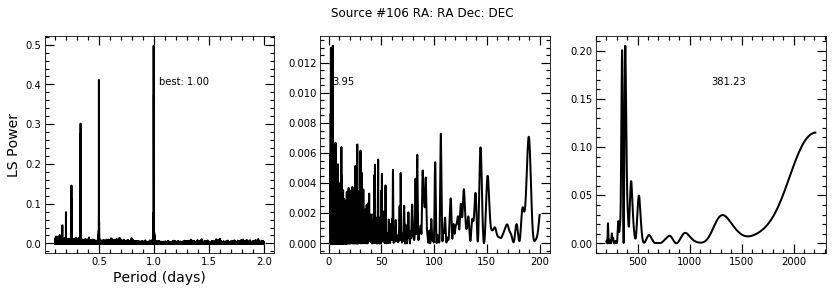

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


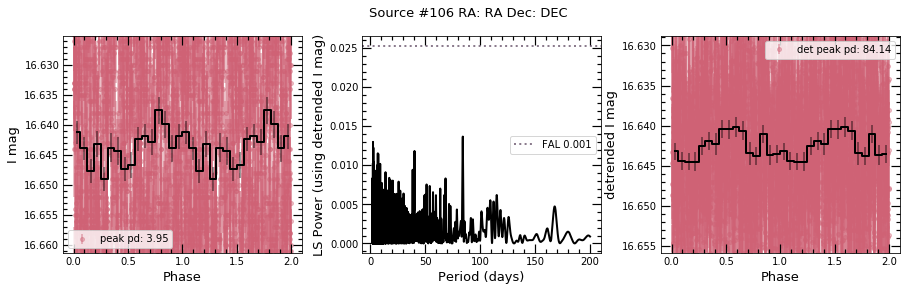

Comparing peaks of 0.1-2 day window function and detrended periodogram...


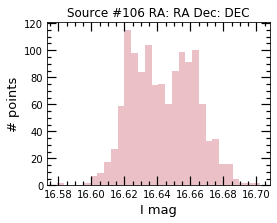



max I band:  16.702
min I band:  16.579
I range:  0.12300000000000111
I stdev:  0.019151826221241217
max V band:  16.486
min V band:  16.44
V range:  0.045999999999999375
V stdev:  0.008934727913086362


In [68]:
basic(49,pbins=16,saveall=save)

Original source number: 141
Current source number: 107
RA,Dec (deg): 19.91226, -73.50316
Established period: nan
NS spin period: nan
Separation: 0.17507451838220398


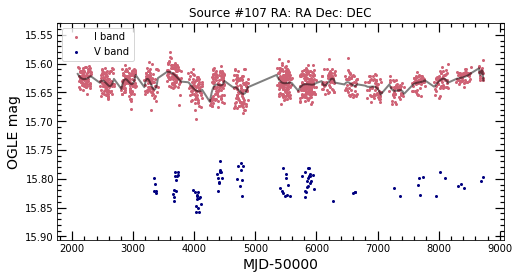

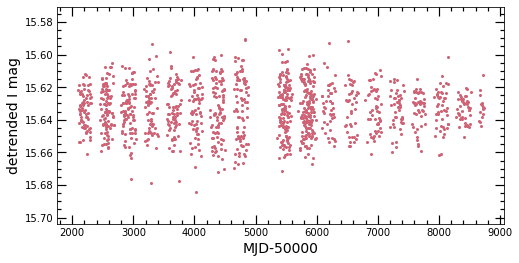

I and V-I correlation: -0.28979457065604036
V and V-I correlation: 0.6123295438089357


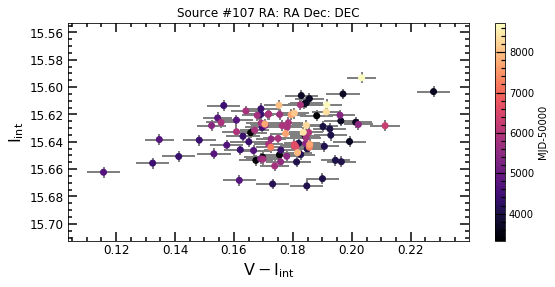

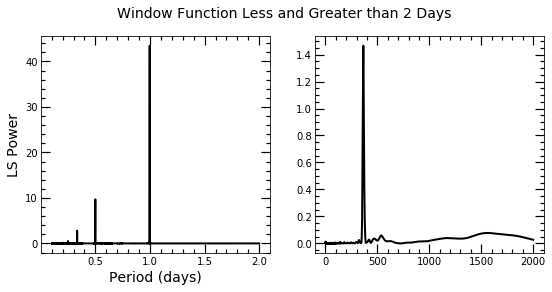

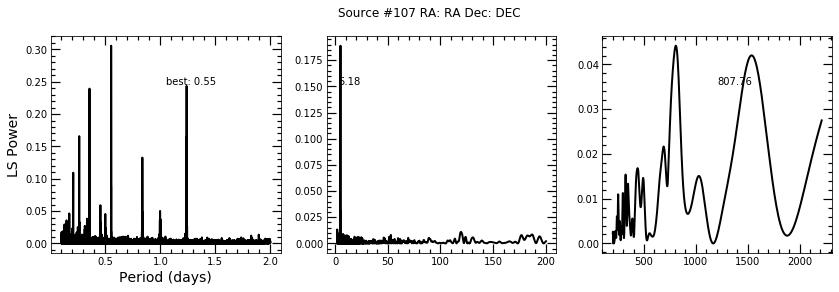

using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


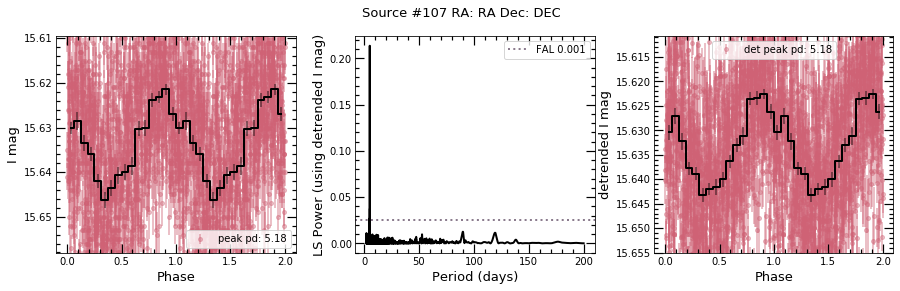

Comparing peaks of 0.1-2 day window function and detrended periodogram...
There is at least one alias of the 0.1-2 day detrended search within a day of 5.183795165425545 days (the detrended peak).
There is at least one alias of the 0.1-2 day window function within a day of 5.183795165425545 days (the detrended peak).


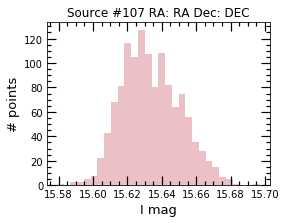



max I band:  15.697
min I band:  15.579
I range:  0.11799999999999855
I stdev:  0.016848233117387
max V band:  15.857
min V band:  15.77
V range:  0.08699999999999974
V stdev:  0.01943737258855274


In [69]:
basic(50,pbins=16,saveall=save,calib=True) #check calibration

### writing out peak dictionary
- be careful with this step: modified outside of notebook

In [70]:
peak_dict[141][0][:5] #example (top 5 peaks)

,period,power,ind
0,0.552537,0.305678,434853
1,1.239010,0.243464,101953
2,0.355546,0.239330,767754
3,0.262290,0.165864,1099745
4,1.234821,0.164168,102862


In [71]:
np.save('Feb23_part2peaks.npy', peak_dict) #writing out dictionary

In [72]:
read_dict = np.load('Feb23_part2peaks.npy',allow_pickle='TRUE').item() #testing that loading peak dict back in works

In [73]:
read_dict[141][0][:5] #same output!

,period,power,ind
0,0.552537,0.305678,434853
1,1.239010,0.243464,101953
2,0.355546,0.239330,767754
3,0.262290,0.165864,1099745
4,1.234821,0.164168,102862


In [74]:
summ.to_csv('Feb23_summtab.csv',index=False)

In [75]:
#write out phase table
phase.to_csv('Feb23_phasetab.csv',index=False)